In [2]:
import numpy as np
import matplotlib.pyplot as plt
import importlib
import final_forward_attenuation
importlib.reload(final_forward_attenuation)
from final_forward_attenuation import run_simulation, default_species, convert_atm, txt_to_npy, convert_vmr, plot_npy, plot_histogram, downsample, count_lines_by_index

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['H2O']
DEBUG: H2O iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q1.txt exists=True
DEBUG: H2O iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q2.txt exists=True
DEBUG: H2O iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q3.txt exists=True
DEBUG: H2O iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q4.txt exists=True
DEBUG: H2O iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q5.txt exists=True
DEBUG: H2O iso=6 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q6.txt exists=True
DEBUG: H2O iso=7 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q129.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

KeyboardInterrupt: 

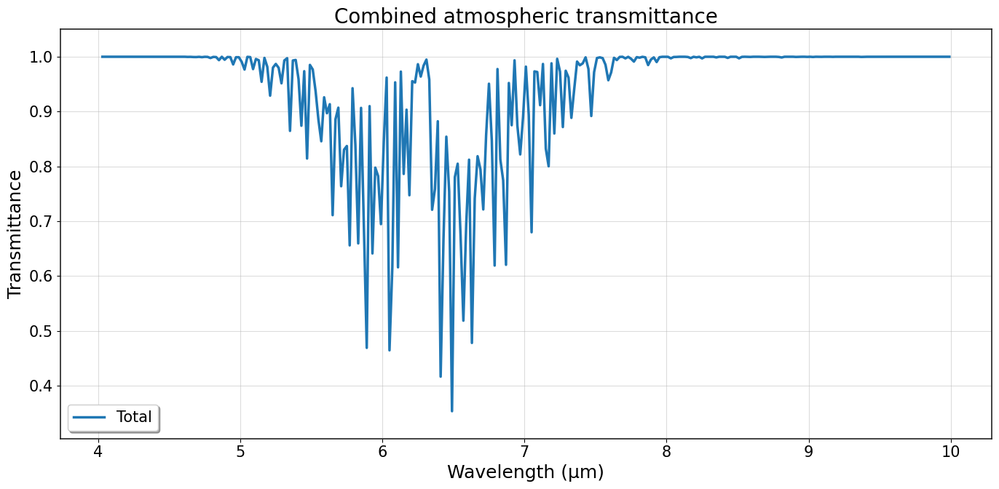

In [75]:
Ptotal = convert_atm(1013, "mbar")
T = 288.2

sp = default_species()
for s in sp:
     if s.name == 'H2O': s.Pmol = 0.0077480878361707375 
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=True, 
    att=False, transmission_npy_name='Simulated_Standard_H2O_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['H2O']

)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]

In [ ]:


prueba = np.load("SIMULATED/Simulated_Standard_H2O_4-10_1m.npy")                       # (3, 299)
trans  = np.load("GT_PROFE/Transmittance_Standard_H2O_4-10_1m.npy")        # (2, 644299)

lam_tgt = prueba[0]   # centros objetivo (misma resolución que "Prueba_Isotopologos")
lam_src = trans[0]
tau_src = trans[1]


edges = np.empty(lam_tgt.size + 1)
edges[1:-1] = 0.5 * (lam_tgt[:-1] + lam_tgt[1:])
edges[0]    = lam_tgt[0]  - 0.5 * (lam_tgt[1] - lam_tgt[0])
edges[-1]   = lam_tgt[-1] + 0.5 * (lam_tgt[-1] - lam_tgt[-2])


cum = np.concatenate([[0.0], np.cumsum(0.5 * (tau_src[:-1] + tau_src[1:]) * (lam_src[1:] - lam_src[:-1]))])

def cum_at(x):
    return np.interp(x, lam_src, cum)


area = cum_at(edges[1:]) - cum_at(edges[:-1])
tau_ds = area / (edges[1:] - edges[:-1])

valid = (edges[:-1] >= lam_src[0]) & (edges[1:] <= lam_src[-1])
tau_ds[~valid] = np.nan

out = np.vstack([lam_tgt, tau_ds])
np.save("SIMULATED/Transmittance_Standard_H2O_4-10_1m__downsampled_to_Prueba_Isotopologos.npy", out)


In [ ]:
# sim = np.load("SIMULATED/Simulated_Standard_H2O_4-10_1m.npy")  
# sim = sim[:, :-1]
# sim.shape
# np.save("SIMULATED/Simulated_Standard_H2O_4-10_1m.npy", sim)

In [ ]:
# gt = np.load("SIMULATED/Transmittance_Standard_H2O_4-10_1m__downsampled_to_Prueba_Isotopologos.npy") 
# gt = gt[:, :-1]
# gt.shape
# np.save("SIMULATED/Transmittance_Standard_H2O_4-10_1m__downsampled_to_Prueba_Isotopologos.npy", gt)

In [ ]:
gt = np.load("SIMULATED/Transmittance_Standard_H2O_4-10_1m__downsampled_to_Prueba_Isotopologos.npy")
sim = np.load("SIMULATED/Simulated_Standard_H2O_4-10_1m.npy")  
print(gt.shape)
print(sim.shape)

(2, 299)
(2, 299)


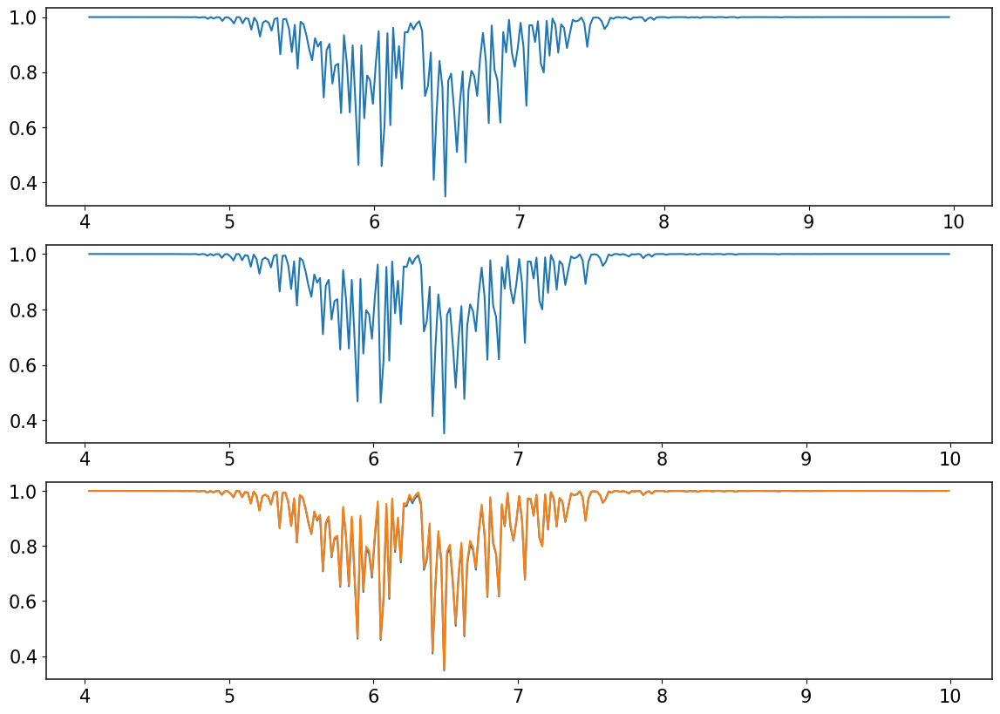

In [ ]:
gt = np.load("SIMULATED/Transmittance_Standard_H2O_4-10_1m__downsampled_to_Prueba_Isotopologos.npy")
sim = np.load("SIMULATED/Simulated_Standard_H2O_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
gt[0]-sim[0] #misma resolucion y muestreo

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

MAE: nan


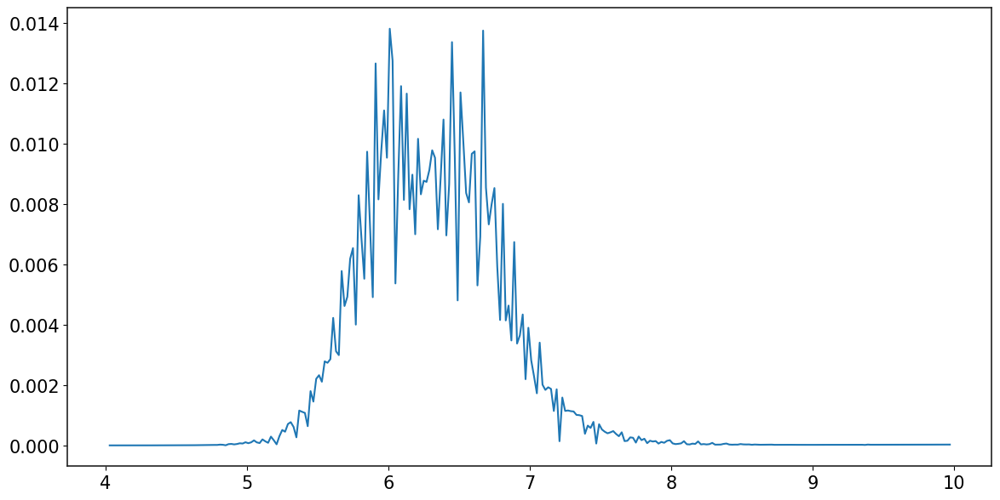

In [ ]:
residual = np.abs((gt[1]-sim[1]))
mae = np.mean(np.abs(gt[1]-sim[1]))
plt.figure(figsize=(14,7))
plt.plot(gt[0], residual)
print("MAE:", mae)

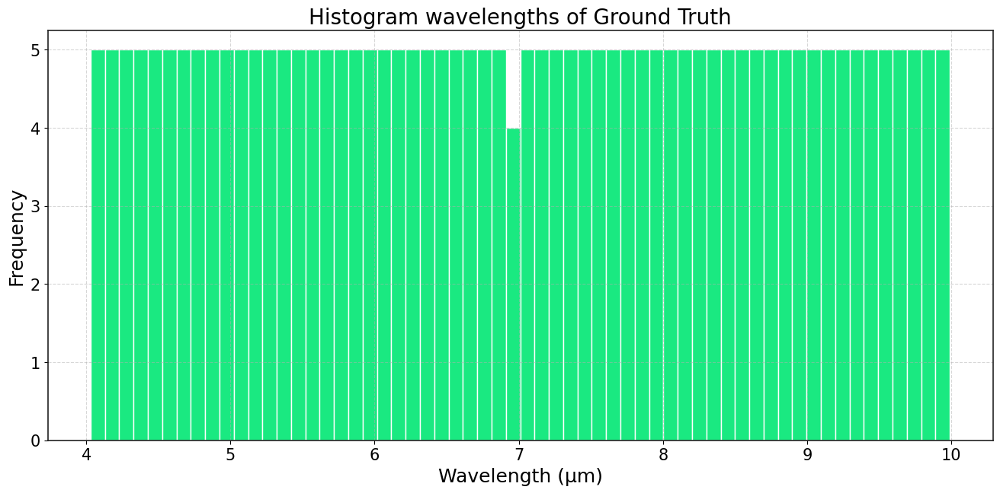

In [ ]:
plot_histogram(gt[0],name='Ground Truth')

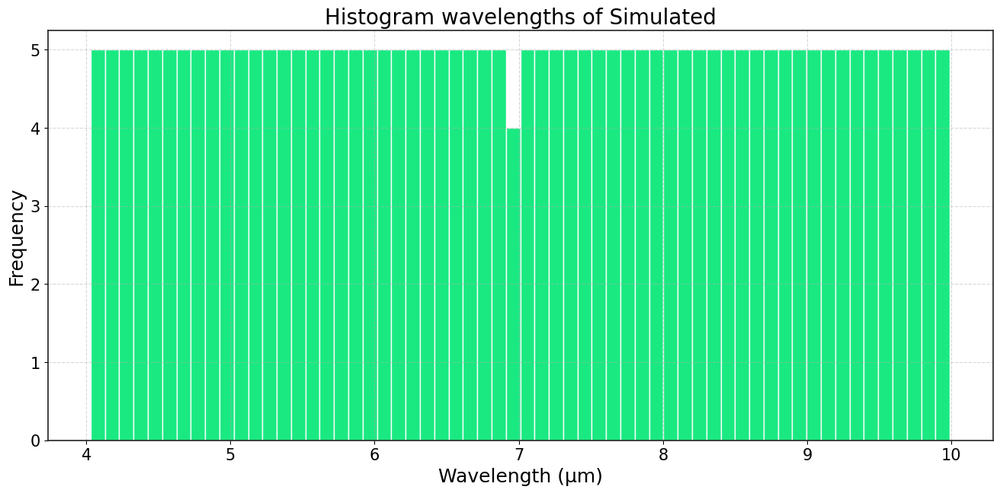

In [ ]:
plot_histogram(sim[0],name='Simulated')

CO2

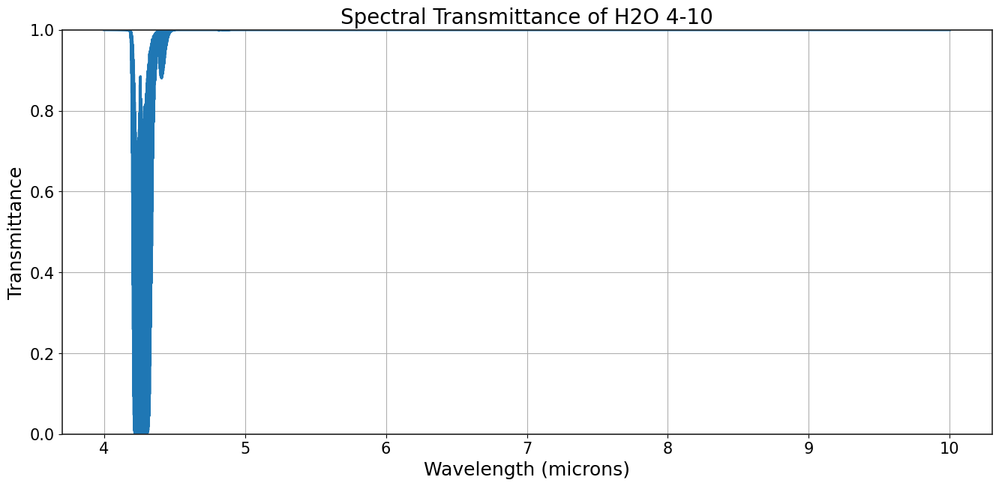

In [ ]:
'''ground truth'''
sign = np.load("GT_PROFE/Transmittance_Standard_CO2_4-10_1m.npy")
plot_npy(sign[0], sign[1], name='H2O 4-10')

In [ ]:
'''simulated'''
Ptotal = convert_atm(1013, "mbar")
T = 288.2

sp = default_species()
for s in sp:
     if s.name == 'CO2': s.Pmol = 0.0003299185788304959
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_Standard_CO2_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['CO2']

)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['CO2']
DEBUG: CO2 iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q7.txt exists=True
DEBUG: CO2 iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q8.txt exists=True
DEBUG: CO2 iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q9.txt exists=True
DEBUG: CO2 iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q10.txt exists=True
DEBUG: CO2 iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q11.txt exists=True
DEBUG: CO2 iso=6 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q12.txt exists=True
DEBUG: CO2 iso=7 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q13.txt exists=True
DEBUG: C

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
simulated = np.load("SIMULATED/Simulated_Standard_CO2_4-10_1m.npy")
gt = np.load("GT_PROFE/Transmittance_Standard_CO2_4-10_1m.npy")
output = "SIMULATED/Transmittance_Standard_CO2_4-10_1m__downsampled_to_Simulated_Standard_CO2_4-10_1m.npy"
downsample(simulated, gt, output)

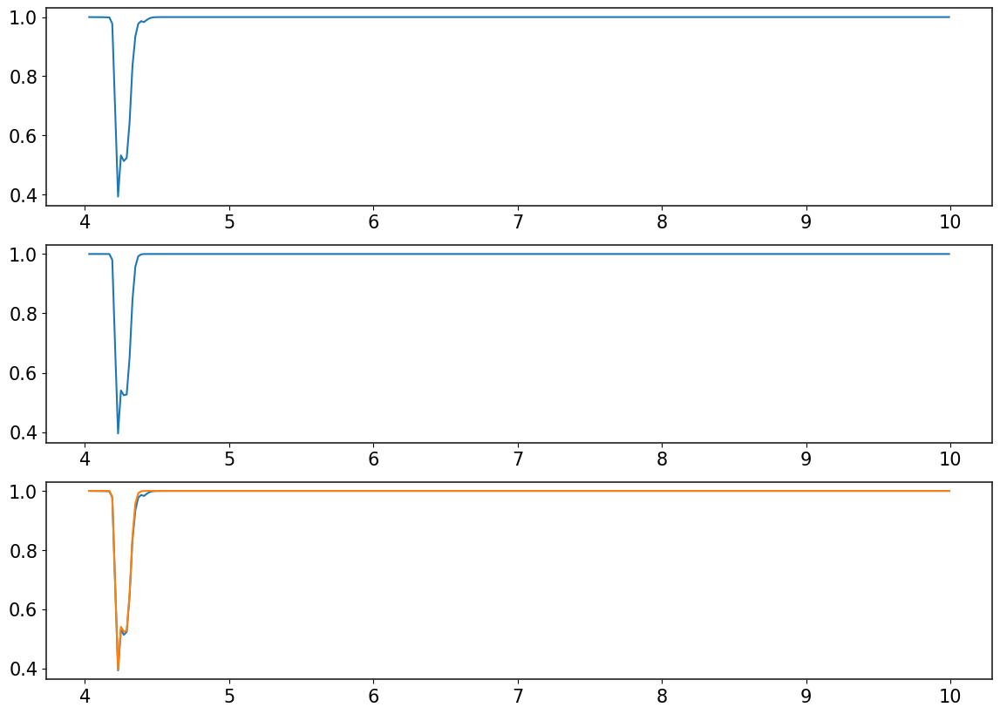

In [ ]:
gt = np.load("SIMULATED/Transmittance_Standard_CO2_4-10_1m__downsampled_to_Simulated_Standard_CO2_4-10_1m.npy")
sim = np.load("SIMULATED/Simulated_Standard_CO2_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.00044533563743631894


N2O

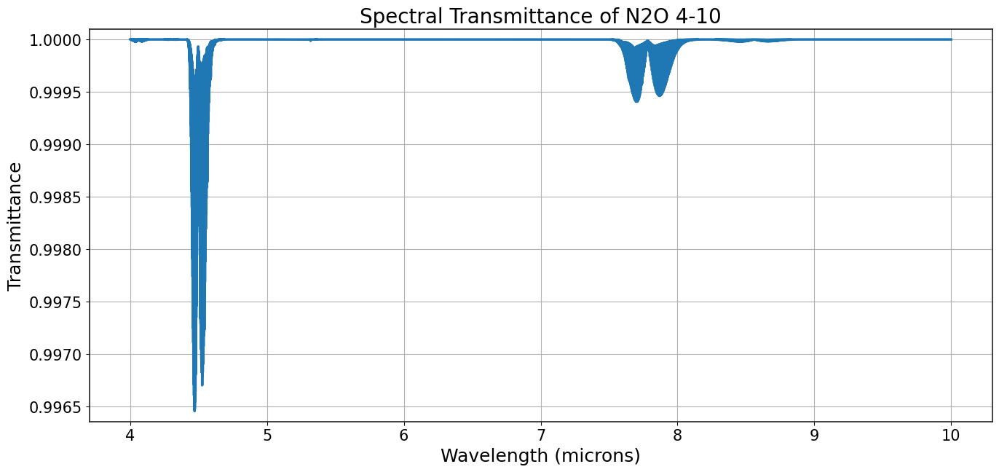

In [ ]:
'''N2O 4-10'''
wave, tr = np.load('GT_PROFE/N2O_4-10.npy')
name = 'N2O 4-10'
plot_npy(wave, tr, name=name)

In [ ]:
Ptotal = convert_atm(1013, "mbar")
3.2e-07 * Ptotal

3.1992104613866274e-07

## ***Prooving with N2O***

In [ ]:
'''simulated'''
Ptotal = convert_atm(1013, "mbar")
T = 288.2

sp = default_species()
for s in sp:
     if s.name == 'N2O': s.Pmol = 3.1992104613866274e-07
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_N2O_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['N2O']

)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['N2O']
DEBUG: N2O iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/N2O/q21.txt exists=True
DEBUG: N2O iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/N2O/q22.txt exists=True
DEBUG: N2O iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/N2O/q23.txt exists=True
DEBUG: N2O iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/N2O/q24.txt exists=True
DEBUG: N2O iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/N2O/q25.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("GT_PROFE/N2O_4-10.npy")
sim = np.load("SIMULATED/Simulated_N2O_4-10_1m.npy")  
output = "SIMULATED/Transmittance_N2O_4-10_1m__downsampled_to_Simulated_N2O_4-10_1m.npy"
downsample(sim, gt, output)

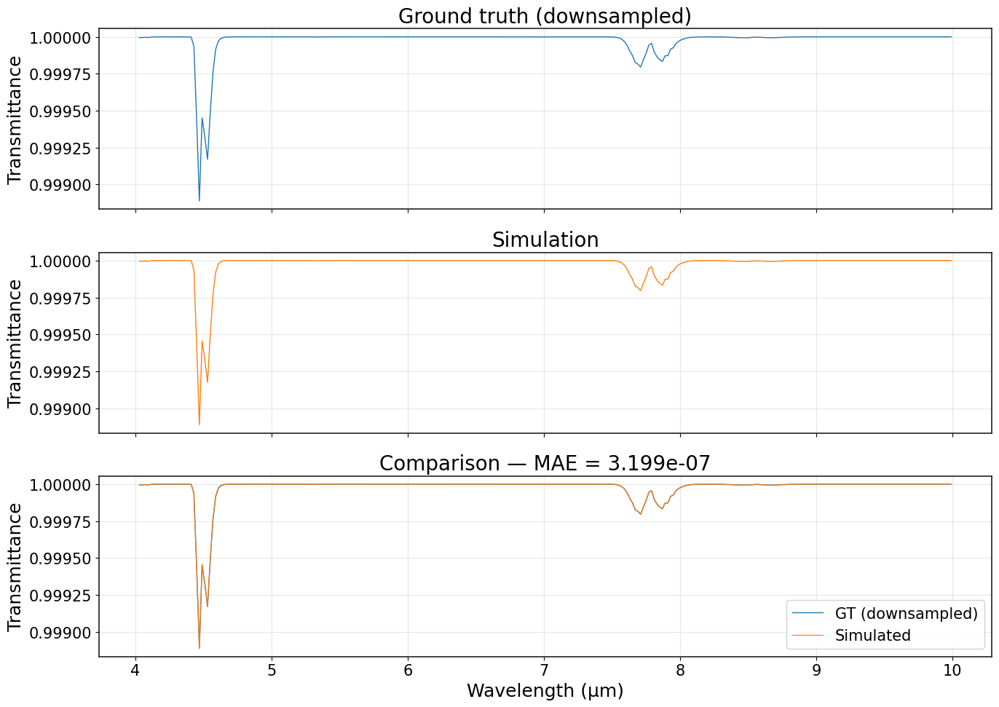

In [ ]:
gt = np.load("SIMULATED/Transmittance_N2O_4-10_1m__downsampled_to_Simulated_N2O_4-10_1m.npy")
sim = np.load("SIMULATED/Simulated_N2O_4-10_1m.npy")  
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

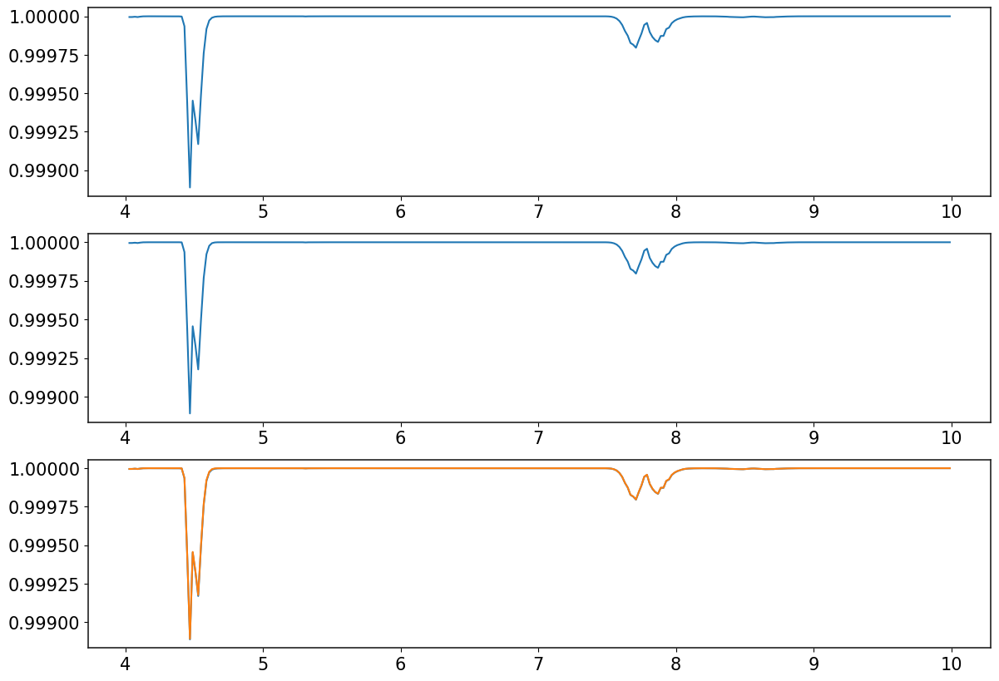

In [ ]:
gt = np.load("SIMULATED/Transmittance_N2O_4-10_1m__downsampled_to_Simulated_N2O_4-10_1m.npy")
sim = np.load("SIMULATED/Simulated_N2O_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 3.1985866154229614e-07


## ***Prooving with H2O***

In [ ]:
'''simulated'''
Ptotal = convert_atm(1013, "mbar")
T = 288.2

sp = default_species()
for s in sp:
     if s.name == 'H2O': s.Pmol = 0.0077480878361707375
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_H2O_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['H2O']
)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]


 

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['H2O']
DEBUG: H2O iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q1.txt exists=True
DEBUG: H2O iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q2.txt exists=True
DEBUG: H2O iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q3.txt exists=True
DEBUG: H2O iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q4.txt exists=True
DEBUG: H2O iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q5.txt exists=True
DEBUG: H2O iso=6 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q6.txt exists=True
DEBUG: H2O iso=7 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/H2O/q129.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Transmittance_Standard_H2O_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_H2O_4-10_1m.npy")  
output = "SIMULATED/Transmittance_H2O_4-10_1m__downsampled_to_Simulated_H2O_4-10_1m.npy"
downsample(sim, gt, output)

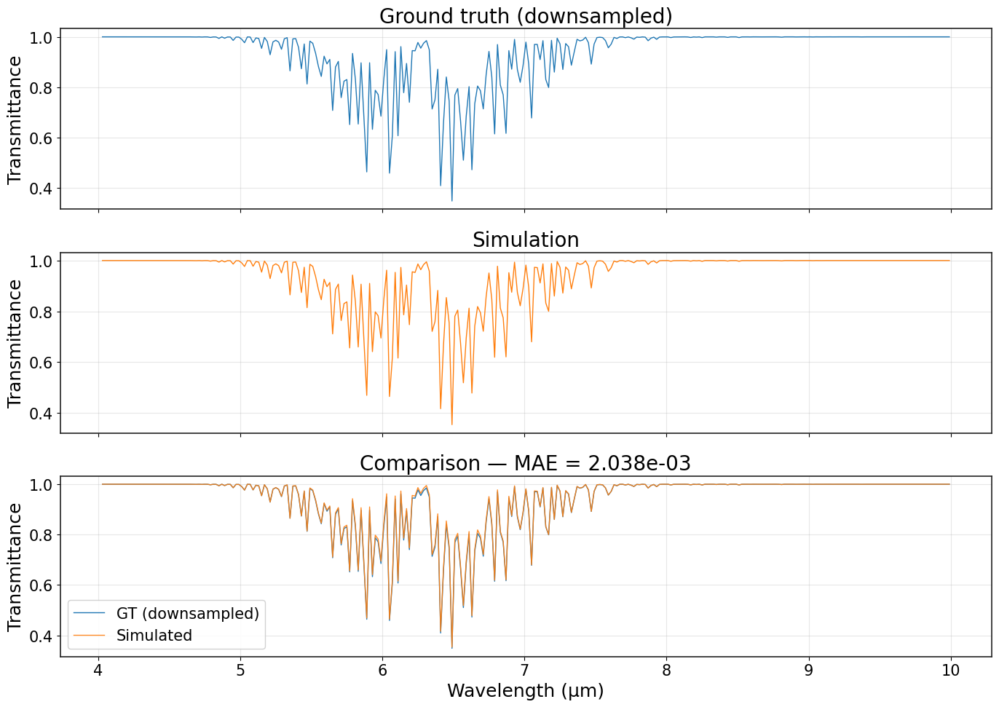

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_H2O_4-10_1m__downsampled_to_Simulated_H2O_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_H2O_4-10_1m.npy")

# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.002037520431004469


## ***Prooving with CO***

In [ ]:
'''simulated'''

vmr = 1.5e-07
Ptotal = convert_atm(1013, "mbar")
T = 288.2
Pmol = vmr * Ptotal
print(Pmol)

sp = default_species()
for s in sp:
     if s.name == 'CO': s.Pmol = Pmol
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_CO_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['CO']
)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]


 

1.4996299037749815e-07
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['CO']
DEBUG: CO iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q26.txt exists=True
DEBUG: CO iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q27.txt exists=True
DEBUG: CO iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q28.txt exists=True
DEBUG: CO iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q29.txt exists=True
DEBUG: CO iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q30.txt exists=True
DEBUG: CO iso=6 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO/q31.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/CO_4-10.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO_4-10_1m.npy")  
output = "SIMULATED/Transmittance_CO_4-10_1m__downsampled_to_Simulated_CO_4-10_1m.npy"
downsample(sim, gt, output)

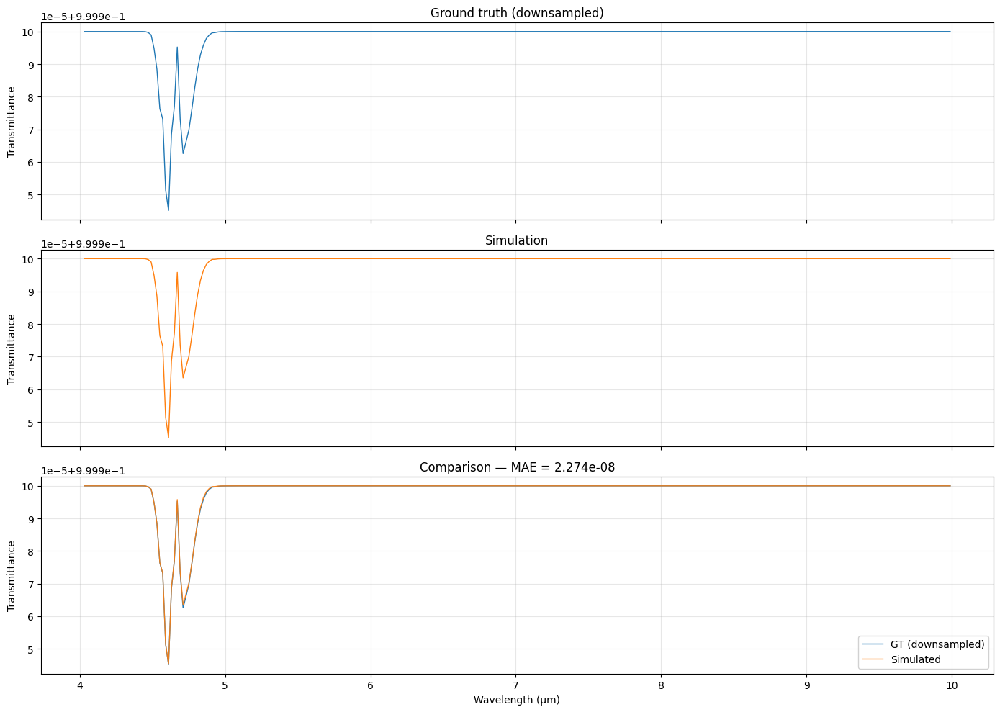

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CO_4-10_1m__downsampled_to_Simulated_CO_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO_4-10_1m.npy")  
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

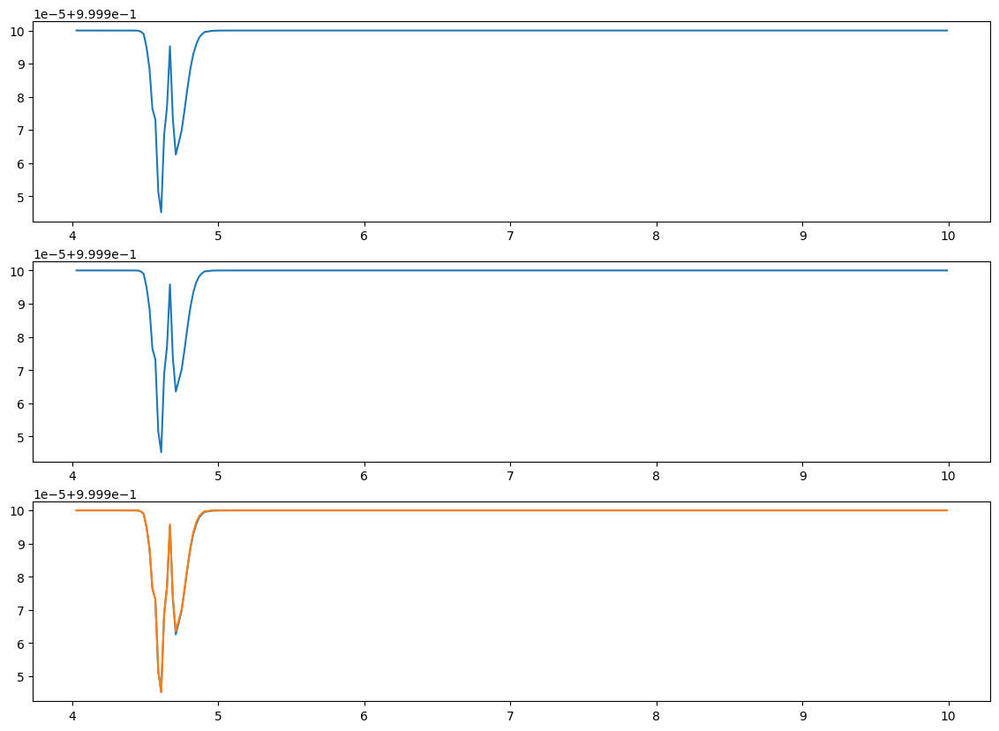

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CO_4-10_1m__downsampled_to_Simulated_CO_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 2.273570789791554e-08


## ***Prooving CH4***

In [ ]:
'''simulated'''

vmr = 1.7e-06
Ptotal = convert_atm(1013, "mbar")
T = 288.2
Pmol = vmr * Ptotal
print(Pmol)
sp = default_species()
for s in sp:
     if s.name == 'CH4': s.Pmol = Pmol
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_CH4_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['CH4']
)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]


 

1.6995805576116458e-06
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['CH4']
DEBUG: CH4 iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q32.txt exists=True
DEBUG: CH4 iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q33.txt exists=True
DEBUG: CH4 iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q34.txt exists=True
DEBUG: CH4 iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q35.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/CH4_4-10.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CH4_4-10_1m.npy")  
output = "SIMULATED/Transmittance_CH4_4-10_1m__downsampled_to_Simulated_CH4_4-10_1m.npy"
downsample(sim, gt, output)

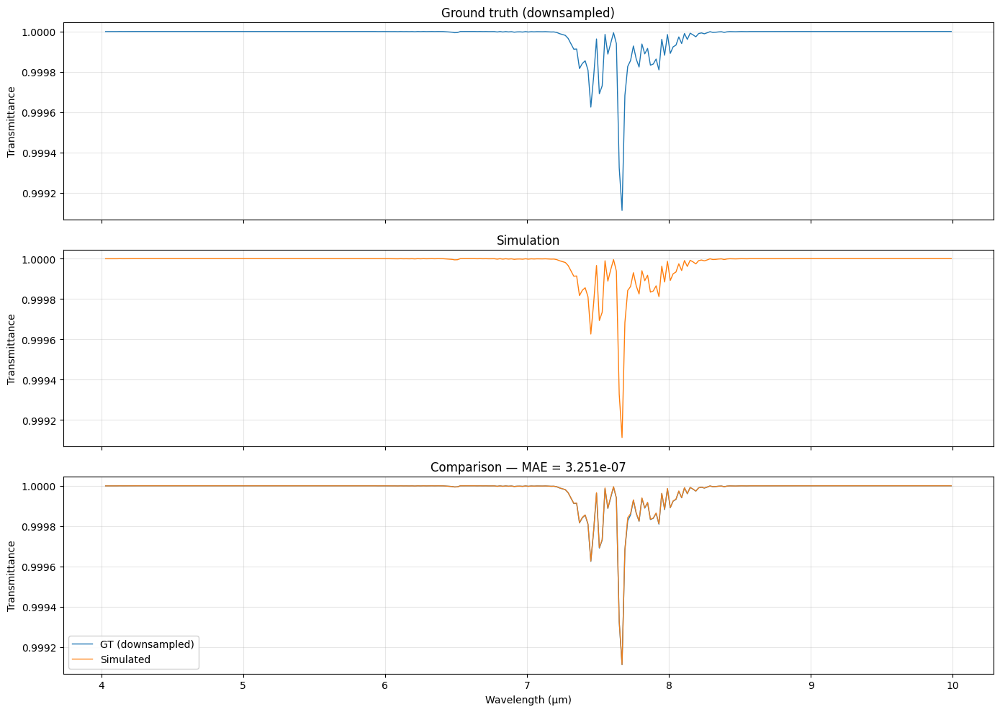

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CH4_4-10_1m__downsampled_to_Simulated_CH4_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CH4_4-10_1m.npy")  
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

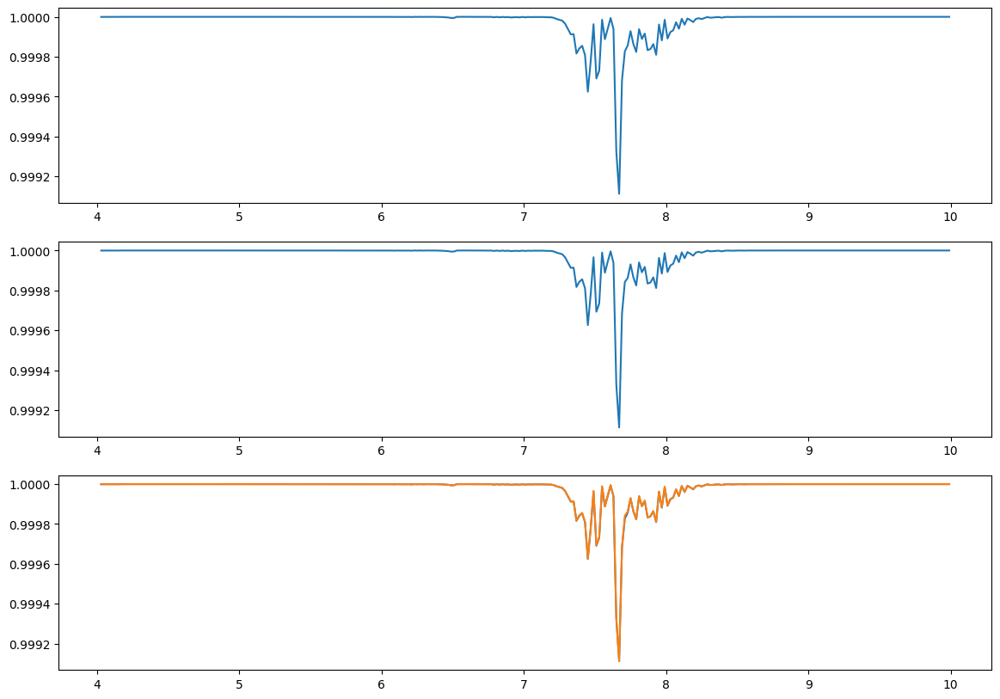

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CH4_4-10_1m__downsampled_to_Simulated_CH4_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CH4_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 3.2506988939547646e-07


## ***Prooving O3***

In [ ]:
'''simulated'''

vmr = 2.66e-08
Ptotal = convert_atm(1013, "mbar")
T = 288.2
Pmol = vmr * Ptotal
print(Pmol)
sp = default_species()
for s in sp:
     if s.name == 'O3': s.Pmol = Pmol
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_O3_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['O3']
)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]


 

2.6593436960276338e-08
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['O3']
DEBUG: O3 iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/O3/q16.txt exists=True
DEBUG: O3 iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/O3/q17.txt exists=True
DEBUG: O3 iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/O3/q18.txt exists=True
DEBUG: O3 iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/O3/q19.txt exists=True
DEBUG: O3 iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/O3/q20.txt exists=True


/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/O3_4-10um_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_O3_4-10_1m.npy")  
output = "SIMULATED/Transmittance_O3_4-10_1m__downsampled_to_Simulated_O3_4-10_1m.npy"
downsample(sim, gt, output)

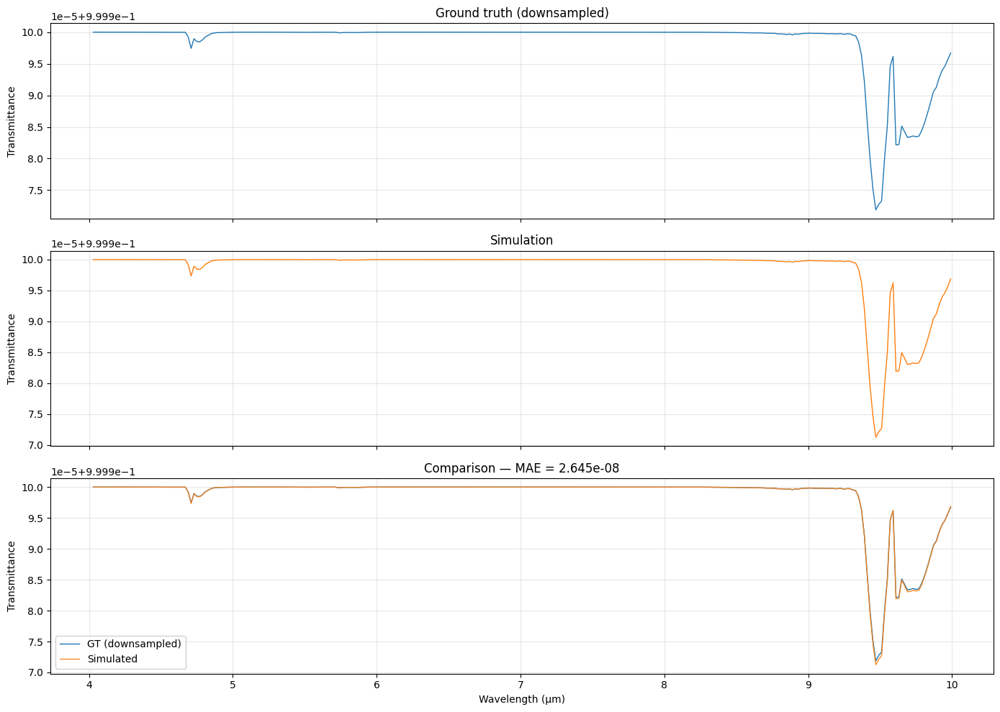

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_O3_4-10_1m__downsampled_to_Simulated_O3_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_O3_4-10_1m.npy")
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

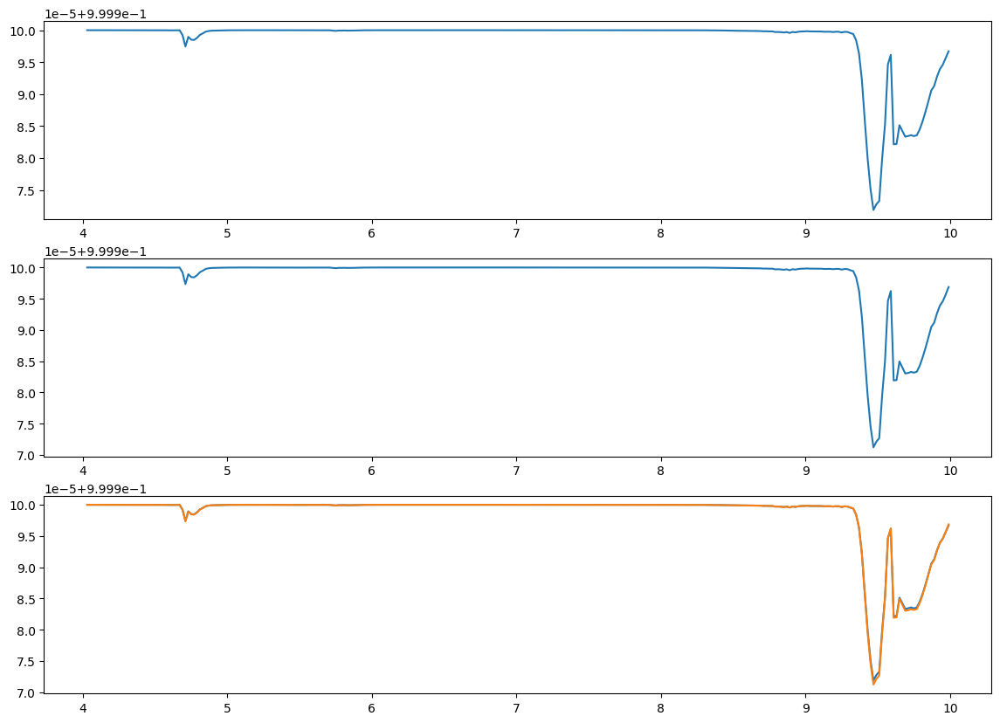

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_O3_4-10_1m__downsampled_to_Simulated_O3_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_O3_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 2.64467157612395e-08


## ***Prooving CO2***

In [ ]:
'''simulated'''

vmr = 0.00033
Ptotal = convert_atm(1013, "mbar")
T = 288.2
Pmol = vmr * Ptotal
print(Pmol) 
sp = default_species()
for s in sp:
     if s.name == 'CO2': s.Pmol = Pmol
     else: s.Pmol = 0.0
    

import os
print(os.getcwd())

res = run_simulation(
    species=sp,
    parfile='/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par',
    nu_min=1000, nu_max=2500, dnu=0.01,
    tileW=20.0, guard=5.0,
    temp_K=T, L_m=1.0, pres=Ptotal,
    delta_um=0.020,
    save_csv=True, outdir='OUT', make_plots=False, 
    att=False, transmission_npy_name='Simulated_CO2_4-10_1m.npy',
    use_all_isotopologues=True, species_to_use=['CO2']
)

lambda_um = res['lambda_centers']
Tprod = res['T_prod_samp']
Tco2  = res['T_each_samp'][0]

0.0003299185788304959
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off
Using species: ['CO2']
DEBUG: CO2 iso=1 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q7.txt exists=True
DEBUG: CO2 iso=2 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q8.txt exists=True
DEBUG: CO2 iso=3 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q9.txt exists=True
DEBUG: CO2 iso=4 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q10.txt exists=True
DEBUG: CO2 iso=5 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q11.txt exists=True
DEBUG: CO2 iso=6 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q12.txt exists=True
DEBUG: CO2 iso=7 qfile=/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CO2/q13.tx

/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/final_forward_attenuation.py:265: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(qfile, header=None, delim_whitespace=True, comment='#')
/home/jleon13/Docum

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Transmittance_Standard_CO2_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO2_4-10_1m.npy")  
output = "SIMULATED/Transmittance_CO2_4-10_1m__downsampled_to_Simulated_CO2_4-10_1m.npy"
downsample(sim, gt, output)

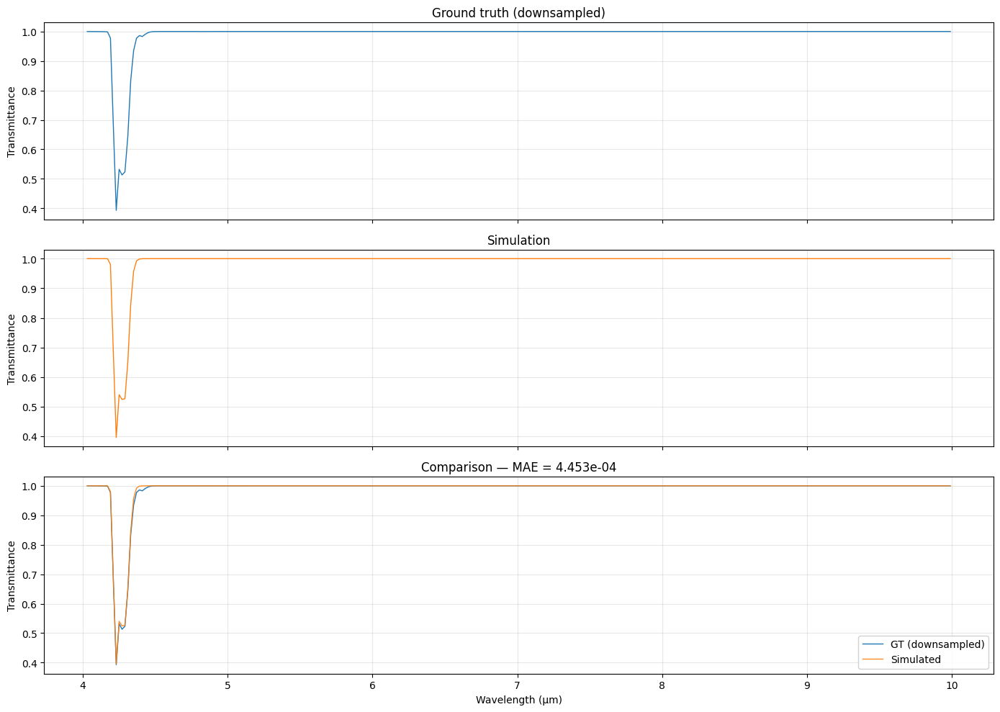

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CO2_4-10_1m__downsampled_to_Simulated_CO2_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO2_4-10_1m.npy")  
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

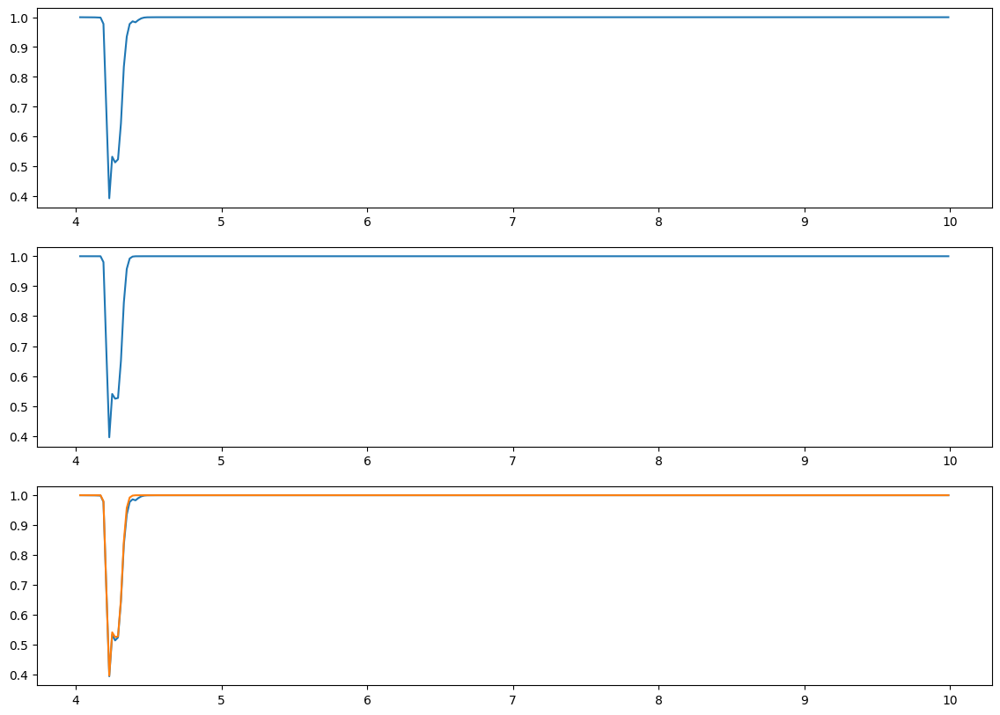

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_CO2_4-10_1m__downsampled_to_Simulated_CO2_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_CO2_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.00044533563743631894


### ***Change format of the all combined data***

In [ ]:
import numpy as np


data = np.loadtxt('/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE_TXT/Standard_All_4-30um_1m.txt') 
np.save('/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Standard_All_4-30um_1m.npy', data)

print(f"Shape of data: {data.shape}")
print(f"Data saved to output.npy")

Shape of data: (1046074, 2)
Data saved to output.npy


## ***Prooving all gases***

In [10]:
import inspect
import final_forward_attenuation_lsf as ffa
print(inspect.signature(ffa.run_simulation))
print(ffa.run_simulation.__doc__)

(species: 'List[Species]', parfile: 'str' = '/home/jleon13/Documents/AFOSR project/Py4catsForward/Py4cats_Tinkering/680HIT87b.par', nu_min: 'float' = 666.67, nu_max: 'float' = 10000.0, dnu: 'float' = 0.01, tileW: 'float' = 20.0, guard: 'float' = 25.0, temp_K: 'float' = 296.0, L_m: 'float' = 1.0, pres: 'float' = 1.0, delta_um: 'float' = 0.02, save_csv: 'bool' = False, outdir: 'str' = 'OUT', make_plots: 'bool' = True, att: 'bool' = True, use_all_isotopologues: 'bool' = False, simulated_dir: 'str' = 'SIMULATED', transmission_npy_name: 'str | None' = None, species_to_use: 'List[str] | None' = None, lsf: 'Dict[str, Any] | None' = None) -> 'Dict[str, Any]'

    Compute transmittances/attenuations and return sampled results.

    lsf (optional):
        Example: lsf={"kind":"gaussian","W_cm1":2.0,"domain":"tau"}
        Applied in nu-domain BEFORE lambda binning.
    


In [11]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Standard_All_4-30um_1m.npy")
gt = np.transpose(gt)
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALLGASES_4-10_1m.npy")  
output = "SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy"
downsample(sim, gt, output)

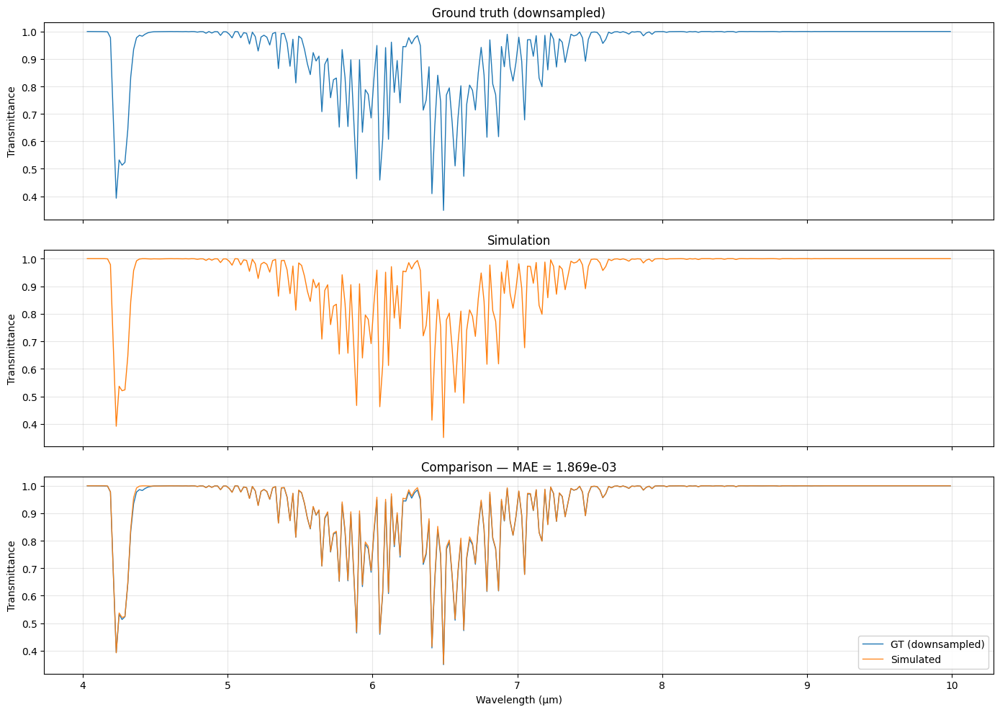

In [12]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/ALL_4-10_downsampled.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_best.npy")  
# unpack (uses your unpack_spectrum helper)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

# robust MAE: interpolate simulated onto GT wavelengths inside sim range
mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
mae = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))

fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## **Zoom**

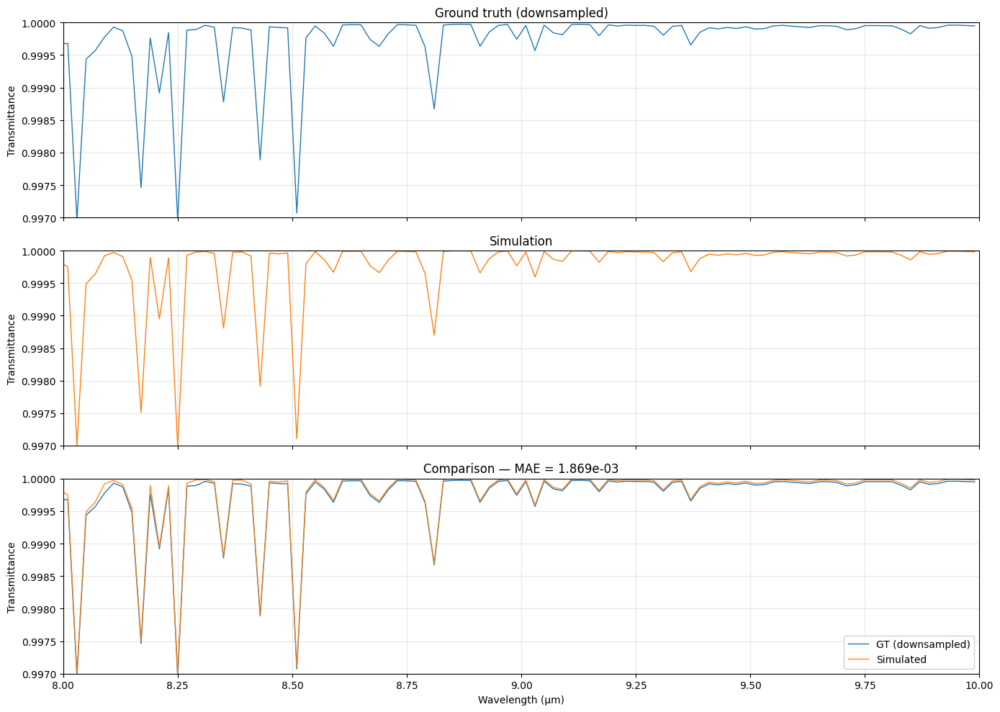

In [13]:
# ...existing code...
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].plot(lam_gt, y_gt, color='C0', lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Transmittance")
axes[0].grid(alpha=0.3)

axes[1].plot(lam_sim, y_sim, color='C1', lw=1)
axes[1].set_title("Simulation")
axes[1].set_ylabel("Transmittance")
axes[1].grid(alpha=0.3)

axes[2].plot(lam_gt, y_gt, label='GT (downsampled)', color='C0', lw=1)
axes[2].plot(lam_sim, y_sim, label='Simulated', color='C1', lw=1, alpha=0.9)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Transmittance")
axes[2].legend(loc='best', framealpha=0.9)
axes[2].grid(alpha=0.3)

# --- Zoom: x between 8 and 10 µm, y between 0.8 and 1.0 (transmittance) ---
for ax in axes:
    ax.set_xlim(8.0, 10.0)

# Apply transmittance y-limits to the three linear transmittance panels
axes[0].set_ylim(0.9970, 1.0)
axes[1].set_ylim(0.9970, 1.0)
axes[2].set_ylim(0.9970, 1.0)

plt.tight_layout()
plt.show()
# ...existing code...

## Other things

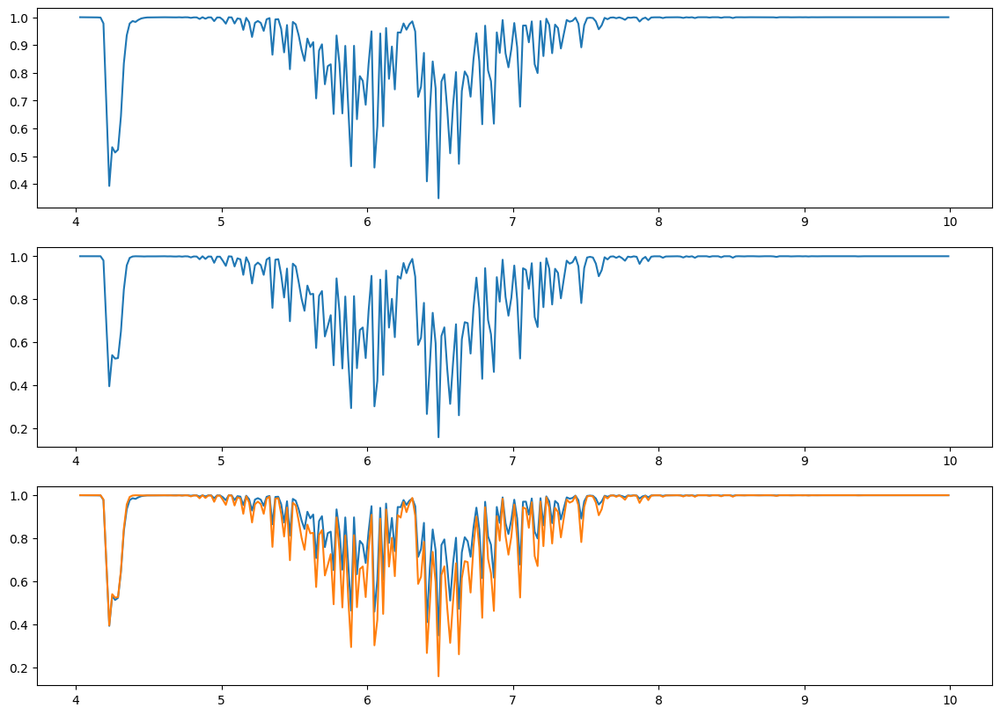

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALLGASES_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.033921069205661486


## ***Metrics***

In [2]:
import numpy as np

def unpack_spectrum(a):
    a = np.asarray(a)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D, got {a.shape}")
    if a.shape[0] == 2:      # (2, N)
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:    # (N, 2)
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    return np.asarray(lam, float), np.asarray(y, float)


In [3]:
import numpy as np

def spectrum_metrics(y_true, y_pred, eps=1e-12):
    y_true = np.asarray(y_true, float)
    y_pred = np.asarray(y_pred, float)

    m = np.isfinite(y_true) & np.isfinite(y_pred)
    y_true = y_true[m]
    y_pred = y_pred[m]

    e = y_pred - y_true

    mae  = np.mean(np.abs(e))
    mse  = np.mean(e**2)
    rmse = np.sqrt(mse)
    medae = np.median(np.abs(e))
    maxae = np.max(np.abs(e))

    rel_l1 = np.sum(np.abs(e)) / (np.sum(np.abs(y_true)) + eps)

    mape  = np.mean(np.abs(e) / (np.abs(y_true) + eps))
    smape = np.mean(2.0 * np.abs(e) / (np.abs(y_true) + np.abs(y_pred) + eps))

    # Correlation + R2
    corr = np.corrcoef(y_true, y_pred)[0, 1] if y_true.size > 1 else np.nan
    ss_res = np.sum(e**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2) + eps
    r2 = 1.0 - ss_res / ss_tot

    # Spectral Angle Mapper (degrees) — very common in hyperspectral
    num = float(np.dot(y_true, y_pred))
    den = float(np.linalg.norm(y_true) * np.linalg.norm(y_pred) + eps)
    sam_deg = float(np.degrees(np.arccos(np.clip(num / den, -1.0, 1.0))))

    return {
        "MAE": mae,
        "RMSE": rmse,
        "MedAE": medae,
        "MaxAE": maxae,
        "RelL1": rel_l1,
        "MAPE": mape,
        "sMAPE": smape,
        "Corr": corr,
        "R2": r2,
        "SAM_deg": sam_deg,
    }


In [ ]:
lam_gt, y_gt = unpack_spectrum(gt)
lam_sm, y_sm = unpack_spectrum(sim)

# IMPORTANT: only valid if they’re already on the same wavelength grid!
print(spectrum_metrics(y_gt, y_sm))


{'MAE': 3.1985866154229614e-07, 'RMSE': 1.1212662814107216e-06, 'MedAE': 2.1996875432250818e-09, 'MaxAE': 8.36967499939778e-06, 'RelL1': 3.198663370801255e-07, 'MAPE': 3.1995375891535815e-07, 'sMAPE': 3.1995312975328157e-07, 'Corr': 0.9999782425504787, 'R2': 0.9998917712823657, 'SAM_deg': 6.176153944376663e-05}


## ***With LSF - W_um: 0.020***

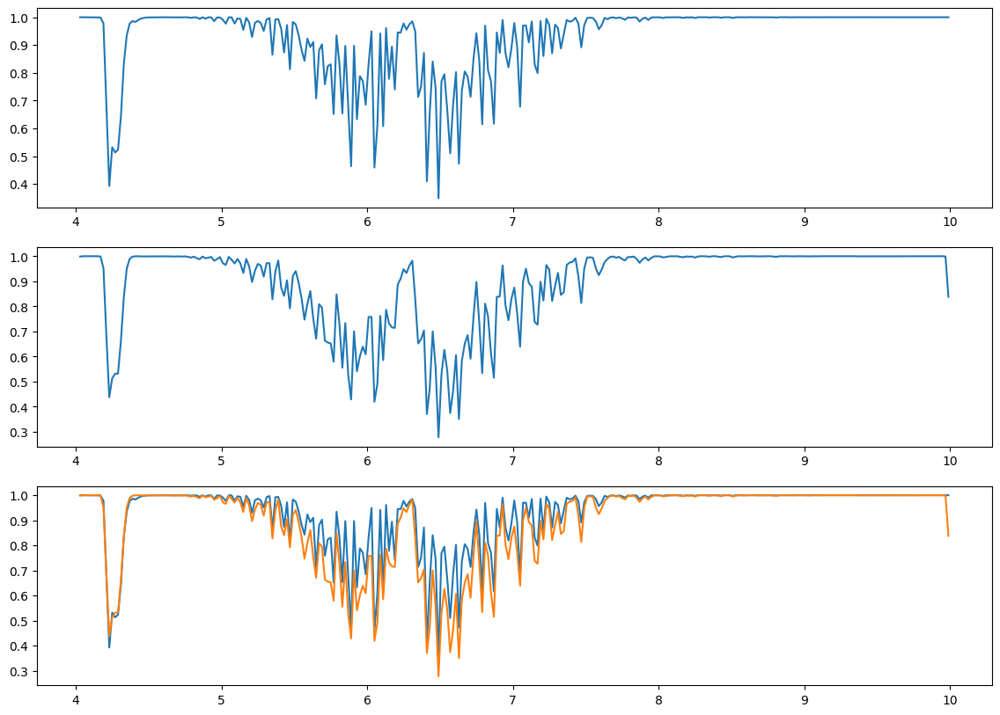

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_1m_LSF.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.034731136438656524


## ***With LSF - W_um: 0.005***

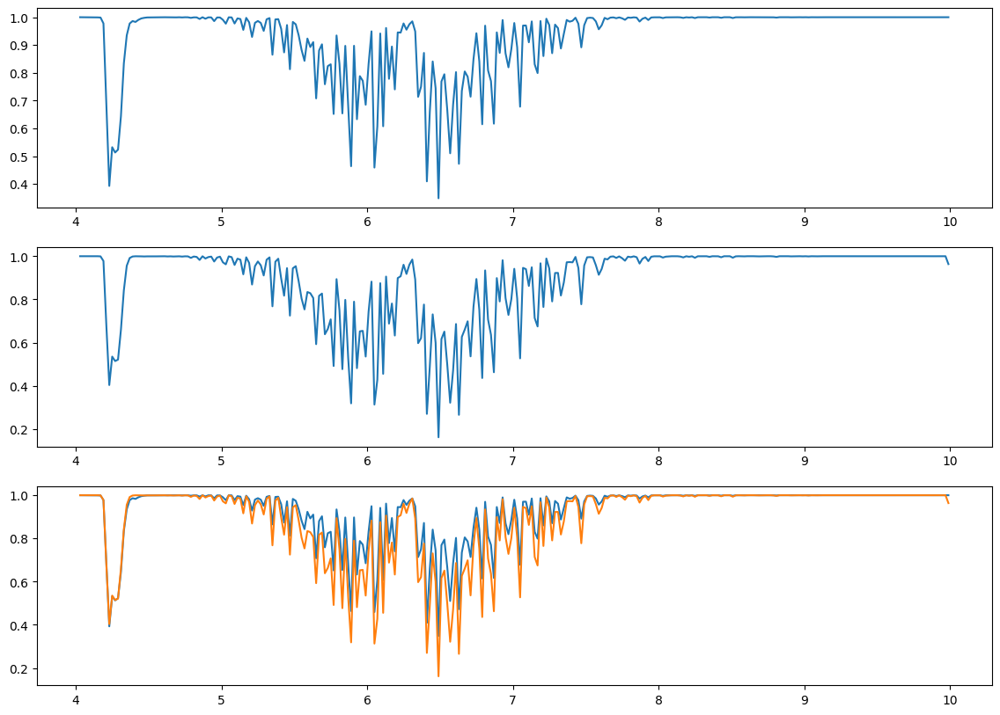

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_1m_LSF.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.0346889398528414


## ***With LSF - W_um: 0.001***

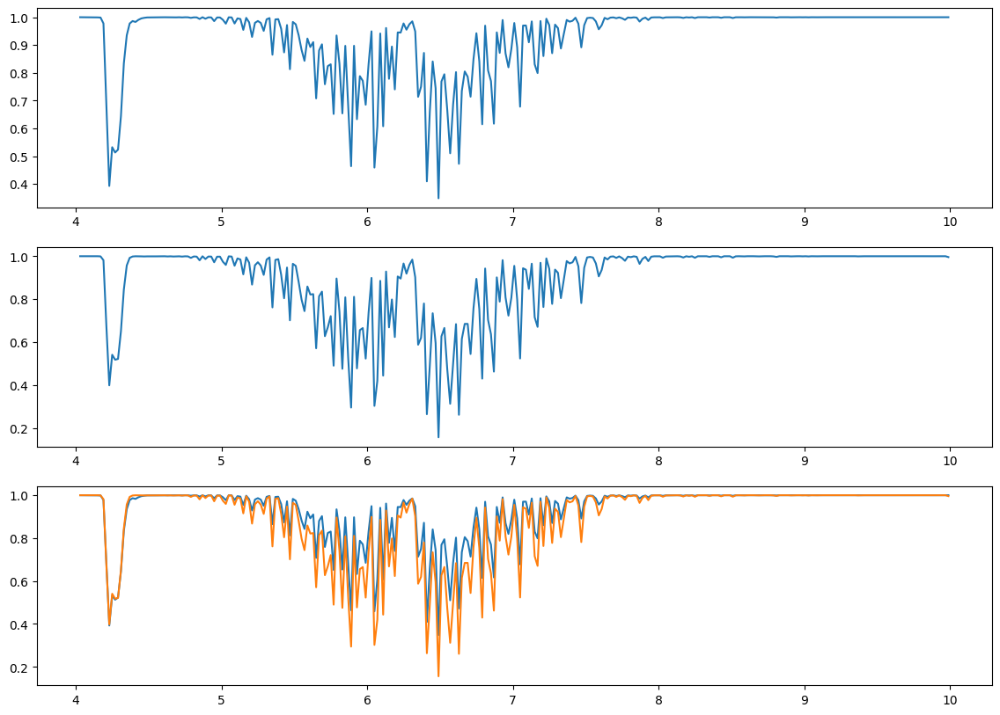

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_1m_LSF.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.034593902077942475


## ***With LSF - W_um: 0.05***

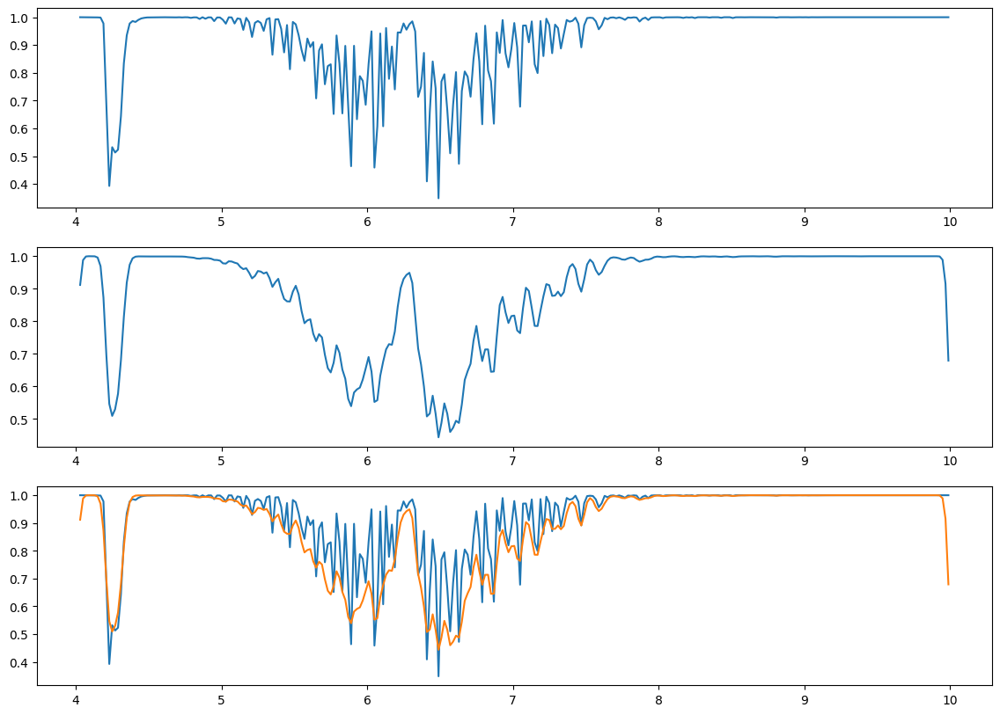

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_1m_LSF.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.04320190850558713


## ***With LSF - W_um: 0.01***

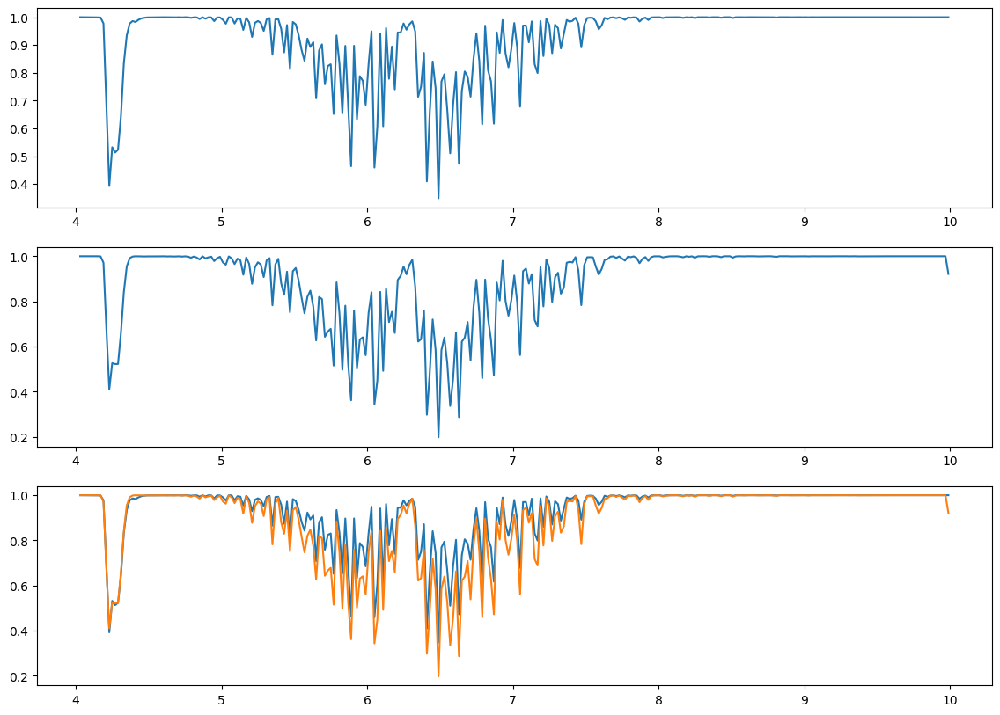

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALL_4-10_1m_LSF.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
mae = np.mean(np.abs(gt[1]-sim[1]))
print("MAE:", mae)

MAE: 0.03488885861099589


## **Fixing**

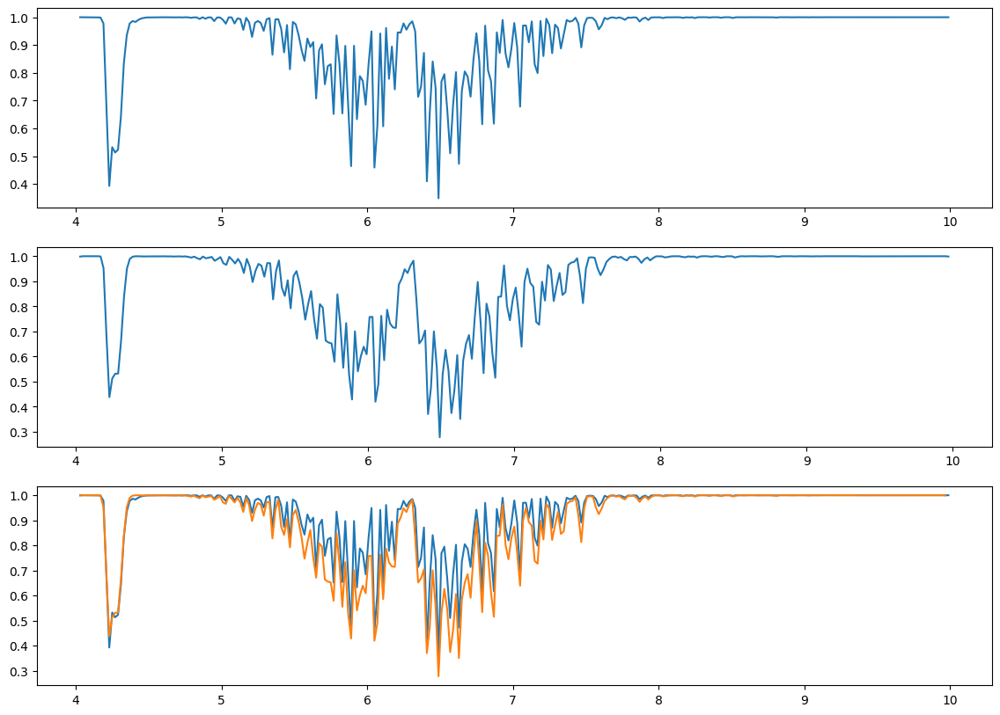

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_Total_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
# ...existing code...
# chequeo rápido de shapes y cálculo robusto de MAE

import numpy as np

# unpack (si ya tienes unpack_spectrum, úsalo)
lam_gt, y_gt = unpack_spectrum(gt)
lam_sim, y_sim = unpack_spectrum(sim)

print("shapes:", lam_gt.shape, y_gt.shape, lam_sim.shape, y_sim.shape)

# Opción A — solución rápida: recortar al mínimo tamaño
n = min(y_gt.size, y_sim.size)
mae_trim = np.mean(np.abs(y_gt[:n] - y_sim[:n]))
print("MAE (trim to min length):", mae_trim)

# Opción B — correcta: alinear por longitud de onda (interpolación de la simulada sobre la GT)
mask = (lam_gt >= lam_sim[0]) & (lam_gt <= lam_sim[-1])  # puntos de gt dentro del rango de sim
y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)     # interpola sim en la rejilla de gt
mae_interp = np.mean(np.abs(y_gt[mask] - y_sim_on_gt))
print("MAE (interpolated to GT wavelengths):", mae_interp)

# maneja NaNs si existen

shapes: (299,) (299,) (298,) (298,)
MAE (trim to min length): 0.034304042978649654
MAE (interpolated to GT wavelengths): 0.034304042978649654


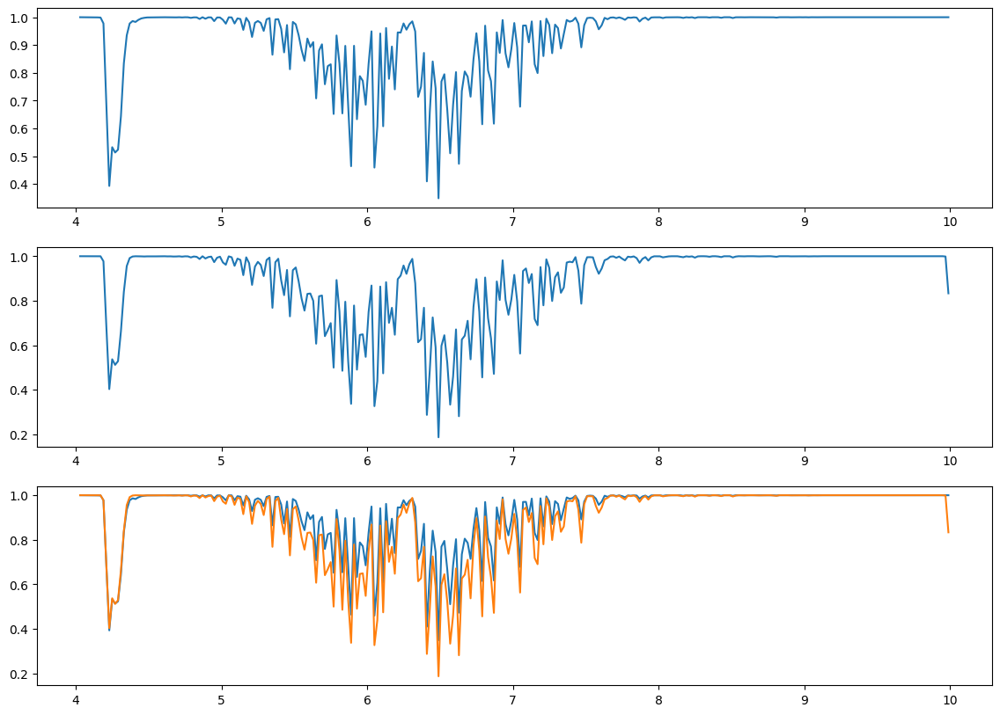

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT/Simulated_All_4-10_1m.npy")  
plt.figure(figsize=(14, 10))
plt.subplot(311)
plt.plot(gt[0], gt[1])
plt.subplot(312)
plt.plot(sim[0], sim[1])
plt.subplot(313)
plt.plot(gt[0], gt[1])
plt.plot(sim[0], sim[1])

In [ ]:
import numpy as np

def inspect_grid(lam_um, name=""):
    lam_um = np.asarray(lam_um).copy()
    # asegurar orden ascendente
    if lam_um[0] > lam_um[-1]:
        lam_um = lam_um[::-1]

    dlam = np.diff(lam_um)
    nu = 1e4 / lam_um
    # nu decrece si lam crece -> usar abs
    dnu = np.abs(np.diff(nu))

    def stats(x):
        return dict(min=float(np.min(x)), p50=float(np.median(x)), max=float(np.max(x)),
                    mean=float(np.mean(x)), cv=float(np.std(x)/np.mean(x)))

    print(f"\n=== {name} ===")
    print("N:", lam_um.size)
    print("dlam stats:", stats(dlam))
    print("dnu  stats:", stats(dnu))
    print("Interpretación: si CV(dnu) << CV(dlam), tu grilla es 'más constante' en cm^-1.")

# cargar npy tipo [2,N]
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT/Simulated_All_4-10_1m.npy")  

inspect_grid(gt[0], "GT SpectralCalc")
inspect_grid(sim[0], "Simulado")



=== GT SpectralCalc ===
N: 299
dlam stats: {'min': 0.019999999999998685, 'p50': 0.019999999999999574, 'max': 0.019999999999999574, 'mean': 0.01999999999999957, 'cv': 2.568336125267209e-15}
dnu  stats: {'min': 2.0080260802427574, 'p50': 4.070028917555419, 'max': 12.253775694635806, 'mean': 4.967746903230731, 'cv': 0.5423072142088939}
Interpretación: si CV(dnu) << CV(dlam), tu grilla es 'más constante' en cm^-1.

=== Simulado ===
N: 299
dlam stats: {'min': 0.019999999999998685, 'p50': 0.019999999999999574, 'max': 0.019999999999999574, 'mean': 0.01999999999999957, 'cv': 2.568336125267209e-15}
dnu  stats: {'min': 2.0080260802427574, 'p50': 4.070028917555419, 'max': 12.253775694635806, 'mean': 4.967746903230731, 'cv': 0.5423072142088939}
Interpretación: si CV(dnu) << CV(dlam), tu grilla es 'más constante' en cm^-1.


In [ ]:
import numpy as np
import pandas as pd

df = pd.read_csv('/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q32.txt', delim_whitespace=True, header=None,)

/tmp/ipykernel_14293/1024916512.py:4: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv('/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/TIPS/CH4/q32.txt', delim_whitespace=True, header=None,)


In [ ]:
headers = ['T(K)', 'Q(T)']
df.columns = headers
print(df.head())

   T(K)     Q(T)
0     1  5.00000
1     2  5.00478
2     3  5.05903
3     4  5.20771
4     5  5.44379


# ***Attenuation comparison***

In [ ]:
import numpy as np

def transmittance_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    """Convert transmittance T (unitless) over path length L_m into attenuation (dB/m)."""
    T = np.asarray(T, dtype=float)
    L_m = float(L_m)
    return -(10.0 / max(L_m, 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))


In [ ]:
import numpy as np

gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy")
lam_gt = np.asarray(gt[0], dtype=float)  # wavelength [um]
T_gt   = np.asarray(gt[1], dtype=float)  # transmittance

A_gt_dbm = transmittance_to_att_dbm(T_gt, L_m=1.0)  # usa el L correcto del GT


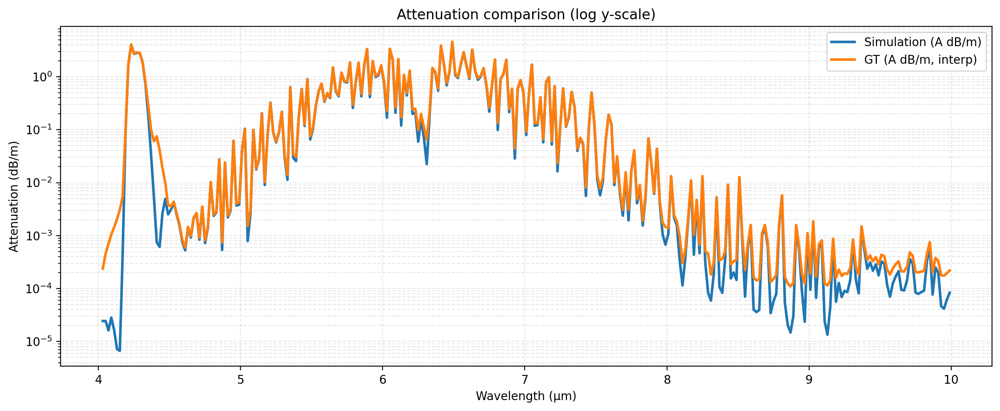

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- helpers ----------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """clip positives for log-scale; keeps NaNs."""
    y = np.asarray(y, dtype=np.float64)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def interp_to_grid(x_src: np.ndarray, y_src: np.ndarray, x_tgt: np.ndarray) -> np.ndarray:
    x_src = np.asarray(x_src, dtype=np.float64)
    y_src = np.asarray(y_src, dtype=np.float64)
    x_tgt = np.asarray(x_tgt, dtype=np.float64)

    idx = np.argsort(x_src)
    x = x_src[idx]
    y = y_src[idx]

    y_tgt = np.interp(x_tgt, x, y)
    y_tgt[(x_tgt < x[0]) | (x_tgt > x[-1])] = np.nan
    return y_tgt

def load_sim_from_csv(csv_path: str, L_m: float):
    """
    Loads sim CSV produced by your forward.
    Accepts either:
      - attenuation_total.csv (lambda_um, T_total, A_total_dbm)
      - transmission_total.csv (lambda_um, T_total)
    Returns (lambda_um, A_total_dbm)
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
        return lam, A

    if "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = T_to_att_dbm(T, L_m=L_m)
        return lam, A

    raise ValueError(f"CSV must contain 'A_total_dbm' or 'T_total'. Columns: {df.columns.tolist()}")

# ============================================================
# 1) INPUTS (EDIT THESE)
# ============================================================

L_m = 1.0  # path length [m] (must match both sim and GT)

# Your GT variables must exist already:
# lam_gt = ...  # wavelength [um]
# T_gt   = ...  # transmittance (unitless)   OR A_gt if gt_is_transmittance=False
gt_is_transmittance = False  # set False if your GT is already attenuation dB/m

# Sim CSV path (choose the one you actually saved)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT/attenuation_total.csv"   # or "OUT/transmission_total.csv"

# ============================================================
# 2) LOAD SIM, CONVERT GT, INTERPOLATE, PLOT
# ============================================================

lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

if gt_is_transmittance:
    A_gt = T_to_att_dbm(T_gt, L_m=L_m)
else:
    A_gt = np.asarray(A_gt_dbm, dtype=np.float64)

A_gt_on_sim = interp_to_grid(lam_gt, A_gt, lam_sim)

plt.figure(figsize=(12, 5), dpi=200)
plt.semilogy(lam_sim, semilogy_safe(A_sim), lw=2.2, label="Simulation (A dB/m)")
plt.semilogy(lam_sim, semilogy_safe(A_gt_on_sim), lw=2.2, label="GT (A dB/m, interp)")

plt.xlabel("Wavelength (µm)")
plt.ylabel("Attenuation (dB/m)")
plt.title("Attenuation comparison (log y-scale)")
plt.grid(True, which="both", ls="--", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


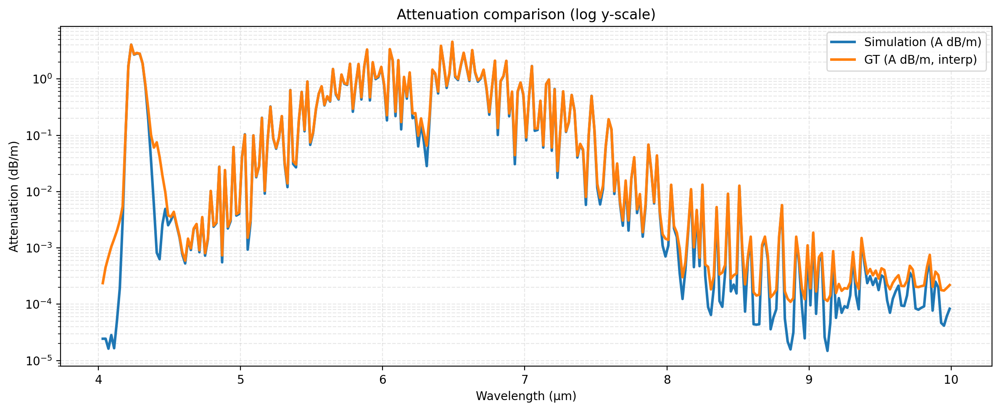

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- helpers ----------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """clip positives for log-scale; keeps NaNs."""
    y = np.asarray(y, dtype=np.float64)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def interp_to_grid(x_src: np.ndarray, y_src: np.ndarray, x_tgt: np.ndarray) -> np.ndarray:
    x_src = np.asarray(x_src, dtype=np.float64)
    y_src = np.asarray(y_src, dtype=np.float64)
    x_tgt = np.asarray(x_tgt, dtype=np.float64)

    idx = np.argsort(x_src)
    x = x_src[idx]
    y = y_src[idx]

    y_tgt = np.interp(x_tgt, x, y)
    y_tgt[(x_tgt < x[0]) | (x_tgt > x[-1])] = np.nan
    return y_tgt

def load_sim_from_csv(csv_path: str, L_m: float):
    """
    Loads sim CSV produced by your forward.
    Accepts either:
      - attenuation_total.csv (lambda_um, T_total, A_total_dbm)
      - transmission_total.csv (lambda_um, T_total)
    Returns (lambda_um, A_total_dbm)
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
        return lam, A

    if "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = T_to_att_dbm(T, L_m=L_m)
        return lam, A

    raise ValueError(f"CSV must contain 'A_total_dbm' or 'T_total'. Columns: {df.columns.tolist()}")

# ============================================================
# 1) INPUTS (EDIT THESE)
# ============================================================

L_m = 1.0  # path length [m] (must match both sim and GT)

# Your GT variables must exist already:
# lam_gt = ...  # wavelength [um]
# T_gt   = ...  # transmittance (unitless)   OR A_gt if gt_is_transmittance=False
gt_is_transmittance = False  # set False if your GT is already attenuation dB/m

# Sim CSV path (choose the one you actually saved)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT/attenuation_total.csv"   # or "OUT/transmission_total.csv"

# ============================================================
# 2) LOAD SIM, CONVERT GT, INTERPOLATE, PLOT
# ============================================================

lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

if gt_is_transmittance:
    A_gt = T_to_att_dbm(T_gt, L_m=L_m)
else:
    A_gt = np.asarray(A_gt_dbm, dtype=np.float64)

A_gt_on_sim = interp_to_grid(lam_gt, A_gt, lam_sim)

plt.figure(figsize=(12, 5), dpi=200)
plt.semilogy(lam_sim, semilogy_safe(A_sim), lw=2.2, label="Simulation (A dB/m)")
plt.semilogy(lam_sim, semilogy_safe(A_gt_on_sim), lw=2.2, label="GT (A dB/m, interp)")

plt.xlabel("Wavelength (µm)")
plt.ylabel("Attenuation (dB/m)")
plt.title("Attenuation comparison (log y-scale)")
plt.grid(True, which="both", ls="--", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# ***Changes in the forward - Atteanuation dB/m comparison***

In [ ]:
gt = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Standard_All_4-30um_1m.npy")
gt = np.transpose(gt)
sim = np.load("/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_ALLGASES_4-10_1m.npy")  
output = "SIMULATED/Transmittance_ALLGASES_4-10_1m__downsampled_to_Simulated_ALLGASES_4-10_1m.npy"
downsample(sim, gt, output)

In [ ]:
import os
import numpy as np

def _ensure_2xN(arr: np.ndarray) -> np.ndarray:
    arr = np.asarray(arr)
    if arr.ndim != 2:
        raise ValueError(f"Expected 2D array, got shape {arr.shape}")
    if arr.shape[0] == 2:
        return arr
    if arr.shape[1] == 2:
        return arr.T
    raise ValueError(f"Expected shape (2,N) or (N,2), got {arr.shape}")

def downsample_gt_att_dbm_to_sim_grid(
    sim_2xN: np.ndarray,
    gt_2xM: np.ndarray,
    output_path: str,
    L_m: float = 1.0,
) -> str:
    """
    sim_2xN: [lambda_um, ...] (we only use sim wavelengths)
    gt_2xM:  [lambda_um, T_gt] where T_gt is monochromatic/high-res (preferred)
            If T_gt is already downsampled, you can't recover true avg attenuation.
    Saves: npy with shape (2,N): [lambda_um_sim, A_gt_dbm_downsampled]
    """
    sim_2xN = _ensure_2xN(sim_2xN)
    gt_2xM  = _ensure_2xN(gt_2xM)

    lam_tgt = np.asarray(sim_2xN[0], dtype=float)
    lam_src = np.asarray(gt_2xM[0], dtype=float)
    T_src   = np.asarray(gt_2xM[1], dtype=float)

    # sort source grid
    idx = np.argsort(lam_src)
    lam_src = lam_src[idx]
    T_src   = T_src[idx]

    # optical depth on source grid
    tau_src = -np.log(np.clip(T_src, 1e-300, 1.0))

    # build bin edges from target grid (same as your downsample())
    edges = np.empty(lam_tgt.size + 1, dtype=float)
    edges[1:-1] = 0.5 * (lam_tgt[:-1] + lam_tgt[1:])
    edges[0]    = lam_tgt[0]  - 0.5 * (lam_tgt[1] - lam_tgt[0])
    edges[-1]   = lam_tgt[-1] + 0.5 * (lam_tgt[-1] - lam_tgt[-2])

    # clamp edges to source range
    edges[0]  = max(edges[0],  lam_src[0])
    edges[-1] = min(edges[-1], lam_src[-1])

    # cumulative integral of tau_src over lam_src
    cum = np.concatenate([[0.0], np.cumsum(0.5 * (tau_src[:-1] + tau_src[1:]) * (lam_src[1:] - lam_src[:-1]))])

    def cum_at(x):
        return np.interp(x, lam_src, cum)

    area = cum_at(edges[1:]) - cum_at(edges[:-1])
    width = (edges[1:] - edges[:-1])
    tau_ds = area / np.maximum(width, 1e-30)

    # mark bins that extend beyond original source coverage as NaN
    valid = (edges[:-1] >= lam_src[0]) & (edges[1:] <= lam_src[-1])
    tau_ds[~valid] = np.nan

    # convert tau -> attenuation dB/m
    A_ds_dbm = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau_ds

    out = np.vstack([lam_tgt, A_ds_dbm])

    outdir = os.path.dirname(output_path)
    if outdir:
        os.makedirs(outdir, exist_ok=True)
    np.save(output_path, out)
    return output_path


# ------------------ your paths ------------------
gt_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/GT_PROFE/Standard_All_4-30um_1m.npy"
sim_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_LINEPAK_STYLE_4-10_1m.npy"
output = "SIMULATED/Attenuation_ALLGASES_4-10_1m__GT_downsampled_to_sim_grid.npy"

gt = np.load(gt_path)
sim = np.load(sim_path)

# robust shape handling (either (2,N) or (N,2))
gt = _ensure_2xN(gt)
sim = _ensure_2xN(sim)

# NOTE: this assumes gt[1] is transmittance. If gt already stores attenuation, don't log it.
downsample_gt_att_dbm_to_sim_grid(sim, gt, output_path=output, L_m=1.0)
print("Saved:", output)


Saved: SIMULATED/Attenuation_ALLGASES_4-10_1m__GT_downsampled_to_sim_grid.npy


## ***Ploting***

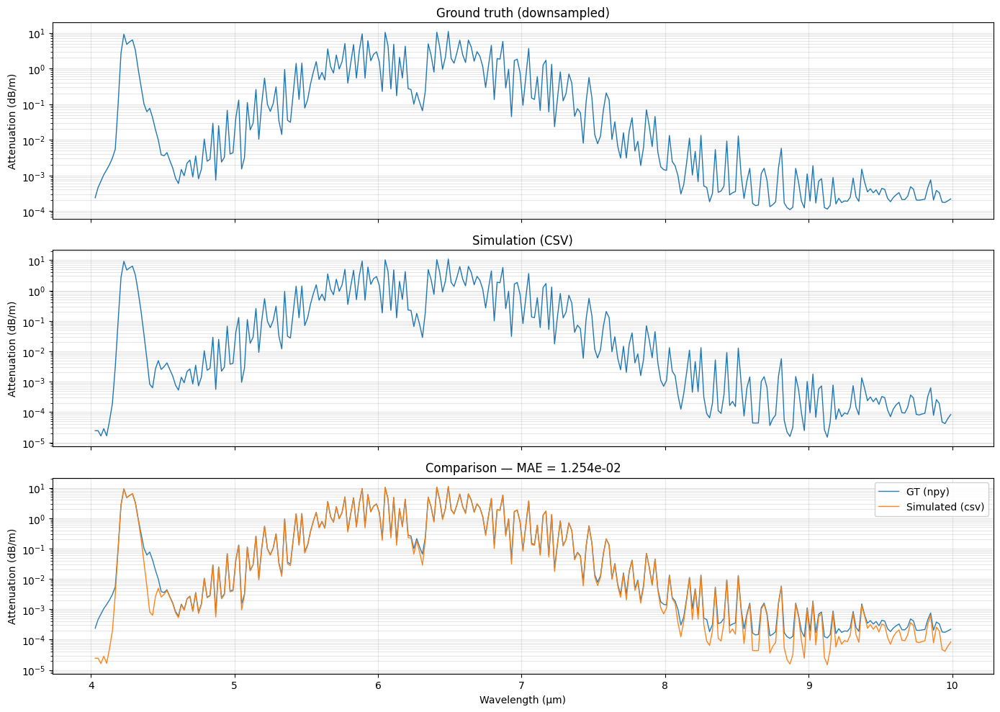

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- loaders --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def load_sim_from_csv(csv_path: str, L_m: float = 1.0):
    """
    Reads LINEPAK-style CSV and returns (lam_um, A_dbm).
    Accepts:
      - attenuation_total.csv with columns: lambda_um, A_total_dbm  (preferred)
      - OR lambda_um + tau_total
      - OR lambda_um + T_total
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
    elif "tau_total" in df.columns:
        tau = df["tau_total"].to_numpy(np.float64)
        A = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau
    elif "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))
    else:
        raise ValueError(
            "CSV must contain one of: A_total_dbm, tau_total, or T_total. "
            f"Columns: {df.columns.tolist()}"
        )

    idx = np.argsort(lam)
    return lam[idx], A[idx]

# -------------------- math helpers --------------------
def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan

    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan

    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- paths (EDIT) --------------------
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Attenuation_ALLGASES_4-10_1m__GT_downsampled_to_sim_grid.npy"
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_LINEPAK_STYLE/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

mae = mae_interp_sim_on_gt(lam_gt, A_gt, lam_sim, A_sim)

# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt, semilogy_safe(A_gt), lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim, semilogy_safe(A_sim), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt, semilogy_safe(A_gt), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim, semilogy_safe(A_sim), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


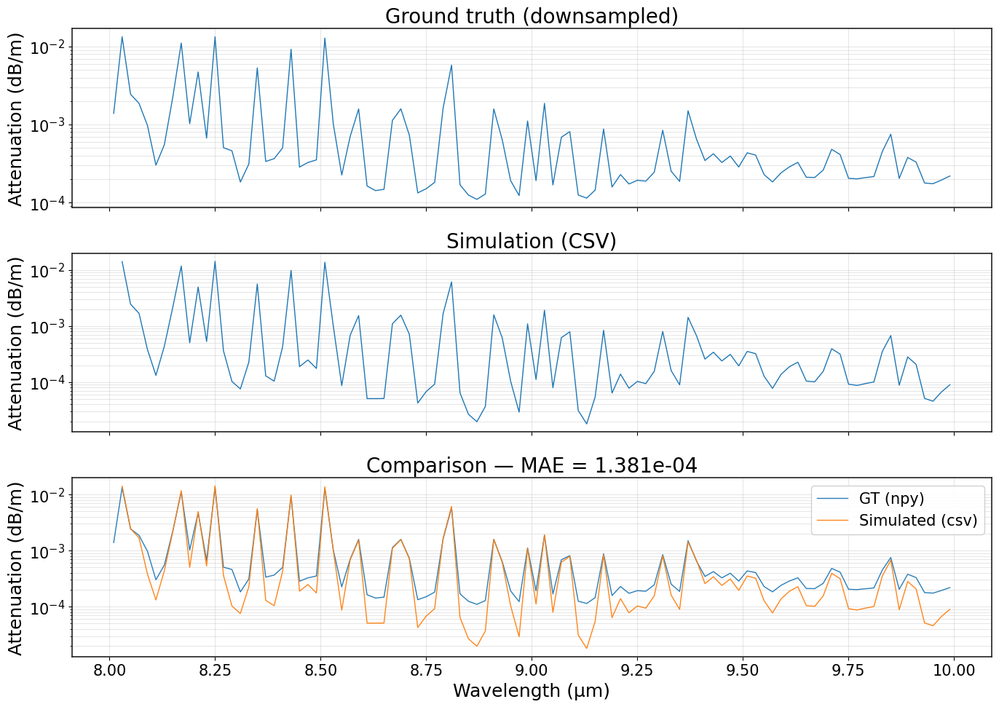

In [82]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt






# -------------------- loaders --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def load_sim_from_csv(csv_path: str, L_m: float = 1.0):
    """
    Reads LINEPAK-style CSV and returns (lam_um, A_dbm).
    Accepts:
      - attenuation_total.csv with columns: lambda_um, A_total_dbm  (preferred)
      - OR lambda_um + tau_total
      - OR lambda_um + T_total
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
    elif "tau_total" in df.columns:
        tau = df["tau_total"].to_numpy(np.float64)
        A = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau
    elif "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))
    else:
        raise ValueError(
            "CSV must contain one of: A_total_dbm, tau_total, or T_total. "
            f"Columns: {df.columns.tolist()}"
        )

    idx = np.argsort(lam)
    return lam[idx], A[idx]

# -------------------- math helpers --------------------
def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan

    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan

    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- paths (EDIT) --------------------
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Attenuation_ALLGASES_4-10_1m__GT_downsampled_to_sim_grid.npy"
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_LINEPAK_STYLE/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

mae = mae_interp_sim_on_gt(lam_gt, A_gt, lam_sim, A_sim)



# -------------------- VIEW WINDOW (EDIT) --------------------
lam_view_min = 8.0
lam_view_max = 10.0

# crop GT for visual
m_gt  = (lam_gt  >= lam_view_min) & (lam_gt  <= lam_view_max)
lam_gt_v, A_gt_v = lam_gt[m_gt], A_gt[m_gt]

# (optional but recommended) crop SIM too so both panels show same window
m_sim  = (lam_sim >= lam_view_min) & (lam_sim <= lam_view_max)
lam_sim_v, A_sim_v = lam_sim[m_sim], A_sim[m_sim]



# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt_v, semilogy_safe(A_gt_v), lw=1)
axes[0].set_title("Ground truth (downsampled)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim_v, semilogy_safe(A_sim_v), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt_v, semilogy_safe(A_gt_v), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim_v, semilogy_safe(A_sim_v), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()



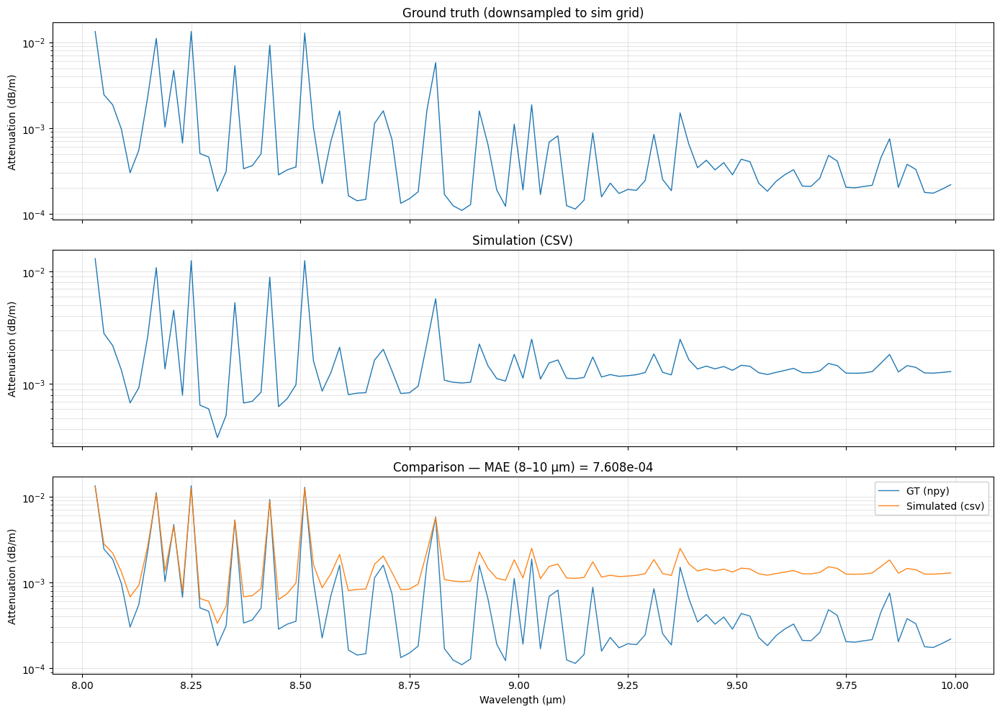

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- loaders --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def load_sim_from_csv(csv_path: str, L_m: float = 1.0):
    """
    Reads LINEPAK-style CSV and returns (lam_um, A_dbm).
    Accepts:
      - attenuation_total.csv with columns: lambda_um, A_total_dbm  (preferred)
      - OR lambda_um + tau_total
      - OR lambda_um + T_total
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
    elif "tau_total" in df.columns:
        tau = df["tau_total"].to_numpy(np.float64)
        A = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau
    elif "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))
    else:
        raise ValueError(
            "CSV must contain one of: A_total_dbm, tau_total, or T_total. "
            f"Columns: {df.columns.tolist()}"
        )

    idx = np.argsort(lam)
    return lam[idx], A[idx]

# -------------------- math helpers --------------------
def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan

    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan

    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- paths (EDIT) --------------------
# NEW GT output produced by instance.py
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/GT_Attenuation_dbm__downsampled_to_sim_grid.npy"

# Sim output (still fine to read from CSV)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_LINEPAK_STYLE/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

# -------------------- VIEW WINDOW (EDIT) --------------------
lam_view_min = 8.0
lam_view_max = 10.0

m_gt  = (lam_gt  >= lam_view_min) & (lam_gt  <= lam_view_max)
lam_gt_v, A_gt_v = lam_gt[m_gt], A_gt[m_gt]

m_sim  = (lam_sim >= lam_view_min) & (lam_sim <= lam_view_max)
lam_sim_v, A_sim_v = lam_sim[m_sim], A_sim[m_sim]

# IMPORTANT: compute MAE on the same window you are plotting
mae = mae_interp_sim_on_gt(lam_gt_v, A_gt_v, lam_sim_v, A_sim_v)

# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt_v, semilogy_safe(A_gt_v), lw=1)
axes[0].set_title("Ground truth (downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim_v, semilogy_safe(A_sim_v), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt_v, semilogy_safe(A_gt_v), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim_v, semilogy_safe(A_sim_v), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE (8–10 µm) = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


# ***Per gas comparison in Attenuation domain***

## **H2O**

Saved: SIMULATED/Attenuation_H2O_4-10_1m__GT_downsampled_to_sim_grid.npy


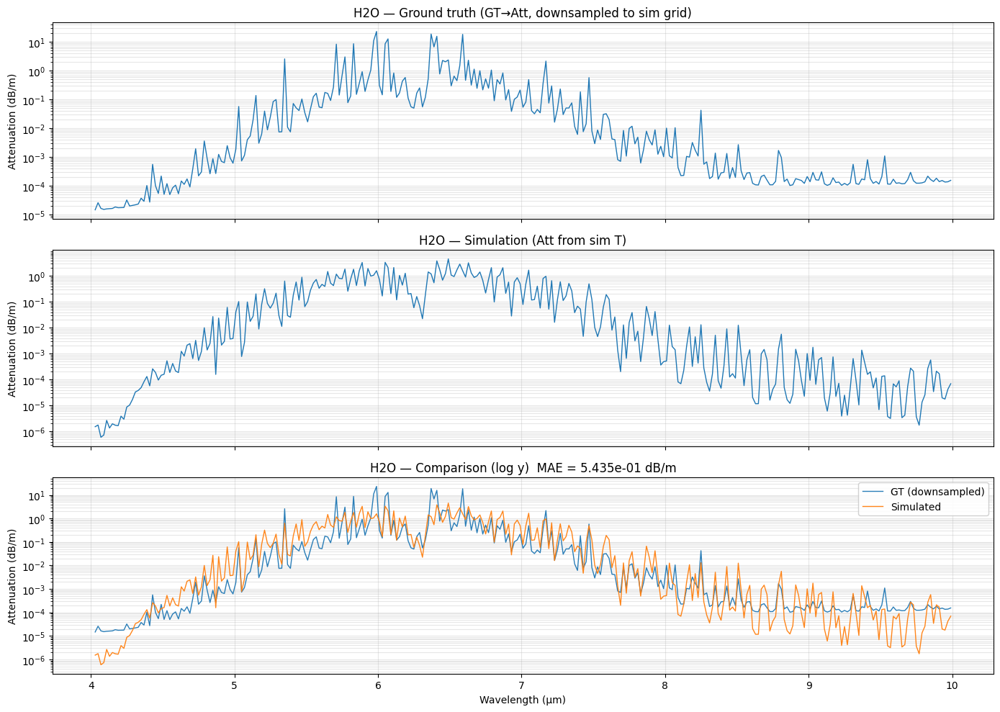

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------- core conversions --------------------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def crop_window(lam, y, lam_min=None, lam_max=None):
    m = np.ones_like(lam, dtype=bool)
    if lam_min is not None: m &= (lam >= lam_min)
    if lam_max is not None: m &= (lam <= lam_max)
    return lam[m], y[m]

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan
    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan
    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- YOUR PATHS (EDIT) --------------------
gas = "H2O"
L_m = 1.0

gt_path  = f"GT_PROFE/Transmittance_Standard_{gas}_4-10_1m.npy"                # likely transmittance
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  # transmittance from your forward

# if GT is transmittance, set True. If GT already attenuation dB/m, set False.
gt_is_transmittance = True

# optional wavelength zoom for visuals
lam_min_plot = 4.0
lam_max_plot = 10.0

# output downsampled GT attenuation file
out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"

# -------------------- LOAD --------------------
lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))

# GT -> attenuation (if needed)
if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)

# SIM -> attenuation
A_sim = T_to_att_dbm(T_sim, L_m=L_m)

# -------------------- DOWNSAMPLE GT ATTENUATION onto SIM GRID --------------------
# (simple interpolation; if you prefer your band-averaging downsample(), swap it in here)
A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)

# save (2,N) npy
np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

# -------------------- CROP (optional) --------------------
lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

# MAE on the plotted window (sim already on sim grid; just compare directly)
m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan

# -------------------- PLOT --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **N2O** 

Saved: SIMULATED/Attenuation_N2O_4-10_1m__GT_downsampled_to_sim_grid.npy


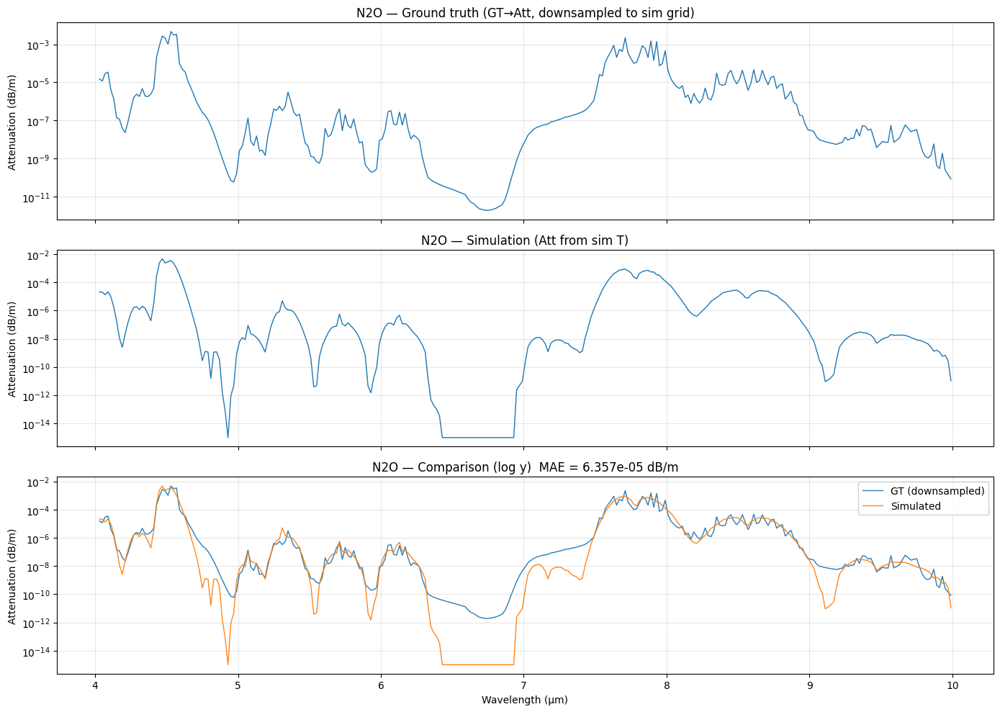

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------- core conversions --------------------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def crop_window(lam, y, lam_min=None, lam_max=None):
    m = np.ones_like(lam, dtype=bool)
    if lam_min is not None: m &= (lam >= lam_min)
    if lam_max is not None: m &= (lam <= lam_max)
    return lam[m], y[m]

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan
    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan
    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- YOUR PATHS (EDIT) --------------------
gas = "N2O"
L_m = 1.0

gt_path  = f"GT_PROFE/{gas}_4-10.npy"                # likely transmittance
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  # transmittance from your forward

# if GT is transmittance, set True. If GT already attenuation dB/m, set False.
gt_is_transmittance = True

# optional wavelength zoom for visuals
lam_min_plot = 4.0
lam_max_plot = 10.0

# output downsampled GT attenuation file
out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"

# -------------------- LOAD --------------------
lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))

# GT -> attenuation (if needed)
if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)

# SIM -> attenuation
A_sim = T_to_att_dbm(T_sim, L_m=L_m)

# -------------------- DOWNSAMPLE GT ATTENUATION onto SIM GRID --------------------
# (simple interpolation; if you prefer your band-averaging downsample(), swap it in here)
A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)

# save (2,N) npy
np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

# -------------------- CROP (optional) --------------------
lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

# MAE on the plotted window (sim already on sim grid; just compare directly)
m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan

# -------------------- PLOT --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **O3**

Saved: SIMULATED/Attenuation_O3_4-10_1m__GT_downsampled_to_sim_grid.npy


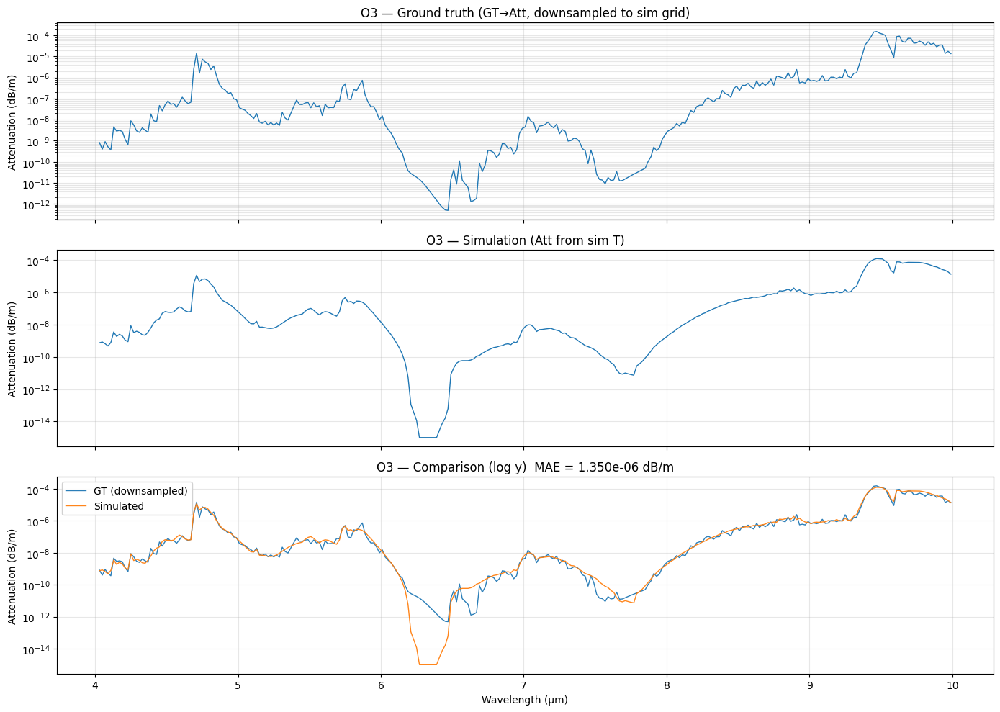

In [11]:
import numpy as np
import matplotlib.pyplot as plt

gas = "O3"
L_m = 1.0

gt_path  = f"GT_PROFE/{gas}_4-10um_1m.npy"                
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  


gt_is_transmittance = True

lam_min_plot = 4.0
lam_max_plot = 10.0


out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"


lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)


A_sim = T_to_att_dbm(T_sim, L_m=L_m)

A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)


np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan


fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **CH4**

Saved: SIMULATED/Attenuation_CH4_4-10_1m__GT_downsampled_to_sim_grid.npy


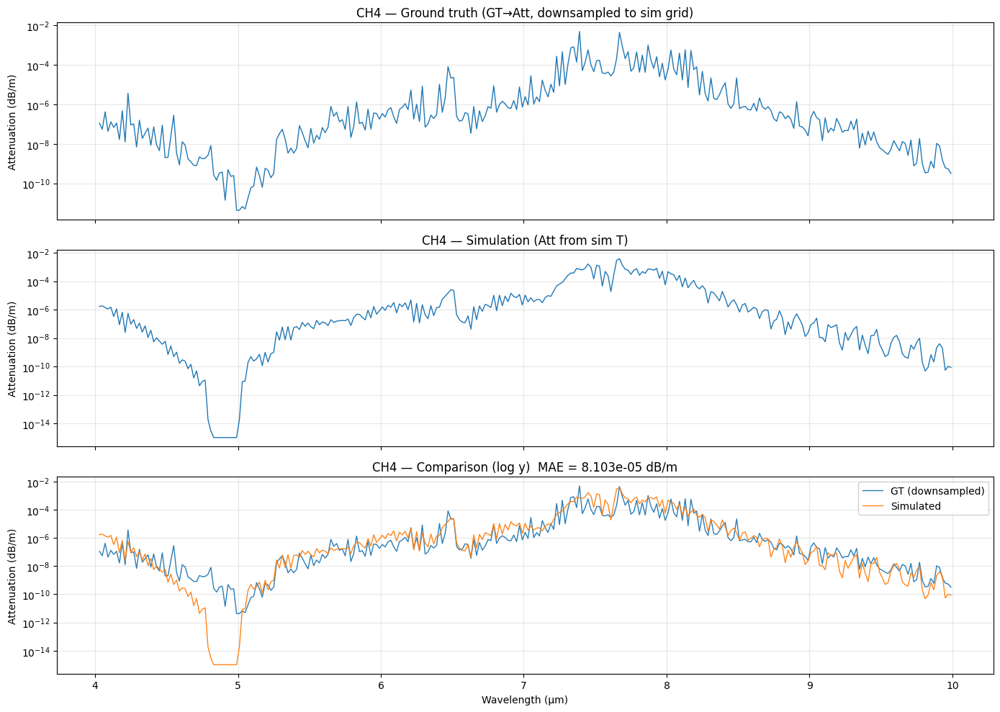

In [12]:
import numpy as np
import matplotlib.pyplot as plt

gas = "CH4"
L_m = 1.0

gt_path  = f"GT_PROFE/{gas}_4-10.npy"                
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  


gt_is_transmittance = True

lam_min_plot = 4.0
lam_max_plot = 10.0


out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"


lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)


A_sim = T_to_att_dbm(T_sim, L_m=L_m)

A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)


np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan


fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **CO**

Saved: SIMULATED/Attenuation_CO_4-10_1m__GT_downsampled_to_sim_grid.npy


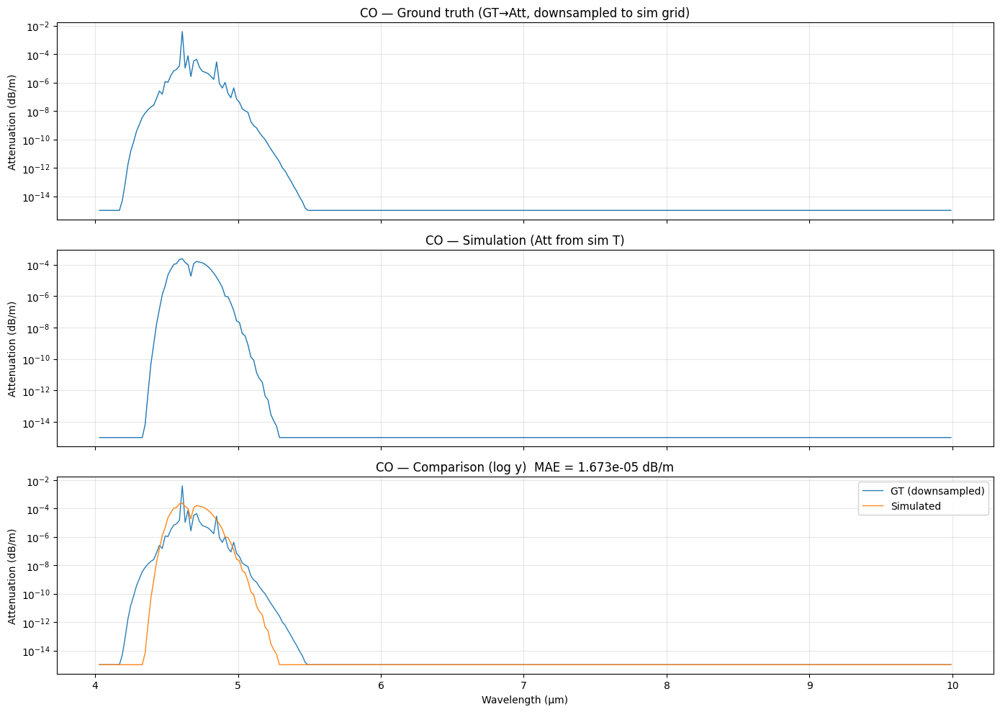

In [14]:
import numpy as np
import matplotlib.pyplot as plt

gas = "CO"
L_m = 1.0

gt_path  = f"GT_PROFE/{gas}_4-10.npy"                
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  


gt_is_transmittance = True

lam_min_plot = 4.0
lam_max_plot = 10.0


out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"


lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)


A_sim = T_to_att_dbm(T_sim, L_m=L_m)

A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)


np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan


fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## ***CO2***

Saved: SIMULATED/Attenuation_CO2_4-10_1m__GT_downsampled_to_sim_grid.npy


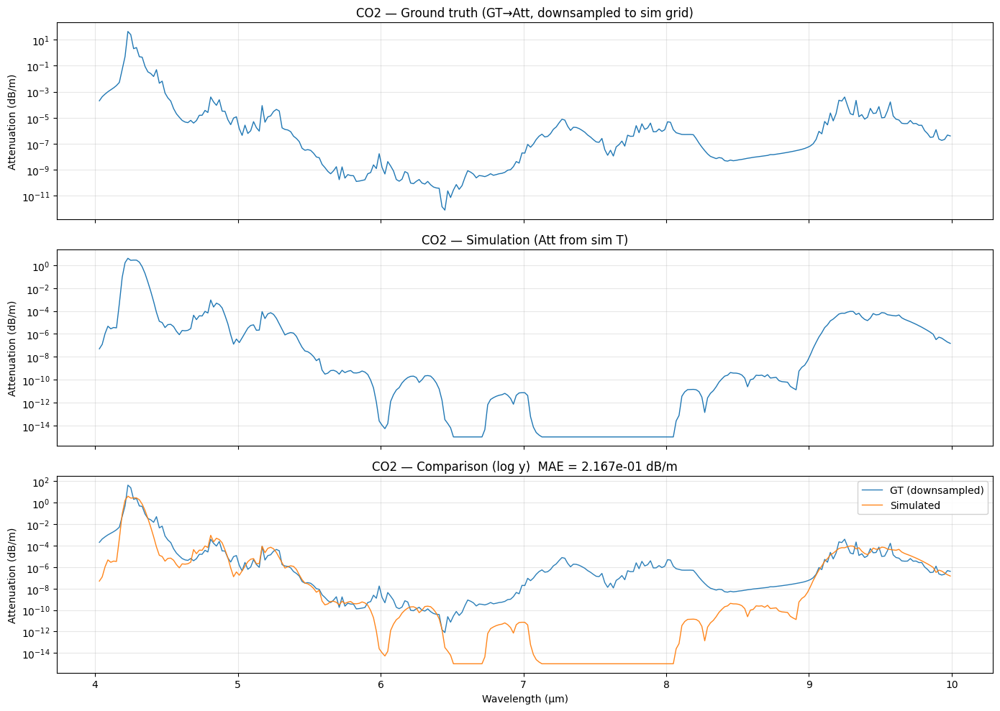

In [17]:
import numpy as np
import matplotlib.pyplot as plt

gas = "CO2"
L_m = 1.0

gt_path  = f"GT_PROFE/Transmittance_Standard_{gas}_4-10_1m.npy"                 
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m.npy"  


gt_is_transmittance = True

lam_min_plot = 4.0
lam_max_plot = 10.0


out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"


lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)


A_sim = T_to_att_dbm(T_sim, L_m=L_m)

A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)


np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan


fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


# **Both: Transmittance and Attenuation for each gas**

## **H2O**

TypeError: unsupported format string passed to NoneType.__format__

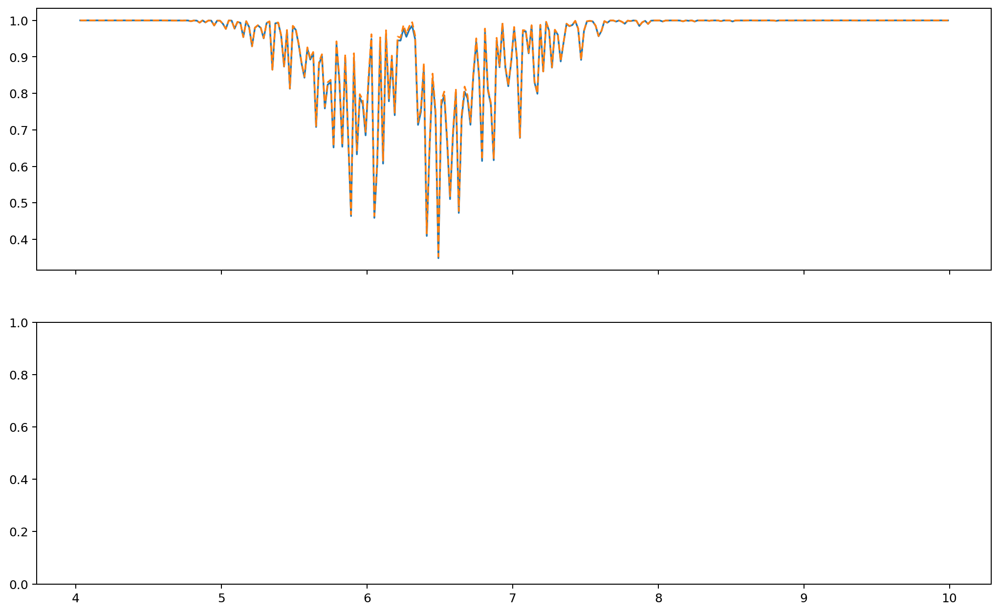

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt

# -------------------- helpers --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    """T (unitless) -> attenuation (dB/m)."""
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
            # return np.nan
        y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
        m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
        if not np.any(m2):
            return np.nan
        return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))


gas = "H2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **N2O**

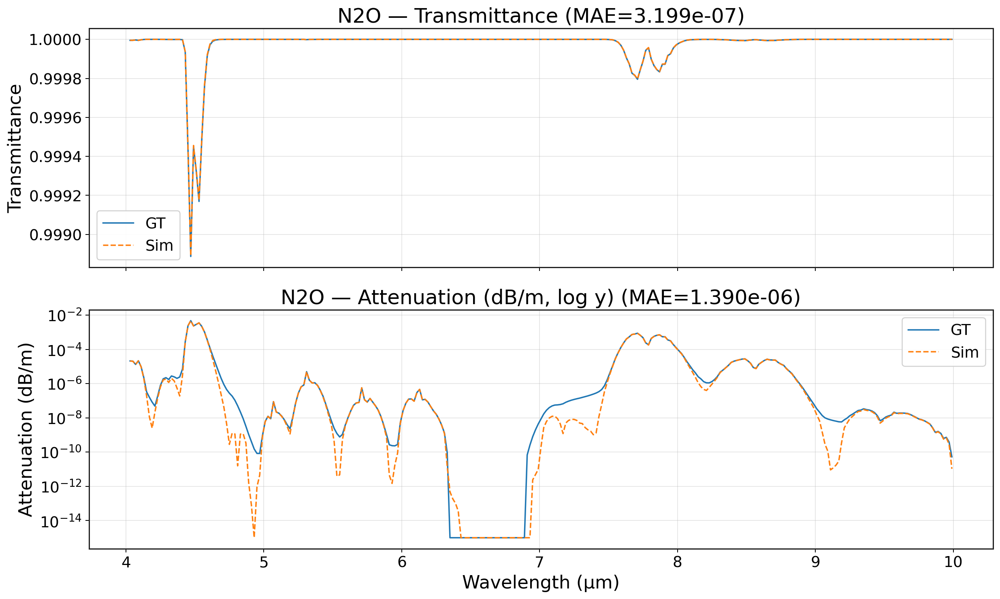

In [63]:

gas = "N2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **O3**

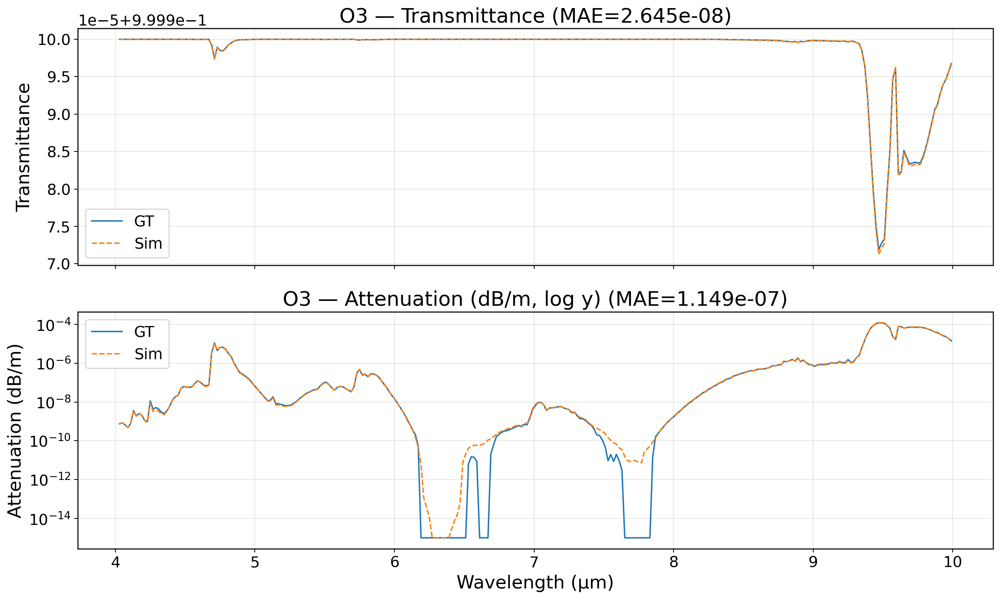

In [62]:

gas = "O3"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **CH4**

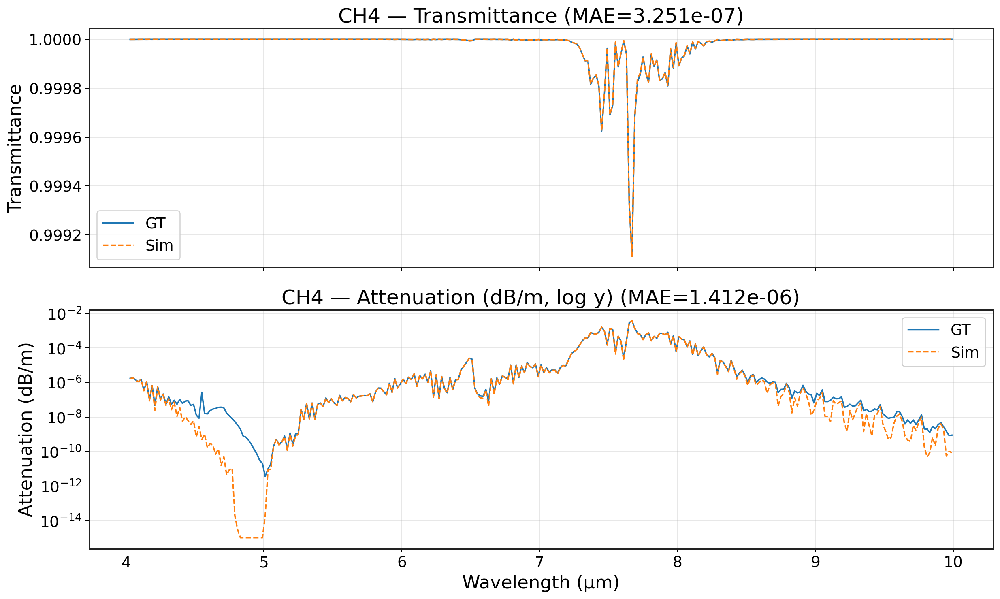

In [61]:

gas = "CH4"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **CO**

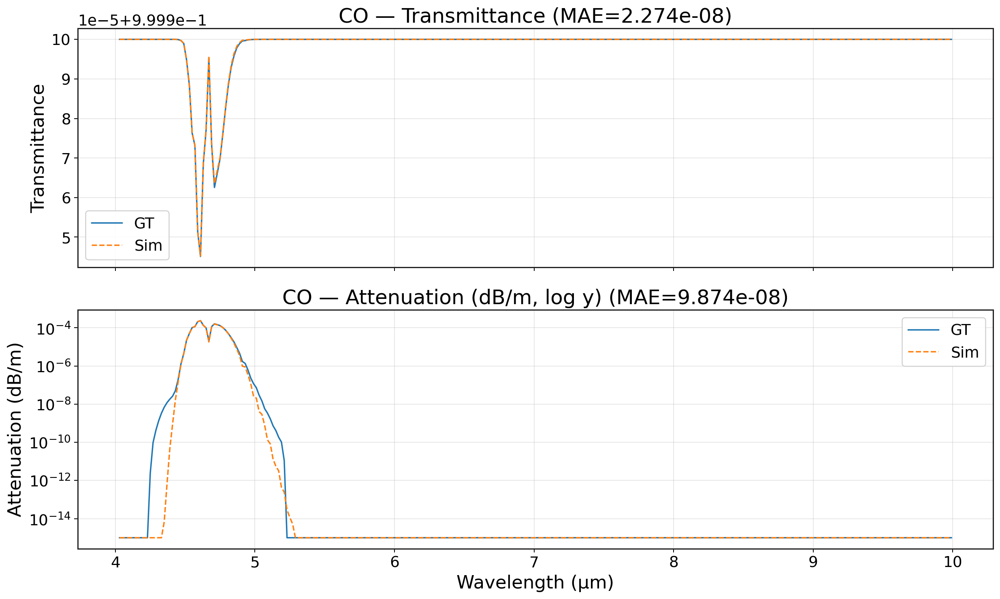

In [60]:

gas = "CO"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **CO2**

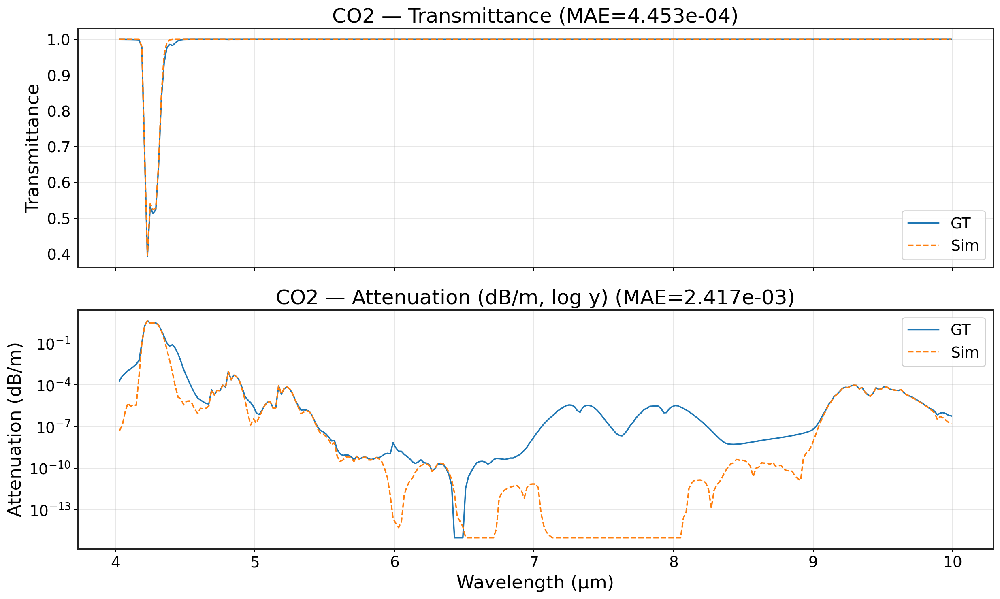

In [59]:

gas = "CO2"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **All**

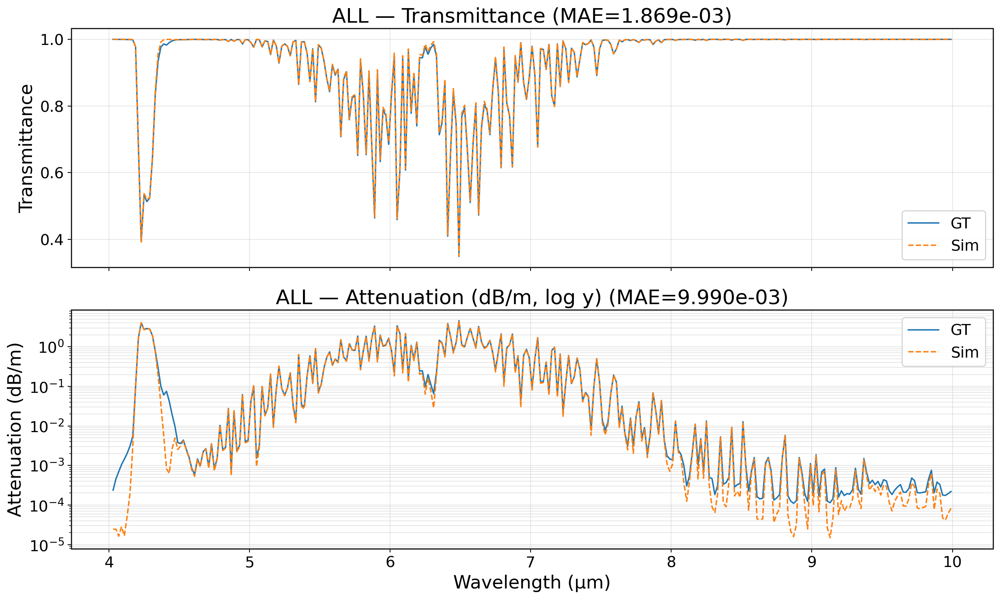

In [66]:

gas = "ALL"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_best.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


# **Tests**

## **Using Elsasser Approach Off**

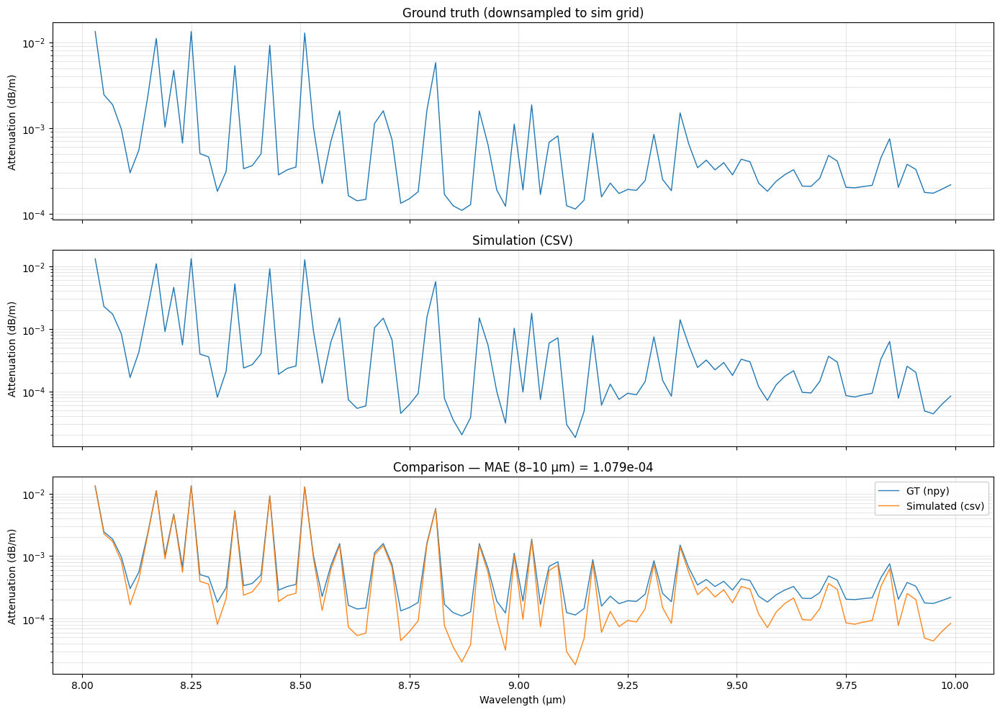

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- loaders --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def load_sim_from_csv(csv_path: str, L_m: float = 1.0):
    """
    Reads LINEPAK-style CSV and returns (lam_um, A_dbm).
    Accepts:
      - attenuation_total.csv with columns: lambda_um, A_total_dbm  (preferred)
      - OR lambda_um + tau_total
      - OR lambda_um + T_total
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
    elif "tau_total" in df.columns:
        tau = df["tau_total"].to_numpy(np.float64)
        A = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau
    elif "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))
    else:
        raise ValueError(
            "CSV must contain one of: A_total_dbm, tau_total, or T_total. "
            f"Columns: {df.columns.tolist()}"
        )

    idx = np.argsort(lam)
    return lam[idx], A[idx]

# -------------------- math helpers --------------------
def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan

    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan

    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- paths (EDIT) --------------------
# NEW GT output produced by instance.py
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/GT_Attenuation_dbm__downsampled_to_sim_grid.npy"

# Sim output (still fine to read from CSV)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_LINEPAK_STYLE__ELSASSER/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

# -------------------- VIEW WINDOW (EDIT) --------------------
lam_view_min = 8.0
lam_view_max = 10.0

m_gt  = (lam_gt  >= lam_view_min) & (lam_gt  <= lam_view_max)
lam_gt_v, A_gt_v = lam_gt[m_gt], A_gt[m_gt]

m_sim  = (lam_sim >= lam_view_min) & (lam_sim <= lam_view_max)
lam_sim_v, A_sim_v = lam_sim[m_sim], A_sim[m_sim]

# IMPORTANT: compute MAE on the same window you are plotting
mae = mae_interp_sim_on_gt(lam_gt_v, A_gt_v, lam_sim_v, A_sim_v)

# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt_v, semilogy_safe(A_gt_v), lw=1)
axes[0].set_title("Ground truth (downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim_v, semilogy_safe(A_sim_v), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt_v, semilogy_safe(A_gt_v), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim_v, semilogy_safe(A_sim_v), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE (8–10 µm) = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **Using Elsasser Approach On**

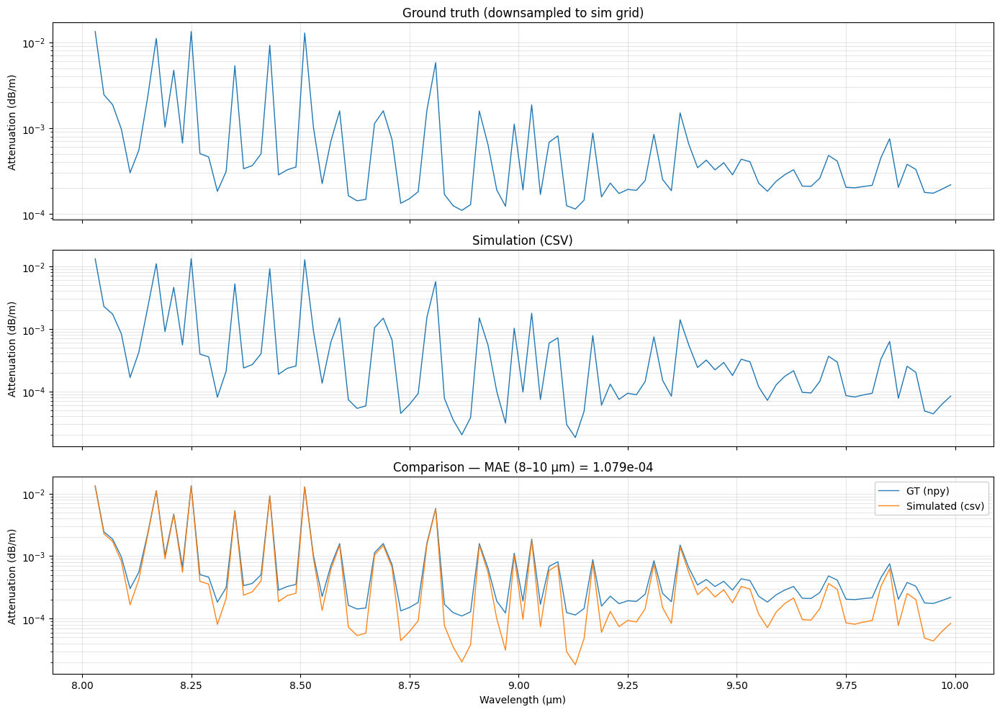

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- loaders --------------------
def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def load_sim_from_csv(csv_path: str, L_m: float = 1.0):
    """
    Reads LINEPAK-style CSV and returns (lam_um, A_dbm).
    Accepts:
      - attenuation_total.csv with columns: lambda_um, A_total_dbm  (preferred)
      - OR lambda_um + tau_total
      - OR lambda_um + T_total
    """
    df = pd.read_csv(csv_path)
    if "lambda_um" not in df.columns:
        raise ValueError(f"CSV must contain 'lambda_um'. Columns: {df.columns.tolist()}")

    lam = df["lambda_um"].to_numpy(np.float64)

    if "A_total_dbm" in df.columns:
        A = df["A_total_dbm"].to_numpy(np.float64)
    elif "tau_total" in df.columns:
        tau = df["tau_total"].to_numpy(np.float64)
        A = (10.0 / (max(float(L_m), 1e-300) * np.log(10.0))) * tau
    elif "T_total" in df.columns:
        T = df["T_total"].to_numpy(np.float64)
        A = -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))
    else:
        raise ValueError(
            "CSV must contain one of: A_total_dbm, tau_total, or T_total. "
            f"Columns: {df.columns.tolist()}"
        )

    idx = np.argsort(lam)
    return lam[idx], A[idx]

# -------------------- math helpers --------------------
def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    """Clip finite values to be positive for log plots; keep NaNs."""
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """Interpolate sim onto GT grid in overlap; ignore NaNs."""
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan

    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan

    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))

# -------------------- paths (EDIT) --------------------
# NEW GT output produced by instance.py
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/GT_Attenuation_dbm__downsampled_to_sim_grid.npy"

# Sim output (still fine to read from CSV)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_LINEPAK_STYLE__ELSASSER/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

# -------------------- VIEW WINDOW (EDIT) --------------------
lam_view_min = 8.0
lam_view_max = 10.0

m_gt  = (lam_gt  >= lam_view_min) & (lam_gt  <= lam_view_max)
lam_gt_v, A_gt_v = lam_gt[m_gt], A_gt[m_gt]

m_sim  = (lam_sim >= lam_view_min) & (lam_sim <= lam_view_max)
lam_sim_v, A_sim_v = lam_sim[m_sim], A_sim[m_sim]

# IMPORTANT: compute MAE on the same window you are plotting
mae = mae_interp_sim_on_gt(lam_gt_v, A_gt_v, lam_sim_v, A_sim_v)

# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt_v, semilogy_safe(A_gt_v), lw=1)
axes[0].set_title("Ground truth (downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim_v, semilogy_safe(A_sim_v), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt_v, semilogy_safe(A_gt_v), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim_v, semilogy_safe(A_sim_v), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE (8–10 µm) = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **Elsasser Only**

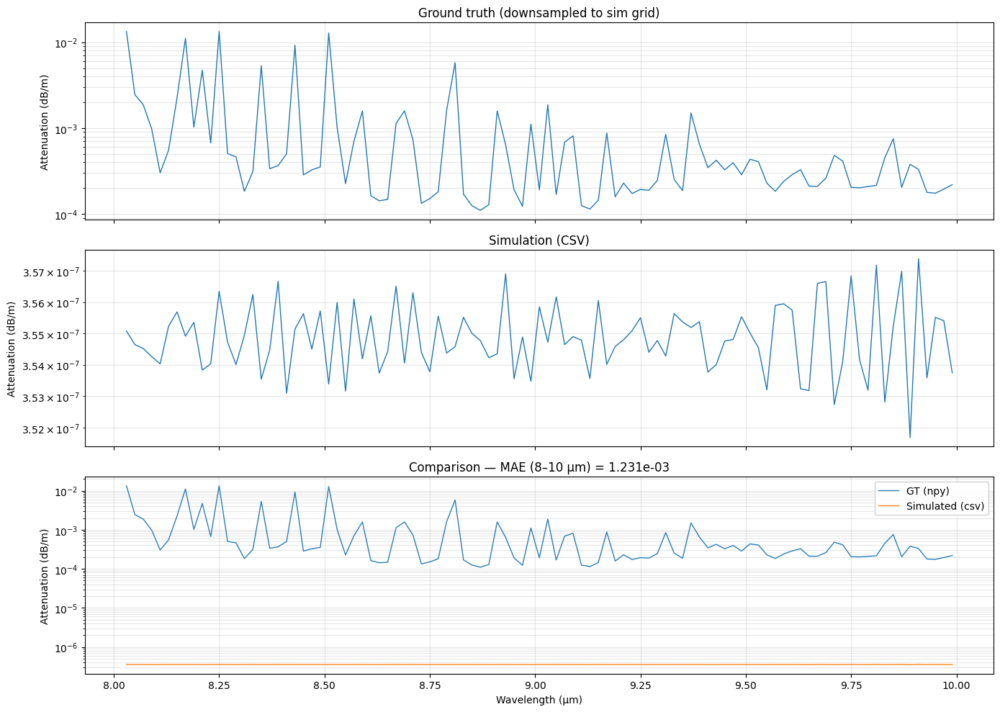

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# NEW GT output produced by instance.py
gt_npy_path  = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/GT_Attenuation_dbm__downsampled_to_sim_grid.npy"

# Sim output (still fine to read from CSV)
sim_csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_ELSASSER_ONLY/attenuation_total.csv"
L_m = 1.0

# -------------------- load --------------------
lam_gt, A_gt = unpack_npy_spectrum(np.load(gt_npy_path))
lam_sim, A_sim = load_sim_from_csv(sim_csv_path, L_m=L_m)

# -------------------- VIEW WINDOW (EDIT) --------------------
lam_view_min = 8.0
lam_view_max = 10.0

m_gt  = (lam_gt  >= lam_view_min) & (lam_gt  <= lam_view_max)
lam_gt_v, A_gt_v = lam_gt[m_gt], A_gt[m_gt]

m_sim  = (lam_sim >= lam_view_min) & (lam_sim <= lam_view_max)
lam_sim_v, A_sim_v = lam_sim[m_sim], A_sim[m_sim]

# IMPORTANT: compute MAE on the same window you are plotting
mae = mae_interp_sim_on_gt(lam_gt_v, A_gt_v, lam_sim_v, A_sim_v)

# -------------------- plot --------------------
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt_v, semilogy_safe(A_gt_v), lw=1)
axes[0].set_title("Ground truth (downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim_v, semilogy_safe(A_sim_v), lw=1)
axes[1].set_title("Simulation (CSV)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt_v, semilogy_safe(A_gt_v), label="GT (npy)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim_v, semilogy_safe(A_sim_v), label="Simulated (csv)", lw=1, alpha=0.95)
axes[2].set_title(f"Comparison — MAE (8–10 µm) = {mae:.3e}")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## **Just proof some**

In [4]:
# -------------------- core conversions --------------------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    T = np.asarray(T, dtype=np.float64)
    return -(10.0 / max(float(L_m), 1e-300)) * np.log10(np.clip(T, 1e-300, 1.0))

def unpack_npy_spectrum(arr: np.ndarray):
    """Accept (2,N) or (N,2) -> (lam, y), sorted by lam."""
    a = np.asarray(arr)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D array, got {a.shape}")
    if a.shape[0] == 2:
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    lam = np.asarray(lam, float).ravel()
    y   = np.asarray(y, float).ravel()
    idx = np.argsort(lam)
    return lam[idx], y[idx]

def semilogy_safe(y: np.ndarray, eps: float = 1e-15) -> np.ndarray:
    y = np.asarray(y, float)
    out = y.copy()
    m = np.isfinite(out)
    out[m] = np.clip(out[m], eps, None)
    return out

def crop_window(lam, y, lam_min=None, lam_max=None):
    m = np.ones_like(lam, dtype=bool)
    if lam_min is not None: m &= (lam >= lam_min)
    if lam_max is not None: m &= (lam <= lam_max)
    return lam[m], y[m]

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    mask = (lam_gt >= lam_sim.min()) & (lam_gt <= lam_sim.max())
    if not np.any(mask):
        return np.nan
    y_sim_on_gt = np.interp(lam_gt[mask], lam_sim, y_sim)
    m2 = np.isfinite(y_gt[mask]) & np.isfinite(y_sim_on_gt)
    if not np.any(m2):
        return np.nan
    return float(np.mean(np.abs(y_gt[mask][m2] - y_sim_on_gt[m2])))


Saved: SIMULATED/Attenuation_CH4_4-10_1m__GT_downsampled_to_sim_grid.npy


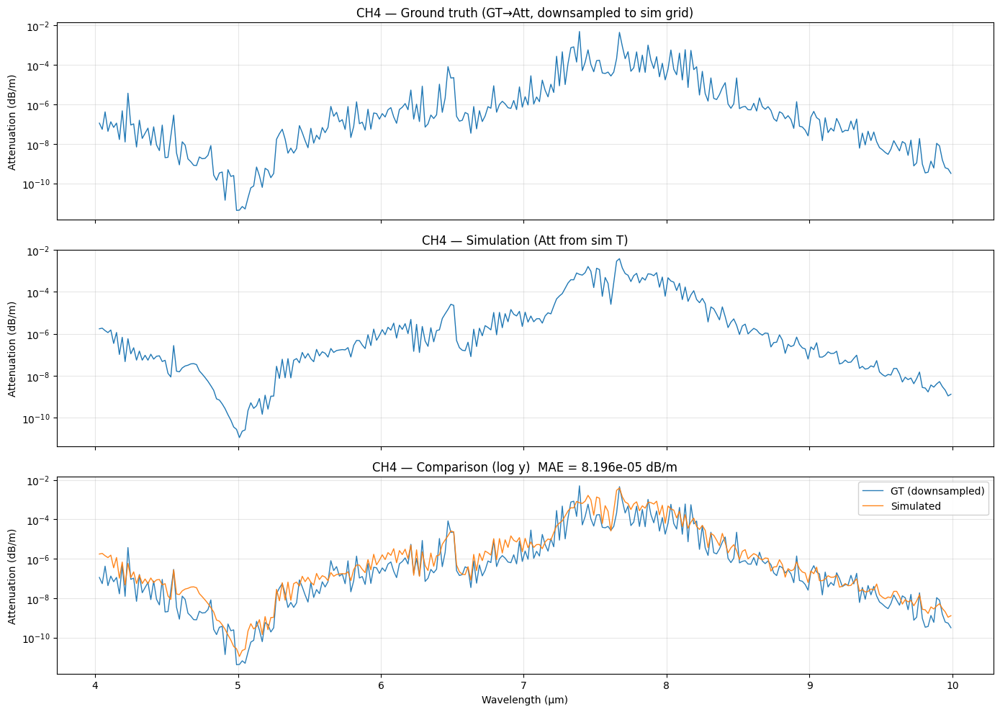

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

gas = "CH4"
L_m = 1.0

gt_path  = f"GT_PROFE/{gas}_4-10.npy"                
sim_path = f"SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"  


gt_is_transmittance = True

lam_min_plot = 4.0
lam_max_plot = 10.0


out_gt_att_down = f"SIMULATED/Attenuation_{gas}_4-10_1m__GT_downsampled_to_sim_grid.npy"


lam_gt, y_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


if gt_is_transmittance:
    A_gt = T_to_att_dbm(y_gt, L_m=L_m)
else:
    A_gt = np.asarray(y_gt, dtype=np.float64)


A_sim = T_to_att_dbm(T_sim, L_m=L_m)

A_gt_on_sim = np.interp(lam_sim, lam_gt, A_gt, left=np.nan, right=np.nan)


np.save(out_gt_att_down, np.vstack([lam_sim, A_gt_on_sim]))
print("Saved:", out_gt_att_down)

lam_gt2, A_gt2 = crop_window(lam_sim, A_gt_on_sim, lam_min_plot, lam_max_plot)
lam_sim2, A_sim2 = crop_window(lam_sim, A_sim, lam_min_plot, lam_max_plot)

m = np.isfinite(A_gt2) & np.isfinite(A_sim2)
mae = float(np.mean(np.abs(A_gt2[m] - A_sim2[m]))) if np.any(m) else np.nan


fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

axes[0].semilogy(lam_gt2, semilogy_safe(A_gt2), lw=1)
axes[0].set_title(f"{gas} — Ground truth (GT→Att, downsampled to sim grid)")
axes[0].set_ylabel("Attenuation (dB/m)")
axes[0].grid(alpha=0.3, which="both")

axes[1].semilogy(lam_sim2, semilogy_safe(A_sim2), lw=1)
axes[1].set_title(f"{gas} — Simulation (Att from sim T)")
axes[1].set_ylabel("Attenuation (dB/m)")
axes[1].grid(alpha=0.3, which="both")

axes[2].semilogy(lam_gt2, semilogy_safe(A_gt2), label="GT (downsampled)", lw=1, alpha=0.95)
axes[2].semilogy(lam_sim2, semilogy_safe(A_sim2), label="Simulated", lw=1, alpha=0.95)
axes[2].set_title(f"{gas} — Comparison (log y)  MAE = {mae:.3e} dB/m")
axes[2].set_xlabel("Wavelength (µm)")
axes[2].set_ylabel("Attenuation (dB/m)")
axes[2].legend(loc="best", framealpha=0.9)
axes[2].grid(alpha=0.3, which="both")

plt.tight_layout()
plt.show()


## CH4

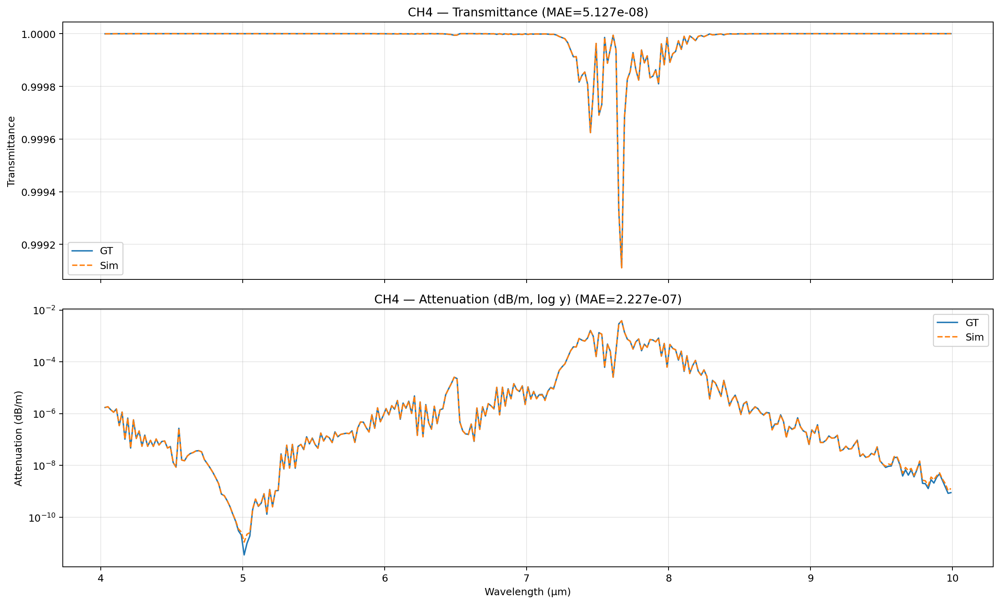

In [13]:

gas = "CH4"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## N2O

In [19]:
gt = np.load("GT_PROFE/N2O_4-10.npy")
sim = np.load("SIMULATED/Simulated_N2O_4-10_1m_AGAIN.npy")  
output = "SIMULATED/N2O_4-10_downsampled_AGAIN.npy"
downsample(sim, gt, output)

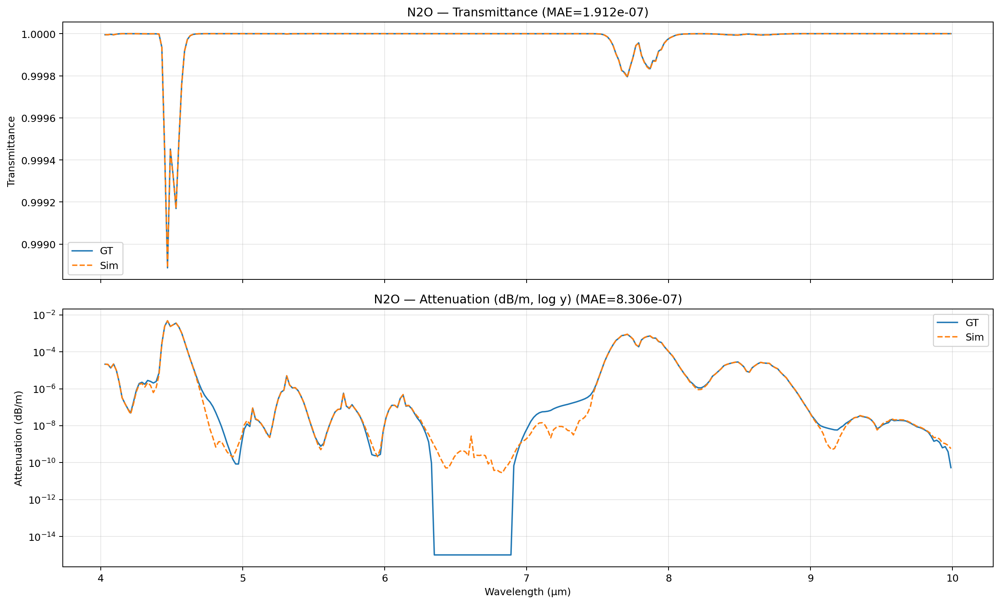

In [39]:

gas = "N2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled_AGAIN.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


dtypes: lam_gt float32 T_gt float32 A_gt float32


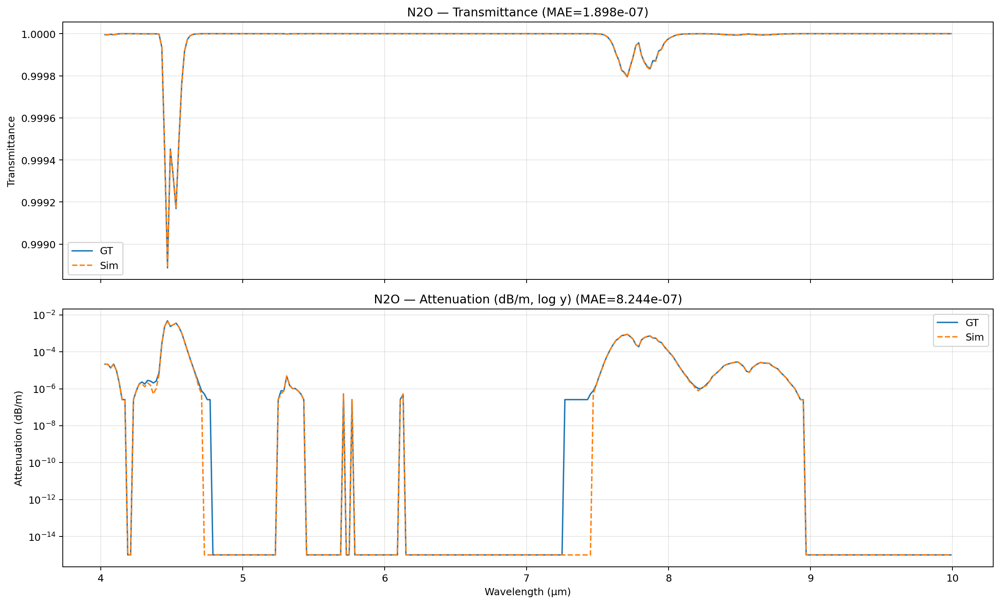

In [1]:
import numpy as np
import matplotlib.pyplot as plt

DT = np.float32  # <<< set your desired dtype here

def unpack_spectrum(a, dtype=DT):
    """
    Unpack either shape (2,N) or (N,2) WITHOUT forcing float64.
    """
    a = np.asarray(a)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D, got {a.shape}")
    if a.shape[0] == 2:      # (2, N)
        lam, y = a[0], a[1]
    elif a.shape[1] == 2:    # (N, 2)
        lam, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")

    # IMPORTANT: do not use `float` (float64). Cast to dtype you want.
    return np.asarray(lam, dtype=dtype), np.asarray(y, dtype=dtype)

def spectrum_metrics(y_true, y_pred, eps=1e-12, dtype=DT):
    """
    Metrics computed on float32 arrays (but some ops may use float64 internally).
    """
    y_true = np.asarray(y_true, dtype=dtype)
    y_pred = np.asarray(y_pred, dtype=dtype)

    m = np.isfinite(y_true) & np.isfinite(y_pred)
    y_true = y_true[m]
    y_pred = y_pred[m]

    e = y_pred - y_true

    # use float64 for the reductions if you want stable numbers; keep outputs float
    mae   = float(np.mean(np.abs(e), dtype=np.float64))
    mse   = float(np.mean(e * e, dtype=np.float64))
    rmse  = float(np.sqrt(mse))
    medae = float(np.median(np.abs(e)))
    maxae = float(np.max(np.abs(e)))

    rel_l1 = float(np.sum(np.abs(e), dtype=np.float64) / (np.sum(np.abs(y_true), dtype=np.float64) + eps))

    mape  = float(np.mean(np.abs(e) / (np.abs(y_true) + eps), dtype=np.float64))
    smape = float(np.mean(2.0 * np.abs(e) / (np.abs(y_true) + np.abs(y_pred) + eps), dtype=np.float64))

    corr = float(np.corrcoef(y_true.astype(np.float64), y_pred.astype(np.float64))[0, 1]) if y_true.size > 1 else np.nan
    ss_res = float(np.sum(e * e, dtype=np.float64))
    ss_tot = float(np.sum((y_true - np.mean(y_true)) ** 2, dtype=np.float64) + eps)
    r2 = float(1.0 - ss_res / ss_tot)

    num = float(np.dot(y_true.astype(np.float64), y_pred.astype(np.float64)))
    den = float(np.linalg.norm(y_true.astype(np.float64)) * np.linalg.norm(y_pred.astype(np.float64)) + eps)
    sam_deg = float(np.degrees(np.arccos(np.clip(num / den, -1.0, 1.0))))

    return {
        "MAE": mae, "RMSE": rmse, "MedAE": medae, "MaxAE": maxae,
        "RelL1": rel_l1, "MAPE": mape, "sMAPE": smape,
        "Corr": corr, "R2": r2, "SAM_deg": sam_deg,
    }

# -------------------- core conversions --------------------
def T_to_att_dbm(T: np.ndarray, L_m: float) -> np.ndarray:
    # keep dtype float32
    T = np.asarray(T, dtype=DT)
    invL = DT(1.0) / DT(max(float(L_m), 1e-30))
    return -(DT(10.0) * invL) * np.log10(np.clip(T, DT(1e-30), DT(1.0))).astype(DT)

def semilogy_safe(y, floor=1e-15):
    """
    For plotting only: replace <=0 with a floor so semilogy doesn't crash.
    Keeps dtype float32.
    """
    y = np.asarray(y, dtype=DT)
    y2 = y.copy()
    y2[~np.isfinite(y2)] = np.nan
    y2[y2 <= 0] = DT(floor)
    return y2

def mae_interp_sim_on_gt(lam_gt, y_gt, lam_sim, y_sim):
    """
    MAE after interpolating SIM onto GT wavelength grid.
    """
    lam_gt = np.asarray(lam_gt, dtype=DT)
    y_gt   = np.asarray(y_gt, dtype=DT)
    lam_sim = np.asarray(lam_sim, dtype=DT)
    y_sim   = np.asarray(y_sim, dtype=DT)

    y_sim_on_gt = np.interp(lam_gt.astype(np.float64), lam_sim.astype(np.float64), y_sim.astype(np.float64),
                            left=np.nan, right=np.nan).astype(DT)

    m = np.isfinite(y_gt) & np.isfinite(y_sim_on_gt)
    if not np.any(m):
        return np.nan
    return float(np.mean(np.abs(y_gt[m] - y_sim_on_gt[m]), dtype=np.float64))

# -------------------- plotting script --------------------
gas = "N2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled_AGAIN.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"

lam_min_plot = None
lam_max_plot = None

lam_gt, T_gt   = unpack_spectrum(np.load(gt_path), dtype=DT)
lam_sim, T_sim = unpack_spectrum(np.load(sim_path), dtype=DT)

def crop(lam, y):
    lam = np.asarray(lam, dtype=DT)
    y   = np.asarray(y, dtype=DT)
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= DT(lam_min_plot)
    if lam_max_plot is not None:
        m &= lam <= DT(lam_max_plot)
    return lam[m], y[m]

lam_gt_p, T_gt_p   = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)

mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)

A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)

print("dtypes:",
      "lam_gt", lam_gt.dtype,
      "T_gt", T_gt.dtype,
      "A_gt", A_gt_p.dtype)

fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)

ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim")
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)

ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim")
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


In [2]:
T_sim.dtype

dtype('float32')

In [24]:
# after loading/cropping:
print("T_gt min/max:", np.nanmin(T_gt_p), np.nanmax(T_gt_p))
print("T_sim min/max:", np.nanmin(T_sim_p), np.nanmax(T_sim_p))

eps = 1e-15
print("GT count T>=1:", np.sum(T_gt_p >= 1.0))
print("GT count 1-T < eps:", np.sum((1.0 - T_gt_p) < eps))

A_gt_p = T_to_att_dbm(T_gt_p, L_m=L_m)
print("A_gt min/max:", np.nanmin(A_gt_p), np.nanmax(A_gt_p))
print("GT count A==0:", np.sum(A_gt_p == 0.0))



T_gt min/max: 0.9988869897301152 1.0
T_sim min/max: 0.9988877161025422 0.9999999999935487
GT count T>=1: 28
GT count 1-T < eps: 28
A_gt min/max: -0.0 0.004836434185140794
GT count A==0: 28


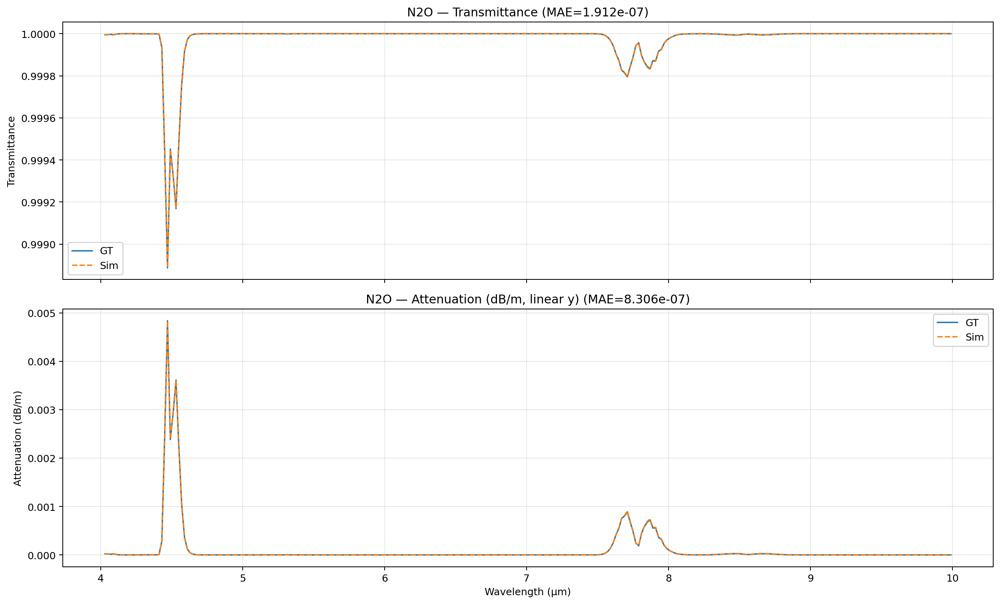

In [28]:
import numpy as np
import matplotlib.pyplot as plt

gas = "N2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"

lam_min_plot = None
lam_max_plot = None

lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))

def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)

# MAE in transmittance
mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)

# Attenuation (dB/m)
A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

# MAE in attenuation
mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)

fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)

# Transmittance panel
ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim")
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)

# Attenuation panel (LINEAR y)
ax = axes[1]
ax.plot(lam_gt_p,  A_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, A_sim_p, lw=1.4, ls="--", label="Sim")
ax.set_title(f"{gas} — Attenuation (dB/m, linear y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **CO2**

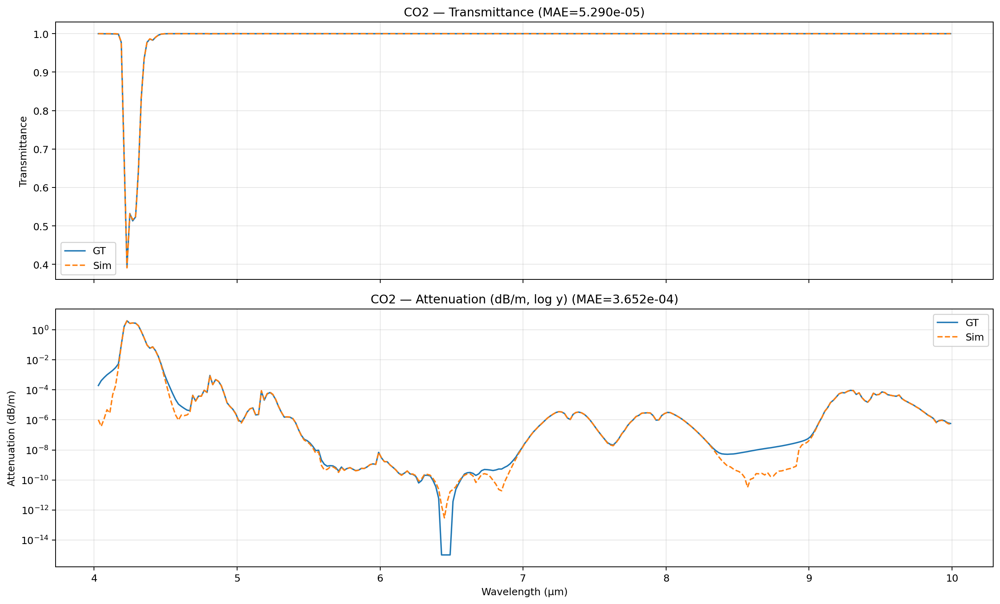

In [32]:

gas = "CO2"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()



Window [8.3, 9.1] µm
  MAE_T  = 3.158e-09   max|ΔT| = 7.673e-09
  MAE_A  = 1.371e-08 dB/m   max|ΔA| = 3.332e-08 dB/m
  rel_A p95 = 9.875e-01


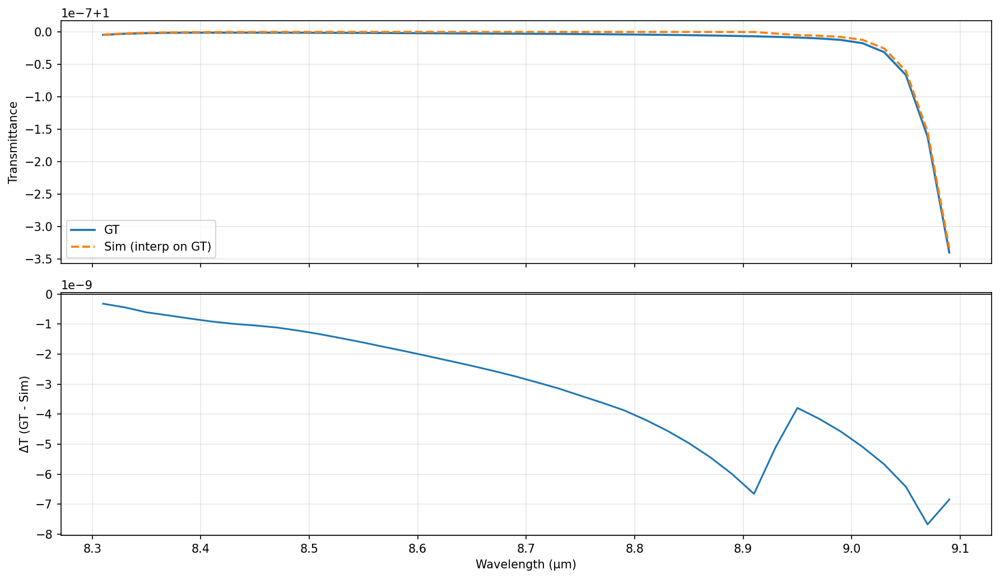

(array([8.31, 8.33, 8.35, 8.37, 8.39, 8.41, 8.43, 8.45, 8.47, 8.49, 8.51,
        8.53, 8.55, 8.57, 8.59, 8.61, 8.63, 8.65, 8.67, 8.69, 8.71, 8.73,
        8.75, 8.77, 8.79, 8.81, 8.83, 8.85, 8.87, 8.89, 8.91, 8.93, 8.95,
        8.97, 8.99, 9.01, 9.03, 9.05, 9.07, 9.09]),
 array([1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 0.99999999, 0.99999999, 0.99999999,
        0.99999999, 0.99999999, 0.99999999, 0.99999999, 0.99999999,
        0.99999998, 0.99999997, 0.99999993, 0.99999984, 0.99999966]),
 array([1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 

In [33]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_window(l0, l1, lam_gt, T_gt, lam_sim, T_sim, L_m=1.0):
    # Put both on GT grid (you can swap to sim grid if you prefer)
    lam = lam_gt.copy()
    T_sim_on_gt = np.interp(lam, lam_sim, T_sim, left=np.nan, right=np.nan)

    # Window mask
    m = (lam >= l0) & (lam <= l1) & np.isfinite(T_gt) & np.isfinite(T_sim_on_gt)
    lam_w = lam[m]
    Tgt_w = T_gt[m]
    Tsm_w = T_sim_on_gt[m]

    # Convert to attenuation (dB/m)
    Agt_w = T_to_att_dbm(Tgt_w, L_m=L_m)
    Asm_w = T_to_att_dbm(Tsm_w, L_m=L_m)

    # Metrics
    mae_T = np.mean(np.abs(Tgt_w - Tsm_w))
    max_T = np.max(np.abs(Tgt_w - Tsm_w))

    mae_A = np.mean(np.abs(Agt_w - Asm_w))
    max_A = np.max(np.abs(Agt_w - Asm_w))

    # Relative error in A where Agt is not tiny
    eps = 1e-12
    rel_A = np.abs(Agt_w - Asm_w) / np.maximum(np.abs(Agt_w), eps)
    p95_relA = np.percentile(rel_A, 95)

    print(f"\nWindow [{l0}, {l1}] µm")
    print(f"  MAE_T  = {mae_T:.3e}   max|ΔT| = {max_T:.3e}")
    print(f"  MAE_A  = {mae_A:.3e} dB/m   max|ΔA| = {max_A:.3e} dB/m")
    print(f"  rel_A p95 = {p95_relA:.3e}")

    # Plot local comparison
    fig, ax = plt.subplots(2, 1, figsize=(12, 7), sharex=True, dpi=150)

    ax[0].plot(lam_w, Tgt_w, label="GT", lw=1.8)
    ax[0].plot(lam_w, Tsm_w, label="Sim (interp on GT)", lw=1.8, ls="--")
    ax[0].set_ylabel("Transmittance")
    ax[0].grid(alpha=0.3)
    ax[0].legend()

    ax[1].plot(lam_w, (Tgt_w - Tsm_w), lw=1.5)
    ax[1].axhline(0, color="k", lw=0.8)
    ax[1].set_xlabel("Wavelength (µm)")
    ax[1].set_ylabel("ΔT (GT - Sim)")
    ax[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    return lam_w, Tgt_w, Tsm_w, Agt_w, Asm_w

# Example usage (change range to your mismatch region):
analyze_window(8.3, 9.1, lam_gt, T_gt, lam_sim, T_sim, L_m=1.0)


In [6]:
import numpy as np
import matplotlib.pyplot as plt

def T_to_tau(T):
    return -np.log(np.clip(np.asarray(T, dtype=np.float64), 1e-300, 1.0))

def analyze_window_T_and_A(
    l0, l1,
    lam_gt, T_gt,
    lam_sim, T_sim,
    L_m=1.0,
    topk=10
):
    lam_gt = np.asarray(lam_gt, dtype=np.float64)
    T_gt   = np.asarray(T_gt,   dtype=np.float64)
    lam_sim = np.asarray(lam_sim, dtype=np.float64)
    T_sim   = np.asarray(T_sim,   dtype=np.float64)

    # Put SIM onto GT grid (you can swap the direction if you prefer)
    T_sim_on_gt = np.interp(lam_gt, lam_sim, T_sim, left=np.nan, right=np.nan)

    # Window mask
    m = (lam_gt >= l0) & (lam_gt <= l1) & np.isfinite(T_gt) & np.isfinite(T_sim_on_gt)
    if np.sum(m) < 5:
        print(f"Not enough points in [{l0}, {l1}] µm")
        return

    lam = lam_gt[m]
    T1  = T_gt[m]
    T2  = T_sim_on_gt[m]

    # Attenuation (dB/m)
    A1 = T_to_att_dbm(T1, L_m=L_m)
    A2 = T_to_att_dbm(T2, L_m=L_m)

    # Optical depth (often useful for diagnosis)
    tau1 = T_to_tau(T1)
    tau2 = T_to_tau(T2)

    # Errors
    dT = T1 - T2
    dA = A1 - A2
    dtau = tau1 - tau2

    # Metrics
    mae_T  = float(np.mean(np.abs(dT)))
    max_T  = float(np.max(np.abs(dT)))

    mae_A  = float(np.mean(np.abs(dA)))
    max_A  = float(np.max(np.abs(dA)))

    mae_tau = float(np.mean(np.abs(dtau)))
    max_tau = float(np.max(np.abs(dtau)))

    # Relative attenuation error where GT attenuation isn't ~0
    epsA = 1e-12
    relA = np.abs(dA) / np.maximum(np.abs(A1), epsA)
    p50_relA = float(np.percentile(relA, 50))
    p95_relA = float(np.percentile(relA, 95))

    print(f"\nWindow [{l0}, {l1}] µm  (N={lam.size})")
    print(f"  Transmittance:  MAE={mae_T:.3e}   max|ΔT|={max_T:.3e}")
    print(f"  Attenuation:    MAE={mae_A:.3e} dB/m   max|ΔA|={max_A:.3e} dB/m")
    print(f"  Optical depth:  MAE={mae_tau:.3e}   max|Δτ|={max_tau:.3e}")
    print(f"  relA (|ΔA|/|A_gt|): median={p50_relA:.3e}  p95={p95_relA:.3e}  (eps={epsA})")

    # Print worst points by |ΔA|
    idx = np.argsort(np.abs(dA))[::-1][:topk]
    print("\nTop mismatches by |ΔA|:")
    print("  #   lambda(um)     T_gt         T_sim        ΔT         A_gt(dB/m)    A_sim(dB/m)    ΔA")
    for k, i in enumerate(idx, 1):
        print(f" {k:2d}  {lam[i]:9.4f}  {T1[i]:.12f}  {T2[i]:.12f}  {dT[i]: .3e}   {A1[i]: .3e}    {A2[i]: .3e}   {dA[i]: .3e}")

    # ---- Plots ----
    fig, axes = plt.subplots(3, 1, figsize=(13, 9), dpi=160, sharex=True)

    # T overlay
    axes[0].plot(lam, T1, lw=1.8, label="GT")
    axes[0].plot(lam, T2, lw=1.8, ls="--", label="Sim (interp on GT)")
    axes[0].set_ylabel("Transmittance")
    axes[0].set_title(f"Window [{l0}, {l1}] µm — Transmittance")
    axes[0].grid(alpha=0.3)
    axes[0].legend()

    # Attenuation overlay (LOG y, but handle zeros safely for plotting)
    # We DO NOT change values used for metrics; only avoid log(0) in the plot.
    A1_plot = A1.copy()
    A2_plot = A2.copy()
    A1_plot[A1_plot <= 0] = np.nan
    A2_plot[A2_plot <= 0] = np.nan

    axes[1].semilogy(lam, A1_plot, lw=1.8, label="GT")
    axes[1].semilogy(lam, A2_plot, lw=1.8, ls="--", label="Sim (interp on GT)")
    axes[1].set_ylabel("Attenuation (dB/m)")
    axes[1].set_title(f"Window [{l0}, {l1}] µm — Attenuation (log y)")
    axes[1].grid(alpha=0.3, which="both")
    axes[1].legend()

    # Residuals
    axes[2].plot(lam, dT, lw=1.4, label="ΔT = GT - Sim")
    axes[2].axhline(0, color="k", lw=0.8)
    axes[2].set_xlabel("Wavelength (µm)")
    axes[2].set_ylabel("ΔT")
    axes[2].set_title("Residual in transmittance")
    axes[2].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Also show attenuation residual on a separate plot (linear, so zeros are fine)
    plt.figure(figsize=(13, 3.5), dpi=160)
    plt.plot(lam, dA, lw=1.4)
    plt.axhline(0, color="k", lw=0.8)
    plt.grid(alpha=0.3)
    plt.xlabel("Wavelength (µm)")
    plt.ylabel("ΔA (dB/m)")
    plt.title(f"Window [{l0}, {l1}] µm — Attenuation residual ΔA (linear y)")
    plt.tight_layout()
    plt.show()

    return {
        "lam": lam, "T_gt": T1, "T_sim": T2, "A_gt": A1, "A_sim": A2,
        "dT": dT, "dA": dA, "tau_gt": tau1, "tau_sim": tau2, "dtau": dtau
    }

# Example call: change to the CO2 mismatch region you care about
# analyze_window_T_and_A(8.4, 9.0, lam_gt, T_gt, lam_sim, T_sim, L_m=1.0, topk=12)



Window [8.35, 9.05] µm  (N=35)
  Transmittance:  MAE=3.155e-09   max|ΔT|=6.655e-09
  Attenuation:    MAE=1.370e-08 dB/m   max|ΔA|=2.890e-08 dB/m
  Optical depth:  MAE=3.155e-09   max|Δτ|=6.655e-09
  relA (|ΔA|/|A_gt|): median=9.737e-01  p95=9.877e-01  (eps=1e-12)

Top mismatches by |ΔA|:
  #   lambda(um)     T_gt         T_sim        ΔT         A_gt(dB/m)    A_sim(dB/m)    ΔA
  1     8.9100  0.999999993155  0.999999999810  -6.655e-09    2.973e-08     8.252e-10    2.890e-08
  2     9.0500  0.999999933476  0.999999939896  -6.420e-09    2.889e-07     2.610e-07    2.788e-08
  3     8.8900  0.999999993840  0.999999999842  -6.002e-09    2.675e-08     6.875e-10    2.607e-08
  4     9.0300  0.999999968704  0.999999974375  -5.671e-09    1.359e-07     1.113e-07    2.463e-08
  5     8.8700  0.999999994421  0.999999999866  -5.445e-09    2.423e-08     5.807e-10    2.365e-08
  6     8.9300  0.999999992328  0.999999997422  -5.094e-09    3.332e-08     1.120e-08    2.212e-08
  7     9.0100  0.99999998

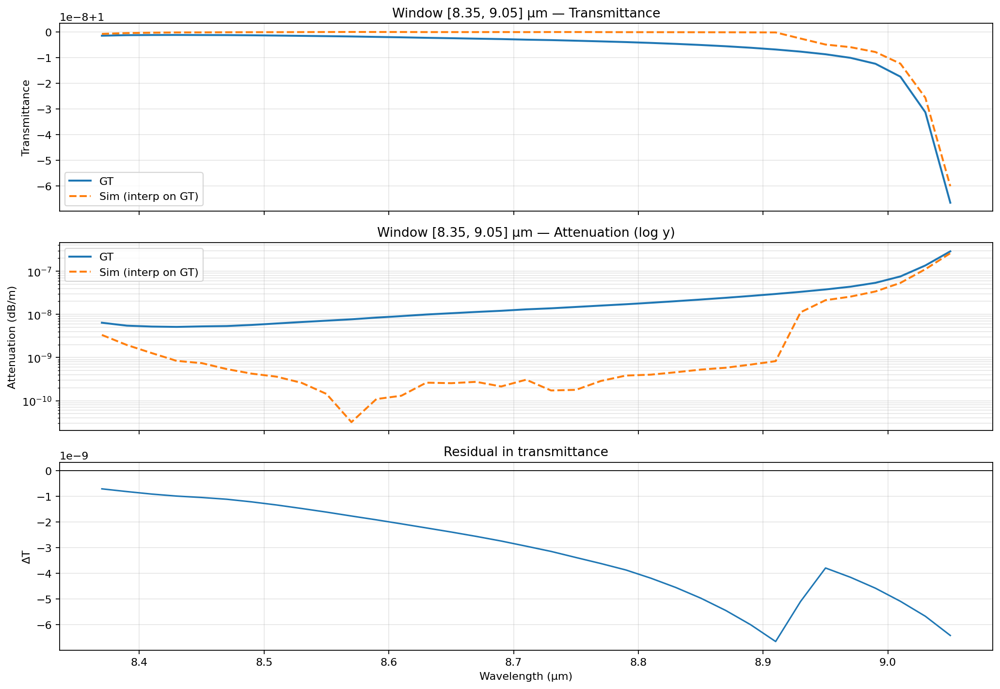

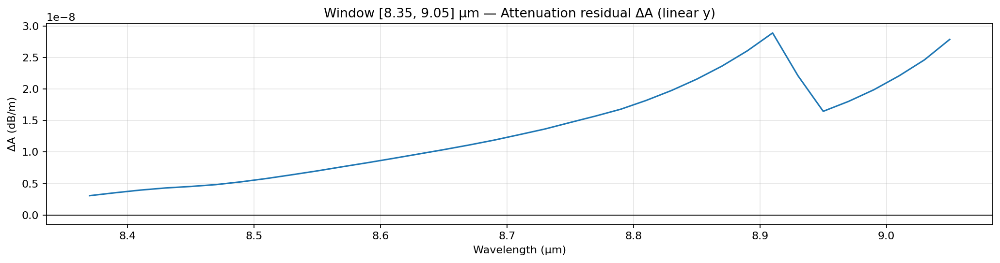

{'lam': array([8.37, 8.39, 8.41, 8.43, 8.45, 8.47, 8.49, 8.51, 8.53, 8.55, 8.57,
        8.59, 8.61, 8.63, 8.65, 8.67, 8.69, 8.71, 8.73, 8.75, 8.77, 8.79,
        8.81, 8.83, 8.85, 8.87, 8.89, 8.91, 8.93, 8.95, 8.97, 8.99, 9.01,
        9.03, 9.05]),
 'T_gt': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 0.99999999,
        0.99999999, 0.99999999, 0.99999999, 0.99999999, 0.99999999,
        0.99999999, 0.99999999, 0.99999998, 0.99999997, 0.99999993]),
 'T_sim': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.    

In [35]:
analyze_window_T_and_A(8.35, 9.05, lam_gt, T_gt, lam_sim, T_sim, L_m=1.0)


## **CO**

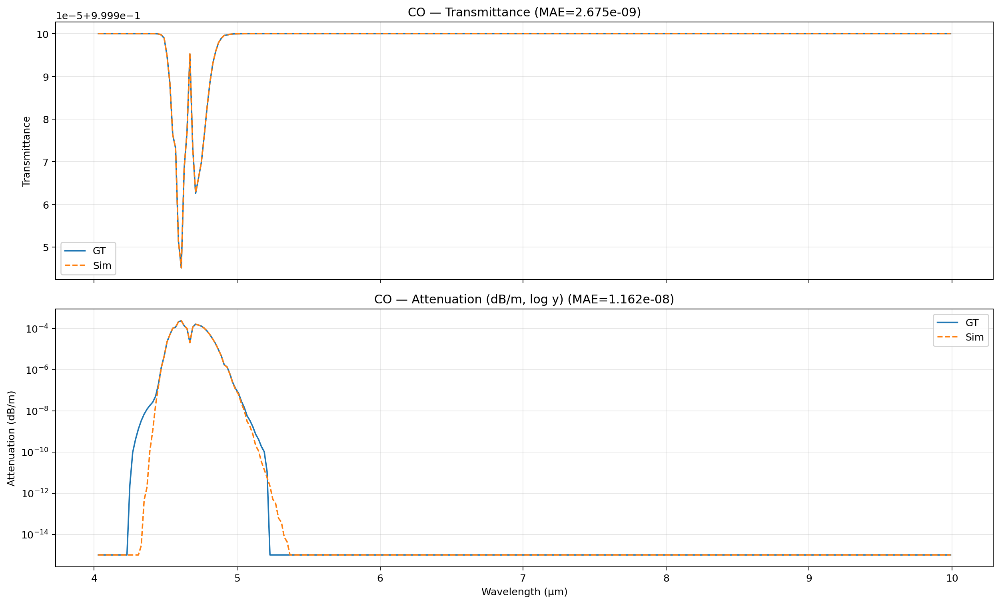

In [5]:

gas = "CO"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()



Window [4.35, 4.45] µm  (N=5)
  Transmittance:  MAE=6.067e-09   max|ΔT|=1.029e-08
  Attenuation:    MAE=2.635e-08 dB/m   max|ΔA|=4.467e-08 dB/m
  Optical depth:  MAE=6.067e-09   max|Δτ|=1.029e-08
  relA (|ΔA|/|A_gt|): median=9.588e-01  p95=9.986e-01  (eps=1e-12)

Top mismatches by |ΔA|:
  #   lambda(um)     T_gt         T_sim        ΔT         A_gt(dB/m)    A_sim(dB/m)    ΔA
  1     4.4500  0.999999954353  0.999999964638  -1.029e-08    1.982e-07     1.536e-07    4.467e-08
  2     4.4300  0.999999988340  0.999999995669  -7.329e-09    5.064e-08     1.881e-08    3.183e-08
  3     4.4100  0.999999993968  0.999999999751  -5.783e-09    2.620e-08     1.079e-09    2.512e-08
  4     4.3900  0.999999995791  0.999999999974  -4.183e-09    1.828e-08     1.129e-10    1.817e-08
  5     4.3700  0.999999997243  1.000000000000  -2.757e-09    1.197e-08     1.952e-12    1.197e-08


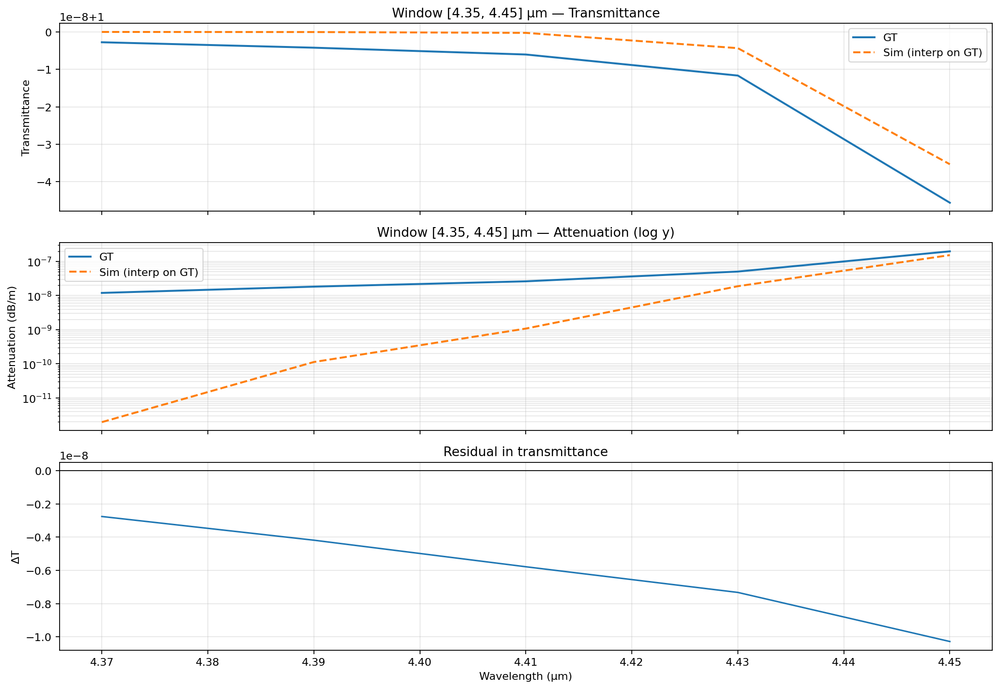

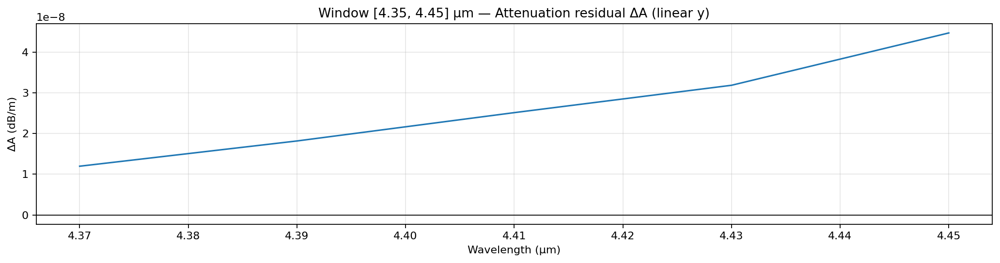

{'lam': array([4.37, 4.39, 4.41, 4.43, 4.45]),
 'T_gt': array([1.        , 1.        , 0.99999999, 0.99999999, 0.99999995]),
 'T_sim': array([1.        , 1.        , 1.        , 1.        , 0.99999996]),
 'A_gt': array([1.19732948e-08, 1.82789959e-08, 2.61960401e-08, 5.06377396e-08,
        1.98242395e-07]),
 'A_sim': array([1.95228096e-12, 1.12853315e-10, 1.07943779e-09, 1.88075650e-08,
        1.53574545e-07]),
 'dT': array([-2.75650347e-09, -4.18290891e-09, -5.78331139e-09, -7.32916849e-09,
        -1.02851522e-08]),
 'dA': array([1.19713425e-08, 1.81661426e-08, 2.51166023e-08, 3.18301746e-08,
        4.46678502e-08]),
 'tau_gt': array([2.75695300e-09, 4.20889435e-09, 6.03186114e-09, 1.16597704e-08,
        4.56469983e-08]),
 'tau_sim': array([4.49529303e-13, 2.59854360e-11, 2.48549736e-10, 4.33060189e-09,
        3.53618457e-08]),
 'dtau': array([2.75650347e-09, 4.18290892e-09, 5.78331140e-09, 7.32916855e-09,
        1.02851526e-08])}

In [15]:
analyze_window_T_and_A(4.35, 4.45, lam_gt, T_gt, lam_sim, T_sim, L_m=1.0)

## **O3**

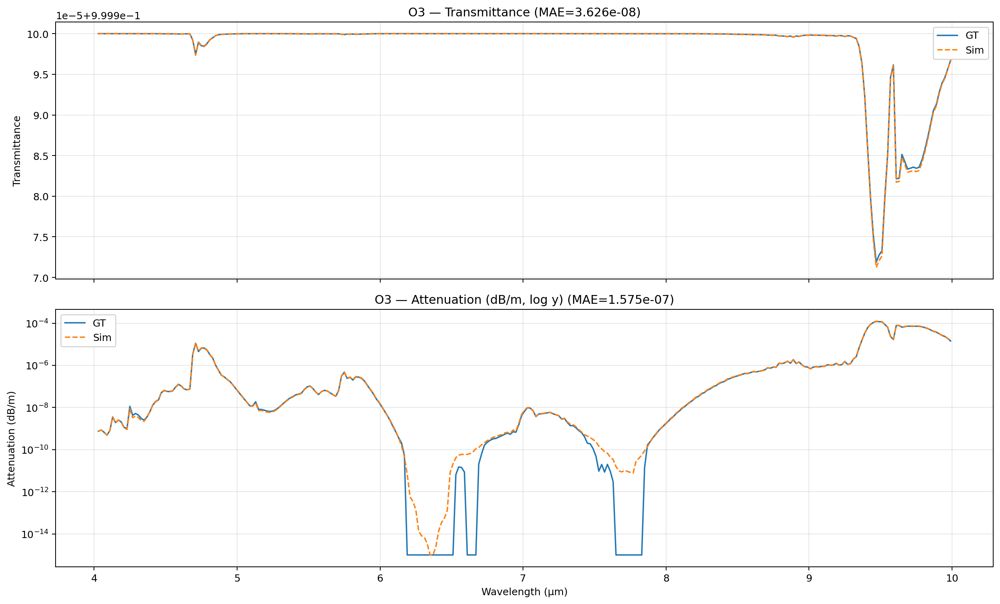

In [17]:

gas = "O3"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **H2O**

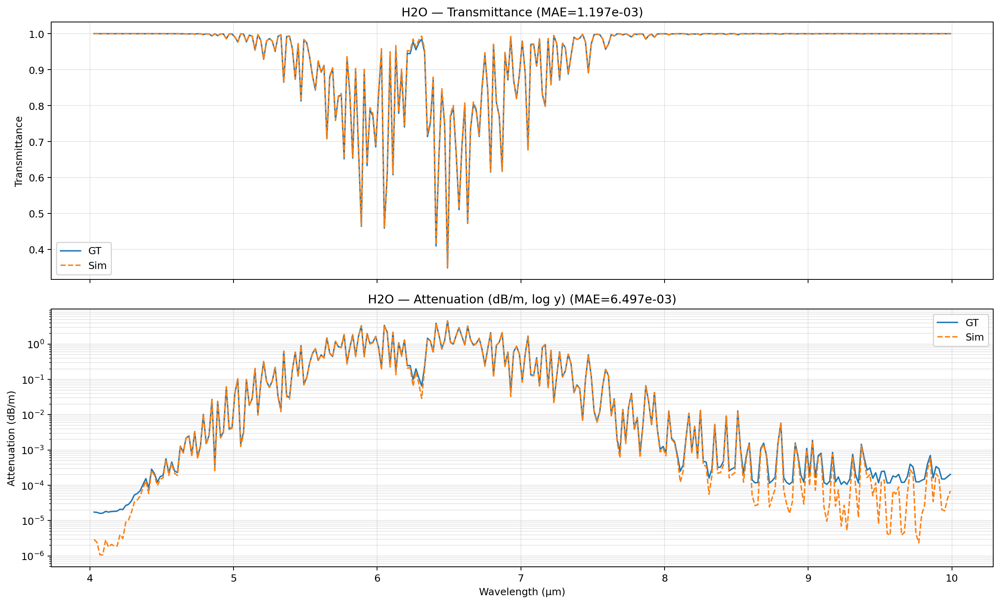

In [18]:

gas = "H2O"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## All

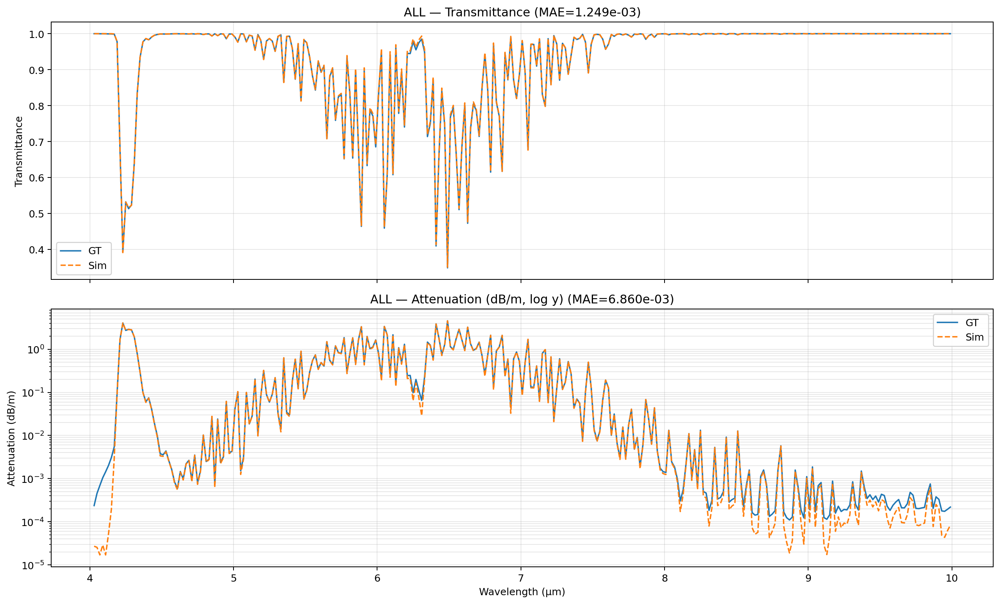

In [14]:

gas = "ALL"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


## **And again**

In [ ]:

gas = "CH4"
L_m = 1.0

gt_path  = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/{gas}_4-10_downsampled.npy"
sim_path = f"/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/SIMULATED/Simulated_{gas}_4-10_1m_AGAIN.npy"


lam_min_plot = None  
lam_max_plot = None  


lam_gt, T_gt = unpack_npy_spectrum(np.load(gt_path))
lam_sim, T_sim = unpack_npy_spectrum(np.load(sim_path))


def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

lam_gt_p, T_gt_p = crop(lam_gt, T_gt)
lam_sim_p, T_sim_p = crop(lam_sim, T_sim)


mae_T = mae_interp_sim_on_gt(lam_gt_p, T_gt_p, lam_sim_p, T_sim_p)


A_gt_p  = T_to_att_dbm(T_gt_p,  L_m=L_m)
A_sim_p = T_to_att_dbm(T_sim_p, L_m=L_m)

mae_A = mae_interp_sim_on_gt(lam_gt_p, A_gt_p, lam_sim_p, A_sim_p)


fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)


ax = axes[0]
ax.plot(lam_gt_p,  T_gt_p,  lw=1.4, label="GT")
ax.plot(lam_sim_p, T_sim_p, lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Transmittance (MAE={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)


ax = axes[1]
ax.semilogy(lam_gt_p,  semilogy_safe(A_gt_p),  lw=1.4, label="GT")
ax.semilogy(lam_sim_p, semilogy_safe(A_sim_p), lw=1.4, ls="--", label="Sim") 
ax.set_title(f"{gas} — Attenuation (dB/m, log y) (MAE={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


# **RADIS vs My own pipeline**

NPY points: 15918 | CSV points: 17393
MAE(T) overlap: 8.408e-05
MAE(A) overlap: 3.657e-04


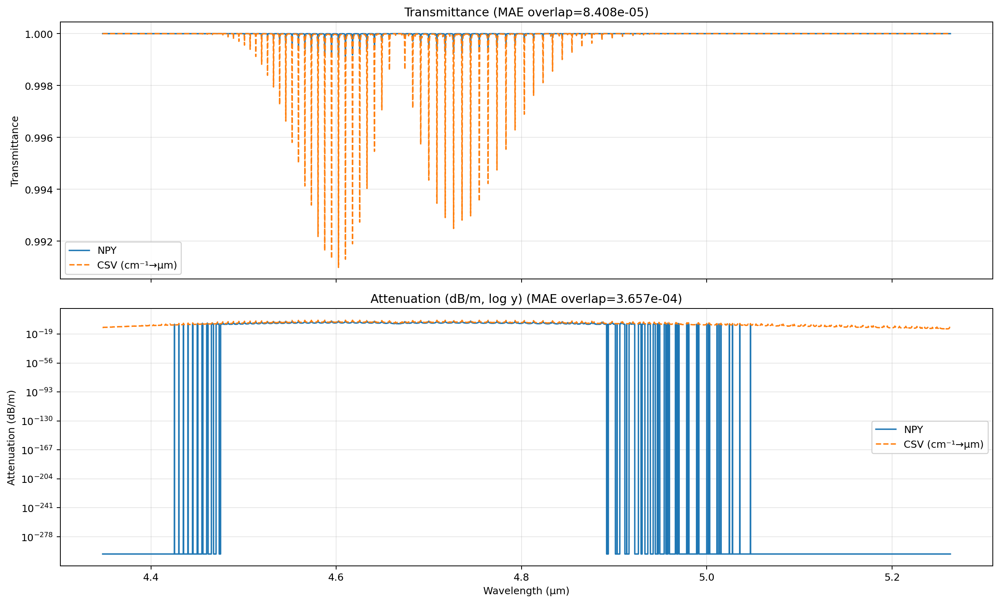

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# -----------------------
# USER SETTINGS
# -----------------------
L_m = 1.0

npy_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_RADIS/Simulated_CO.npy"   # wavelength (µm), transmittance
csv_path = "/home/jleon13/Documents/AFOSR project/Py4catsForward/forwardOscar/Stand-off/OUT_RADIS_GT/hitran_CO_1900_2300cm-1_288.2K_1.01325atm.csv"  # wavenumber (cm^-1), transmittance

lam_min_plot = 4.0   # e.g. 4.0
lam_max_plot = 6.0   # e.g. 10.0

# -----------------------
# HELPERS
# -----------------------
def unpack_npy_spectrum(a):
    a = np.asarray(a)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D, got {a.shape}")
    if a.shape[0] == 2 and a.shape[1] != 2:      # (2, N)
        x, y = a[0], a[1]
    elif a.shape[1] == 2 and a.shape[0] != 2:    # (N, 2)
        x, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    return np.asarray(x, np.float64), np.asarray(y, np.float64)

def load_csv_wavenumber_transmittance(csv_path):
    df = pd.read_csv(
        csv_path,
        comment="#",
        sep=r"\s+",
        header=None,
        names=["nu_cm1", "T"],
        engine="python",
    ).dropna()
    nu = df["nu_cm1"].to_numpy(np.float64)
    T  = df["T"].to_numpy(np.float64)
    return nu, T

def wavenumber_to_wavelength_um(nu_cm1):
    nu_cm1 = np.asarray(nu_cm1, np.float64)
    return 1e4 / nu_cm1

def crop(lam, y):
    m = np.ones_like(lam, dtype=bool)
    if lam_min_plot is not None:
        m &= lam >= lam_min_plot
    if lam_max_plot is not None:
        m &= lam <= lam_max_plot
    return lam[m], y[m]

def semilogy_safe(y, floor=1e-300):
    return np.maximum(np.asarray(y, np.float64), floor)

def T_to_att_dbm(T, L_m=1.0):
    T = np.asarray(T, np.float64)
    T = np.clip(T, 1e-300, 1.0)
    return (-10.0 * np.log10(T)) / float(L_m)

def sort_by_x(x, y):
    idx = np.argsort(x)
    return x[idx], y[idx]

def mae_interp_sim_on_gt(x_gt, y_gt, x_sim, y_sim):
    lo = max(np.min(x_gt), np.min(x_sim))
    hi = min(np.max(x_gt), np.max(x_sim))
    m = (x_gt >= lo) & (x_gt <= hi)
    if not np.any(m):
        return np.nan
    y_sim_i = np.interp(x_gt[m], x_sim, y_sim)
    return np.mean(np.abs(y_gt[m] - y_sim_i))

# -----------------------
# LOAD
# -----------------------
lam_npy, T_npy = unpack_npy_spectrum(np.load(npy_path))

nu_csv_cm1, T_csv = load_csv_wavenumber_transmittance(csv_path)
lam_csv = wavenumber_to_wavelength_um(nu_csv_cm1)

# Sort (conversion makes wavelength reversed)
lam_npy, T_npy = sort_by_x(lam_npy, T_npy)
lam_csv, T_csv = sort_by_x(lam_csv, T_csv)

# Crop
lam_npy_p, T_npy_p = crop(lam_npy, T_npy)
lam_csv_p, T_csv_p = crop(lam_csv, T_csv)

# Metrics on overlap
mae_T = mae_interp_sim_on_gt(lam_npy_p, T_npy_p, lam_csv_p, T_csv_p)

A_npy_p = T_to_att_dbm(T_npy_p, L_m=L_m)
A_csv_p = T_to_att_dbm(T_csv_p, L_m=L_m)
mae_A = mae_interp_sim_on_gt(lam_npy_p, A_npy_p, lam_csv_p, A_csv_p)

print(f"NPY points: {lam_npy_p.size} | CSV points: {lam_csv_p.size}")
print(f"MAE(T) overlap: {mae_T:.3e}")
print(f"MAE(A) overlap: {mae_A:.3e}")

# -----------------------
# PLOT
# -----------------------
fig, axes = plt.subplots(2, 1, figsize=(14, 8.5), dpi=180, sharex=True)

ax = axes[0]
ax.plot(lam_npy_p, T_npy_p, lw=1.4, label="NPY")
ax.plot(lam_csv_p, T_csv_p, lw=1.4, ls="--", label="CSV (cm⁻¹→µm)")
ax.set_title(f"Transmittance (MAE overlap={mae_T:.3e})")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.legend(loc="best", framealpha=0.9)

ax = axes[1]
ax.semilogy(lam_npy_p, semilogy_safe(A_npy_p), lw=1.4, label="NPY")
ax.semilogy(lam_csv_p, semilogy_safe(A_csv_p), lw=1.4, ls="--", label="CSV (cm⁻¹→µm)")
ax.set_title(f"Attenuation (dB/m, log y) (MAE overlap={mae_A:.3e})")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Attenuation (dB/m)")
ax.grid(alpha=0.3, which="both")
ax.legend(loc="best", framealpha=0.9)

plt.tight_layout()
plt.show()


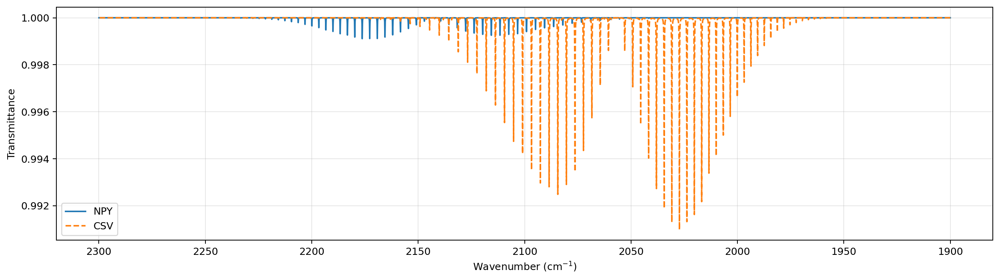

In [5]:
# Convert NPY to wavenumber
nu_npy = 1e4 / lam_npy_p
idx = np.argsort(nu_npy)
nu_npy = nu_npy[idx]
T_npy2 = T_npy_p[idx]

# CSV already in cm^-1: nu_csv_cm1, T_csv (crop it in nu-space)
nu_csv = np.asarray(nu_csv_cm1)
T_csv2 = np.asarray(T_csv)
idxc = np.argsort(nu_csv)
nu_csv = nu_csv[idxc]
T_csv2 = T_csv2[idxc]

# Crop both to overlap
lo = max(nu_npy.min(), nu_csv.min())
hi = min(nu_npy.max(), nu_csv.max())
m1 = (nu_npy >= lo) & (nu_npy <= hi)
m2 = (nu_csv >= lo) & (nu_csv <= hi)

plt.figure(figsize=(14,4), dpi=180)
plt.plot(nu_npy[m1], T_npy2[m1], label="NPY")
plt.plot(nu_csv[m2], T_csv2[m2], '--', label="CSV")
plt.gca().invert_xaxis()  # optional, many people like decreasing ν
plt.grid(alpha=0.3)
plt.xlabel("Wavenumber (cm$^{-1}$)")
plt.ylabel("Transmittance")
plt.legend()
plt.tight_layout()
plt.show()


In [3]:
nu = np.loadtxt(csv_path, comments="#", usecols=(0,))
dnu = np.diff(nu)
print("CSV median Δν:", np.median(dnu))
print("CSV min/max Δν:", dnu.min(), dnu.max())
print("CSV N:", nu.size)


CSV median Δν: 0.02299999999991087
CSV min/max Δν: 0.022999999999683496 0.023000000000138243
CSV N: 17393


## **RADIS vs Photonix vs SpectralCal**

In [6]:
import numpy as np

def load_spectralcalc_txt(path):
    """
    Loads SpectralCalc exported text file with wavelength in micrometers.
    Assumes first two numeric columns are: lambda_um, transmittance
    Ignores comment/header lines that start with '#', ';', or non-numeric.
    """
    xs, ys = [], []
    with open(path, "r") as f:
        for line in f:
            s = line.strip()
            if not s:
                continue
            if s.startswith(("#",";")):
                continue
            parts = s.replace(",", " ").split()
            if len(parts) < 2:
                continue
            try:
                x = float(parts[0])
                y = float(parts[1])
            except ValueError:
                continue
            xs.append(x); ys.append(y)
    x = np.asarray(xs, np.float64)
    y = np.asarray(ys, np.float64)
    if x.size == 0:
        raise ValueError("No numeric data found in SpectralCalc file.")
    # sort by wavelength
    idx = np.argsort(x)
    return x[idx], y[idx]


In [2]:
def wavenumber_to_wavelength_um(nu_cm1):
    return 1e4 / np.asarray(nu_cm1, np.float64)


Points: SpectralCalc 357944 | NPY 15918 | CSV 17393
MAE vs SpectralCalc: NPY=4.751e-07, CSV=8.851e-05


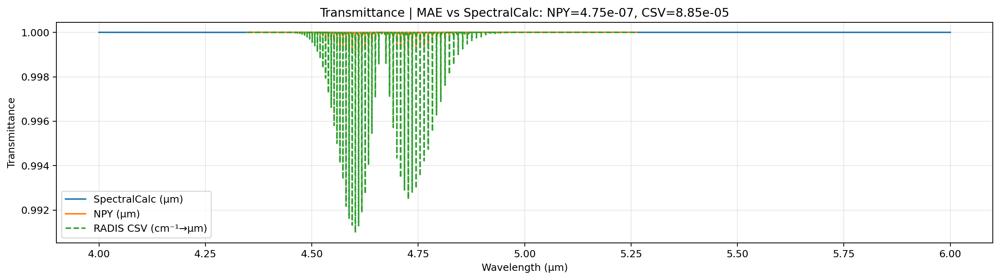

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Paths
npy_path  = "OUT_RADIS/Simulated_CO.npy"                 # (lambda_um, T)
csv_path  = "OUT_RADIS_GT/hitran_CO_1900_2300cm-1_288.2K_1.01325atm.csv"        # (nu_cm1, T)
spec_path = "GT_PROFE_TXT/CO_4-10.txt"                 # (lambda_um, T)

lam_min_plot = 4.0
lam_max_plot = 6.0

def unpack_npy_spectrum(a):
    a = np.asarray(a)
    if a.ndim != 2:
        raise ValueError(f"Expected 2D, got {a.shape}")
    if a.shape[0] == 2 and a.shape[1] != 2:
        x, y = a[0], a[1]
    elif a.shape[1] == 2 and a.shape[0] != 2:
        x, y = a[:, 0], a[:, 1]
    else:
        raise ValueError(f"Expected (2,N) or (N,2), got {a.shape}")
    return np.asarray(x, np.float64), np.asarray(y, np.float64)

def load_csv_wavenumber_transmittance(csv_path):
    df = pd.read_csv(
        csv_path,
        comment="#",
        sep=r"\s+",
        header=None,
        names=["nu_cm1", "T"],
        engine="python",
    ).dropna()
    return df["nu_cm1"].to_numpy(np.float64), df["T"].to_numpy(np.float64)

def wavenumber_to_wavelength_um(nu_cm1):
    return 1e4 / np.asarray(nu_cm1, np.float64)

def crop(x, y, xmin=None, xmax=None):
    m = np.ones_like(x, dtype=bool)
    if xmin is not None: m &= x >= xmin
    if xmax is not None: m &= x <= xmax
    return x[m], y[m]

def mae_interp_on_ref(x_ref, y_ref, x_other, y_other):
    lo = max(x_ref.min(), x_other.min())
    hi = min(x_ref.max(), x_other.max())
    m = (x_ref >= lo) & (x_ref <= hi)
    if not np.any(m):
        return np.nan
    y_i = np.interp(x_ref[m], x_other, y_other)
    return np.mean(np.abs(y_ref[m] - y_i))

def load_spectralcalc_txt(path):
    xs, ys = [], []
    with open(path, "r") as f:
        for line in f:
            s = line.strip()
            if not s:
                continue
            if s.startswith(("#",";")):
                continue
            parts = s.replace(",", " ").split()
            if len(parts) < 2:
                continue
            try:
                x = float(parts[0]); y = float(parts[1])
            except ValueError:
                continue
            xs.append(x); ys.append(y)
    x = np.asarray(xs, np.float64)
    y = np.asarray(ys, np.float64)
    if x.size == 0:
        raise ValueError("No numeric data found in SpectralCalc file.")
    idx = np.argsort(x)
    return x[idx], y[idx]

# --- Load NPY (already µm)
lam_npy, T_npy = unpack_npy_spectrum(np.load(npy_path))
idx = np.argsort(lam_npy)
lam_npy, T_npy = lam_npy[idx], T_npy[idx]
lam_npy, T_npy = crop(lam_npy, T_npy, lam_min_plot, lam_max_plot)

# --- Load RADIS CSV (cm^-1 -> µm)
nu_csv, T_csv = load_csv_wavenumber_transmittance(csv_path)
lam_csv = wavenumber_to_wavelength_um(nu_csv)
idx = np.argsort(lam_csv)
lam_csv, T_csv = lam_csv[idx], T_csv[idx]
lam_csv, T_csv = crop(lam_csv, T_csv, lam_min_plot, lam_max_plot)

# --- Load SpectralCalc (already µm)
lam_sc, T_sc = load_spectralcalc_txt(spec_path)
lam_sc, T_sc = crop(lam_sc, T_sc, lam_min_plot, lam_max_plot)

# --- Compute MAEs against SpectralCalc as reference (optional)
mae_npy = mae_interp_on_ref(lam_sc, T_sc, lam_npy, T_npy)
mae_csv = mae_interp_on_ref(lam_sc, T_sc, lam_csv, T_csv)

print("Points: SpectralCalc", lam_sc.size, "| NPY", lam_npy.size, "| CSV", lam_csv.size)
print(f"MAE vs SpectralCalc: NPY={mae_npy:.3e}, CSV={mae_csv:.3e}")

# --- Plot
plt.figure(figsize=(14,4), dpi=180)
plt.plot(lam_sc,  T_sc,  label="SpectralCalc (µm)")
plt.plot(lam_npy, T_npy, label="NPY (µm)")
plt.plot(lam_csv, T_csv, '--', label="RADIS CSV (cm⁻¹→µm)")
plt.grid(alpha=0.3)
plt.xlabel("Wavelength (µm)")
plt.ylabel("Transmittance")
plt.title(f"Transmittance | MAE vs SpectralCalc: NPY={mae_npy:.2e}, CSV={mae_csv:.2e}")
plt.legend()
plt.tight_layout()
plt.show()


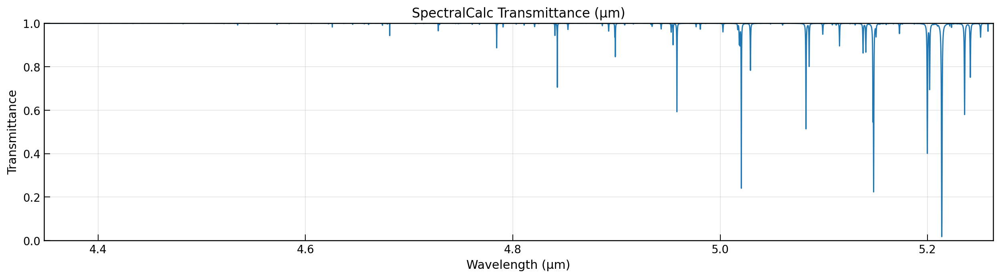

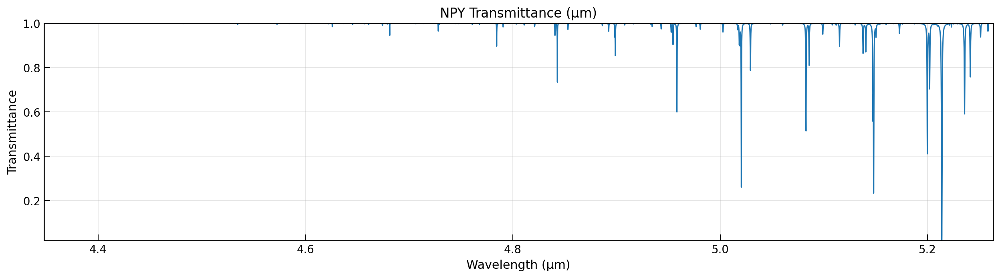

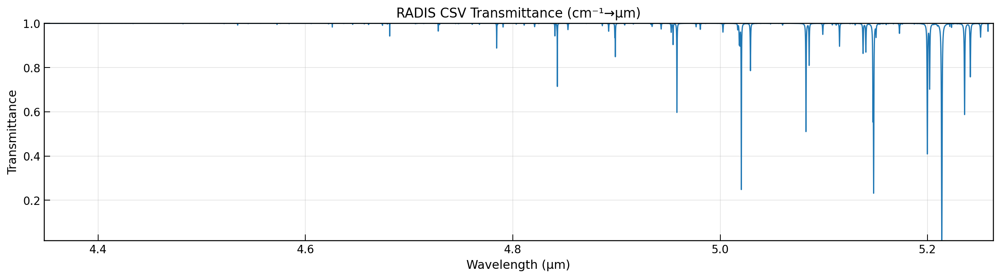

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Choose common x-limits (overlap of all three)
lam_lo = max(lam_sc.min(), lam_npy.min(), lam_csv.min())
lam_hi = min(lam_sc.max(), lam_npy.max(), lam_csv.max())

def plot_single(lam, T, title, xlim=(None, None)):
    plt.figure(figsize=(14, 4), dpi=180)
    plt.plot(lam, T, lw=1.2) 
    plt.grid(alpha=0.3)
    plt.xlabel("Wavelength (µm)")
    plt.ylabel("Transmittance")
    if xlim[0] is not None and xlim[1] is not None:
        plt.xlim(xlim)
    plt.ylim(max(0.0, T.min() - 0.001), min(1.0, T.max() + 0.001))
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_single(lam_sc,  T_sc,  "SpectralCalc Transmittance (µm)", xlim=(lam_lo, lam_hi))
plot_single(lam_npy, T_npy, "NPY Transmittance (µm)",         xlim=(lam_lo, lam_hi))
plot_single(lam_csv, T_csv, "RADIS CSV Transmittance (cm⁻¹→µm)", xlim=(lam_lo, lam_hi))


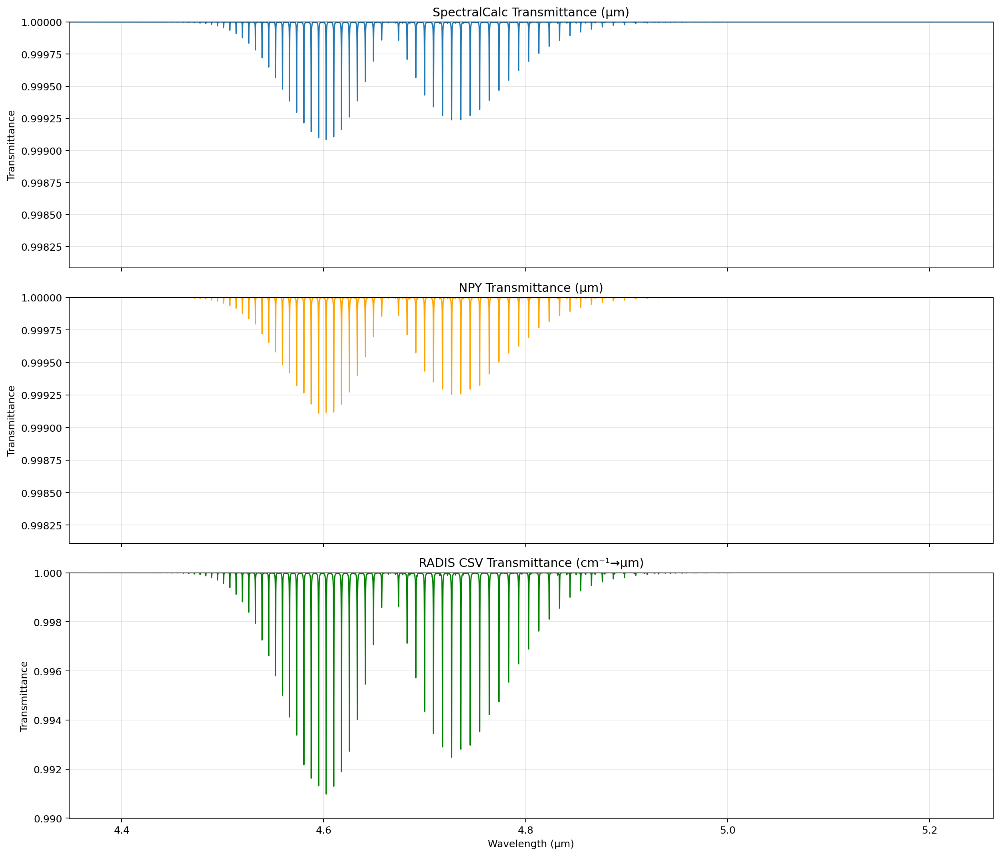

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Choose common x-limits (overlap of all three)
# Assuming these variables are already defined in the notebook context:
# lam_sc, T_sc, lam_npy, T_npy, lam_csv, T_csv

lam_lo = max(lam_sc.min(), lam_npy.min(), lam_csv.min())
lam_hi = min(lam_sc.max(), lam_npy.max(), lam_csv.max())

fig, axes = plt.subplots(3, 1, figsize=(14, 12), dpi=180, sharex=True)

# Dataset 1: SpectralCalc
ax = axes[0]
ax.plot(lam_sc, T_sc, lw=1.2, label='SpectralCalc')
ax.set_title("SpectralCalc Transmittance (µm)")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.set_ylim(max(0.0, T_sc.min() - 0.001), min(1.0, T_sc.max() + 0.001))

# Dataset 2: NPY
ax = axes[1]
ax.plot(lam_npy, T_npy, lw=1.2, color='orange', label='NPY')
ax.set_title("NPY Transmittance (µm)")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.set_ylim(max(0.0, T_npy.min() - 0.001), min(1.0, T_npy.max() + 0.001))

# Dataset 3: RADIS CSV
ax = axes[2]
ax.plot(lam_csv, T_csv, lw=1.2, color='green', label='RADIS CSV')
ax.set_title("RADIS CSV Transmittance (cm⁻¹→µm)")
ax.set_xlabel("Wavelength (µm)")
ax.set_ylabel("Transmittance")
ax.grid(alpha=0.3)
ax.set_ylim(max(0.0, T_csv.min() - 0.001), min(1.0, T_csv.max() + 0.001))

axes[0].set_xlim(lam_lo, lam_hi)

plt.tight_layout()
plt.show()



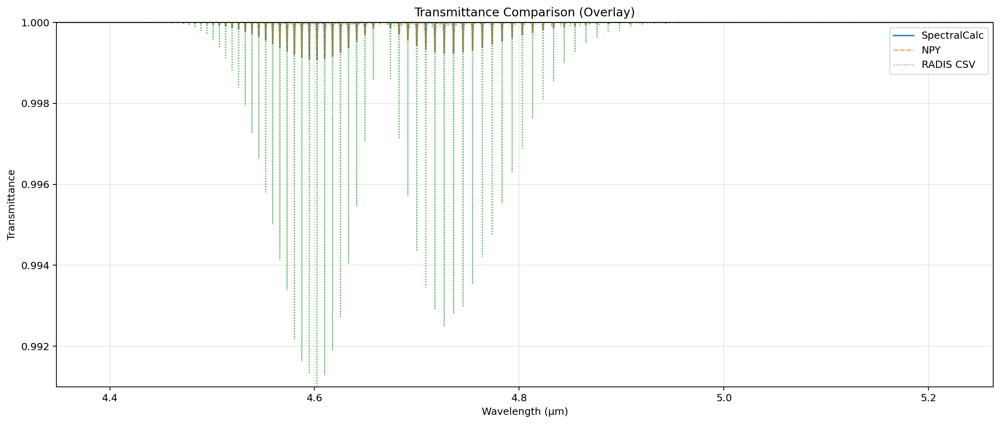

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Choose common x-limits (overlap of all three)
# Assuming variables are defined: lam_sc, T_sc, lam_npy, T_npy, lam_csv, T_csv

lam_lo = max(lam_sc.min(), lam_npy.min(), lam_csv.min())
lam_hi = min(lam_sc.max(), lam_npy.max(), lam_csv.max())

plt.figure(figsize=(14, 6), dpi=180)

# Plot all three on the same axes with different styles
plt.plot(lam_sc, T_sc, lw=1.5, color='#1f77b4', linestyle='-', label='SpectralCalc', alpha=0.9)
plt.plot(lam_npy, T_npy, lw=1.2, color='#ff7f0e', linestyle='--', label='NPY', alpha=0.8)
plt.plot(lam_csv, T_csv, lw=1.0, color='#2ca02c', linestyle=':', label='RADIS CSV', alpha=0.8)

plt.xlabel("Wavelength (µm)")
plt.ylabel("Transmittance")
plt.title("Transmittance Comparison (Overlay)")
plt.legend(loc='best')
plt.grid(alpha=0.3)

plt.xlim(lam_lo, lam_hi)
plt.ylim(0.991, 1.0) 

plt.tight_layout()
plt.show()

